In [1]:
from imblearn.metrics import geometric_mean_score
import numpy as np
import keras
import gc
import tensorflow as tf
from keras.constraints import max_norm
from keras import backend as K
from keras.models import Sequential
from keras.layers import Dense,Dropout,BatchNormalization,LeakyReLU
from keras import optimizers,regularizers
from keras.callbacks import ReduceLROnPlateau,EarlyStopping
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from imblearn.over_sampling import SMOTE, ADASYN
from sklearn.metrics import confusion_matrix
from sklearn.metrics import f1_score
from sklearn import metrics
import time
from datetime import datetime, timedelta
np.random.seed(13)
from sklearn import svm
import pandas as pd
import matplotlib.pyplot as plt
import math
from __future__ import division
from sklearn.model_selection import KFold
from sklearn.preprocessing import normalize

files=['AAPL','AMZN','PEP','GOOGL','MSFT','FB','INTC','CSCO','CMCSA','NVDA','NFLX','BKNG','ADBE','AMGN','TXN','AVGO','PYPL','GILD','COST','QCOM']       
#files=['AAPL','AMZN','GOOGL','MSFT','FB','INTC','CSCO','CMCSA','NVDA','NFLX','ADBE','AMGN','TXN','AVGO','PYPL','GILD','COST','QCOM']       
dates=list()   
prices=list()
sentiment=list()
for file in files:
    param = {
        'q': file, # Stock symbol (ex: "AAPL")
        'i': "900", # Interval size in seconds ("86400" = 1 day intervals)
        'x': "NASD", # INDEXNASDAQStock exchange symbol on which stock is traded (ex: "NASD")
        'p': "2Y" # Period (Ex: "1Y" = 1 year)
        }
    sentimentVector =  pd.read_csv('/home/andrea/Desktop/NLFF/intrinioDatasetUpdated/Sentiment/'+file+'.csv')
    price= pd.read_csv('/home/andrea/Desktop/NLFF/TechnicalDatasetUpdated/'+file+'.csv')
    #sentimentVector =  pd.read_csv('/home/andrea/Desktop/NLFF/intrinioDataset/SentimentFul/'+file+'.csv')
    #price= pd.read_csv('/home/andrea/Desktop/NLFF/TechnicalDataset/indexes'+file+'.csv')
    #alignment of data
    maxdata=max(sentimentVector['initTime'])
    mindata=min(sentimentVector['initTime'])
    price['Unnamed: 0'] = [datetime.strptime(row, '%Y-%m-%d %H:%M:%S') for row in price['Unnamed: 0']]
    price['Unnamed: 0'] = [row-timedelta(hours=8) for row in price['Unnamed: 0']]
    price=price[price['Unnamed: 0']>=mindata]
    price=price[price['Unnamed: 0']<=maxdata]
    dates.append(price['Unnamed: 0'])
    sentimentVector=sentimentVector.drop(['Unnamed: 0', 'initTime' ], axis=1)
    meanvector=np.concatenate((sentimentVector,sentimentVector.rolling(5).mean()),axis=1)
    meanvector=np.concatenate((meanvector,sentimentVector.rolling(10).mean()),axis=1)
    meanvector=np.concatenate((meanvector,sentimentVector.rolling(15).mean()),axis=1)
    meanvector=np.concatenate((meanvector,sentimentVector.rolling(20).mean()),axis=1)
    price=price.drop(['Unnamed: 0'],axis=1)
    #['macd','macds', 'boll_ub', 'boll_lb','rsi_6','rsi_12','vr_6_sma','wr_10','wr_6''close_10_sma''tr''middle_{}_sma'
    #df['dma'] = df['close_10_sma'] - df['close_50_sma'] pdi'] = cls._get_pdi(df, 14)df['mdi'] = cls._get_mdi(df, 14)
    #df['dx'] = cls._get_dx(df, 14) df['adx'] = df['dx_6_ema'] df['adxr'] = df['adx_6_ema']]
    #
    sentiment.append(meanvector)
    prices.append(price)

/home/andrea/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
def smote(x,y):
    X_resampled, y_resampled = SMOTE().fit_sample(x, y)
    #print('check',sum(y_resampled)/len(y_resampled))
    return X_resampled,y_resampled
def balance(x,y):
    posindex=np.where( y == 1 )
    negindex=np.where( y == 0 )
    xt=[]
    yt=[]
    yindex=[]
    nindex=min(len(posindex[0]),len(negindex[0]))

    #for i in range(1,nindex):
    yt=np.concatenate((y[posindex[0][0:nindex]],y[negindex[0][0:nindex]]))
    xt=np.concatenate((x[posindex[0][0:nindex]],x[negindex[0][0:nindex]]))
    
    return xt,yt

def balanceup(x,y):
    posindex=np.where( y == 1 )
    negindex=np.where( y == 0 )
    xt=[]
    yt=[]
    yindex=[]
    
    if(len(posindex[0])!=0 and len(negindex[0])!=0):
       
        nindex=max(len(posindex[0]),len(negindex[0]))
        mini=min(len(posindex[0]),len(negindex[0]))
        diff=nindex-mini
        u=0
        for i in range(0,mini):
            yt.append(y[posindex[0][i]])
            yt.append(y[negindex[0][i]])
            xt.append(x[posindex[0][i]])
            xt.append(x[negindex[0][i]])
        #print('first',sum(yt)/len(yt)) 
        if(len(posindex[0])>len(negindex[0])):
            toextract=negindex
            enter=posindex
        else:
            toextract=posindex
            enter=negindex
        if(diff!=0 and len(toextract[0])!=0):
            for i in range(0,diff):
                r=np.random.randint(0,len(toextract))
                yt.append(y[toextract[0][r]])
                xt.append(x[toextract[0][r]])
                yt.append(y[enter[0][mini+i]])
                xt.append(x[enter[0][mini+i]])
    else:
        #print('Unbalance')
        u=1
        xt=x
        yt=y
    #print(sum(yt)/len(yt))              
    return xt,yt,u
                    

In [3]:
def buildModel(l,n,d,le):
    opt=optimizers.Adam(lr=le)
    model = Sequential()  
    model.add(Dense(n, input_dim=151,kernel_constraint=max_norm(1),activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU()) 
    model.add(Dropout(d))
    model.add(Dense(math.floor(n/2),kernel_constraint=max_norm(1), activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU())
    model.add(Dropout(d))
    model.add(Dense(math.floor(n/4),kernel_constraint=max_norm(1), activity_regularizer=regularizers.l2(l))) 
    model.add(BatchNormalization()) 
    model.add(LeakyReLU()) 
    model.add(Dense(1, activation='sigmoid')) 
    
    model.compile(optimizer=opt,loss='binary_crossentropy', metrics=['accuracy'])
    #o
    return model
def reset_weights(model):
    session=K.get_session()
    for layer in model.layers:
        if(hasattr(layer,'kernel_initializer')):
            layer.kernel.initializer.run(session=session)
            
           

Working on... AAPL
15.571701720841297
0.005338458253266777
working on d,u and l,le 0.5 64 0.01 0.001


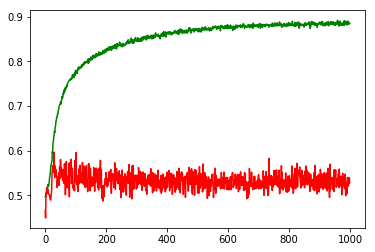

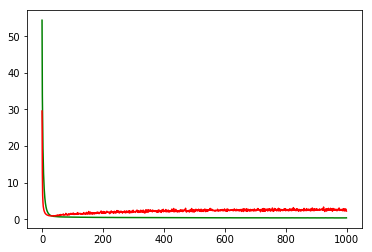

working on d,u and l,le 0.5 64 0.01 0.0001


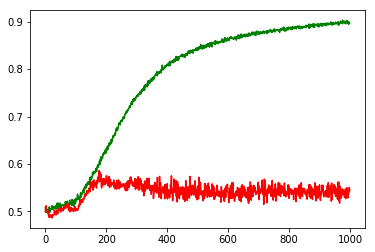

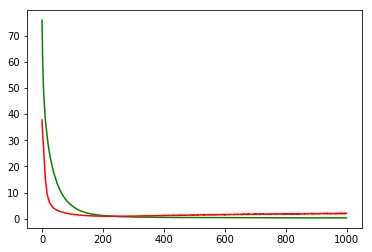

working on d,u and l,le 0.5 64 0.01 1e-05


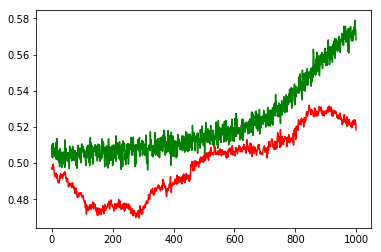

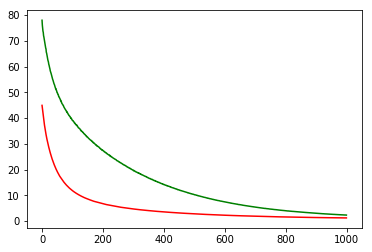

working on d,u and l,le 0.5 64 0.05 0.001


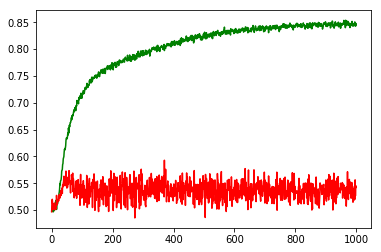

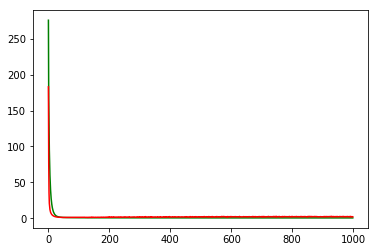

working on d,u and l,le 0.5 64 0.05 0.0001


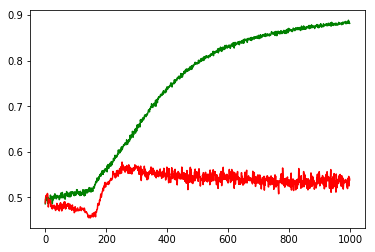

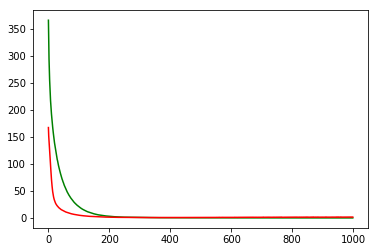

working on d,u and l,le 0.5 64 0.05 1e-05


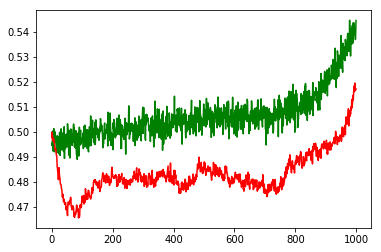

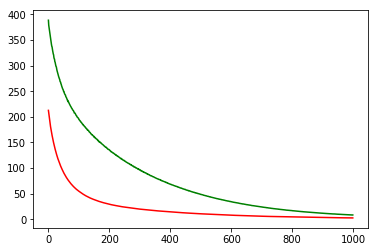

working on d,u and l,le 0.5 128 0.01 0.001


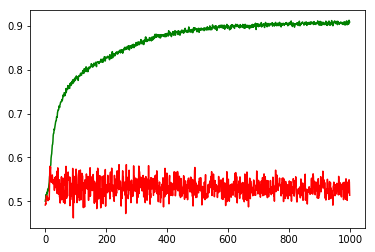

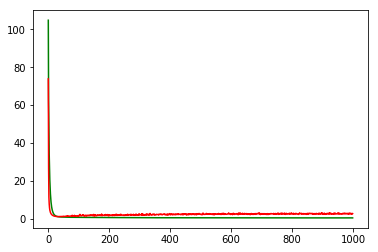

working on d,u and l,le 0.5 128 0.01 0.0001


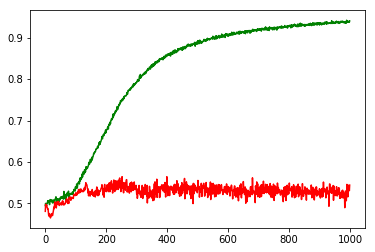

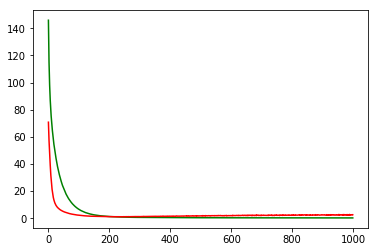

working on d,u and l,le 0.5 128 0.01 1e-05


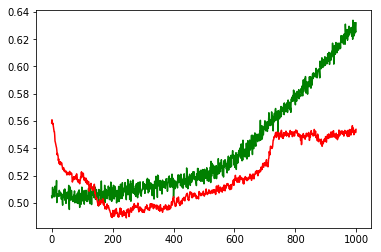

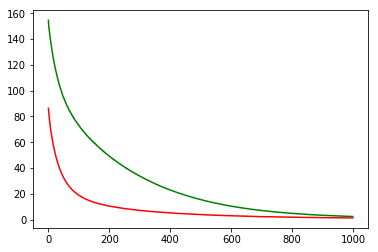

working on d,u and l,le 0.5 128 0.05 0.001


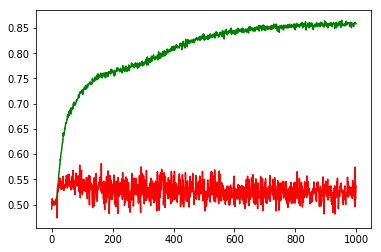

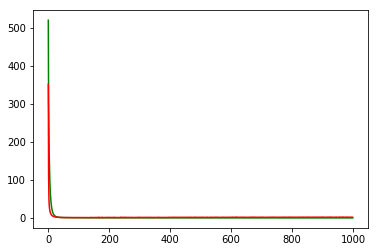

working on d,u and l,le 0.5 128 0.05 0.0001


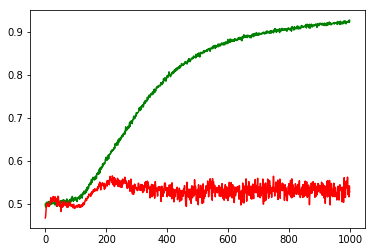

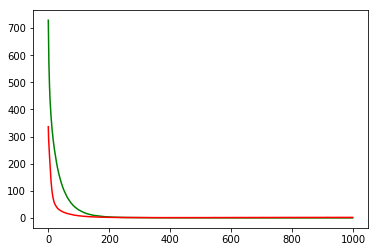

working on d,u and l,le 0.5 128 0.05 1e-05


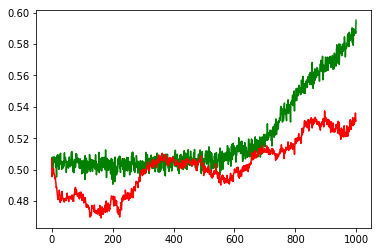

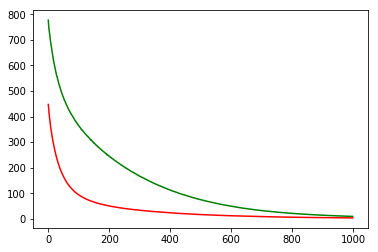

working on d,u and l,le 0.5 256 0.01 0.001


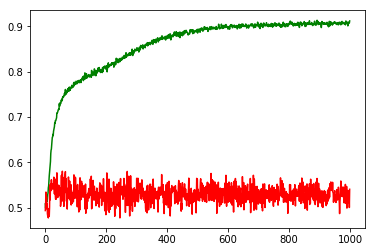

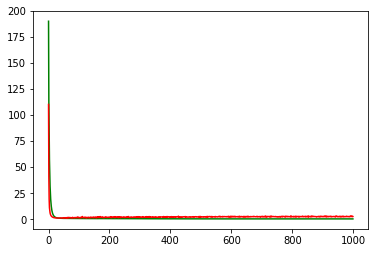

working on d,u and l,le 0.5 256 0.01 0.0001


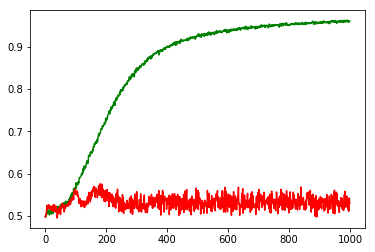

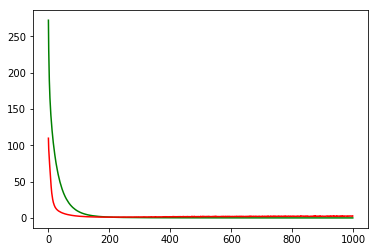

working on d,u and l,le 0.5 256 0.01 1e-05


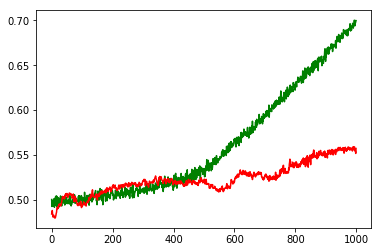

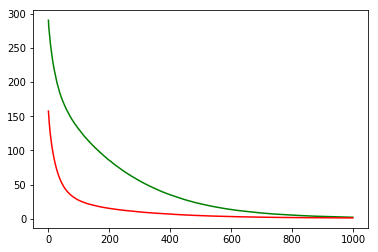

working on d,u and l,le 0.5 256 0.05 0.001


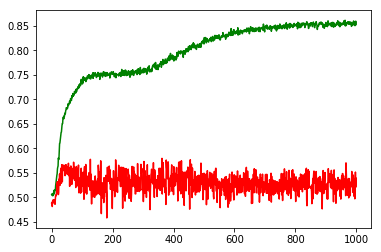

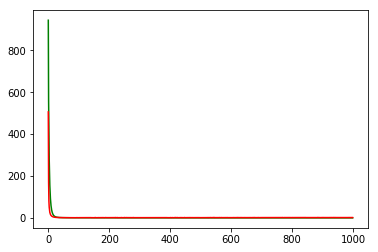

working on d,u and l,le 0.5 256 0.05 0.0001


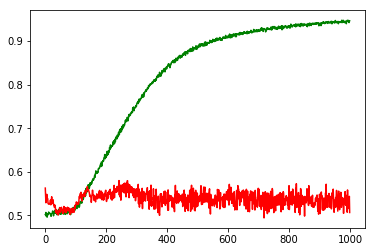

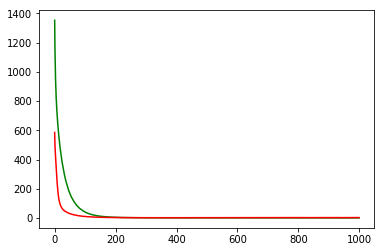

working on d,u and l,le 0.5 256 0.05 1e-05


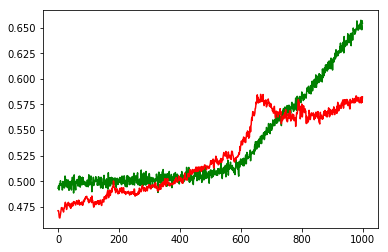

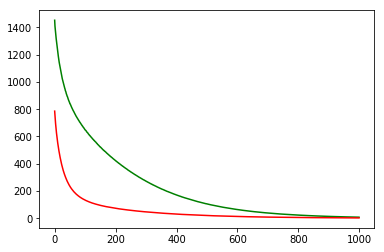

maxd,maxu,maxl,maxle: 0.5 64 0.01 0.001
Chart for BEST MODEL FOR: AAPL


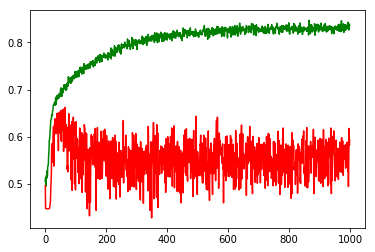

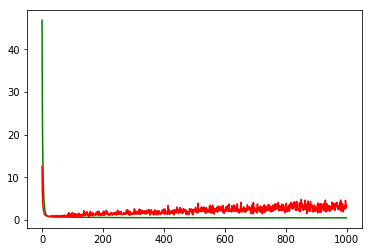

F1,score 0.5208333333333334
G-score: 0.5766696514432791
Accuracy 0.5929203567251695
Window: 140
[[420  86]
 [374 250]]
Vol pos 3.7341152535719235
Vol neg 2.3584373961062663
Real Percentage of gain: 69.95877858837521
Percentage of gain: 1.2539610775967311
Total gain: 1416.9760176843063
000000000000000000000000000000000000000000000000
Percentile:  0
[[322  56]
 [301  74]]
753/753 [==============================] - 0s 23us/step
[4.141662069961211, 0.5258964146592544]
Percentile:  1
[[45 23]
 [41 43]]
152/152 [==============================] - 0s 35us/step
[3.3726798484199927, 0.5789473684210527]
Percentile:  2
[[53  7]
 [ 7 72]]
139/139 [==============================] - 0s 27us/step
[0.283943013589588, 0.8992805755395683]
Percentile:  3
[[ 0  0]
 [12 37]]
49/49 [==============================] - 0s 38us/step
[0.628090574425094, 0.7551020420327479]
Percentile:  4
[[ 0  0]
 [12 23]]
35/35 [==============================] - 0s 99us/step
[0.4847559230668204, 0.657142857994352]
00000000000000

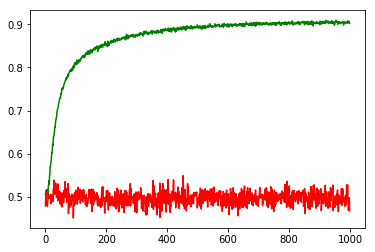

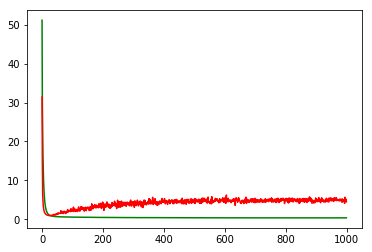

working on d,u and l,le 0.5 64 0.01 0.0001


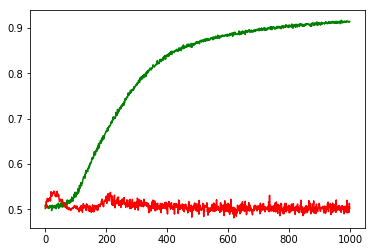

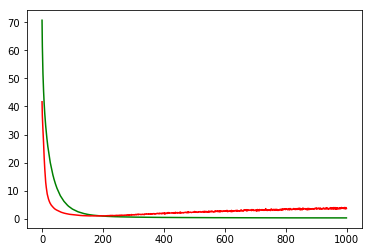

working on d,u and l,le 0.5 64 0.01 1e-05


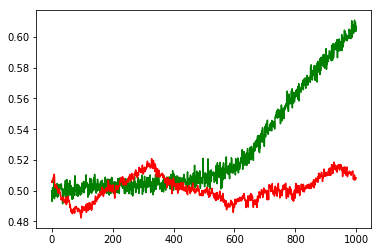

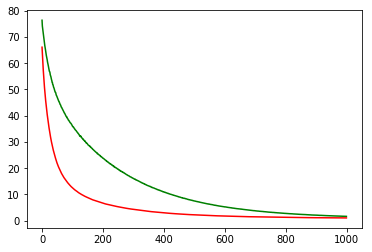

working on d,u and l,le 0.5 64 0.05 0.001


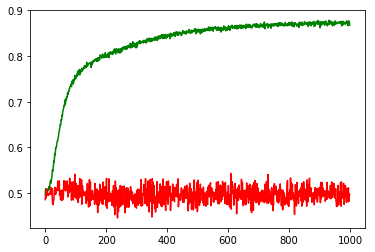

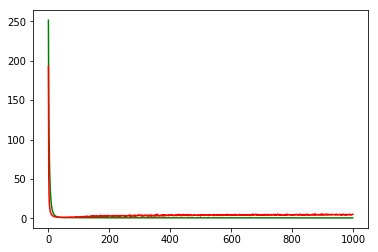

working on d,u and l,le 0.5 64 0.05 0.0001


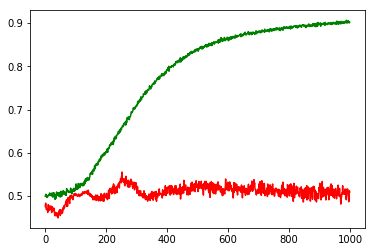

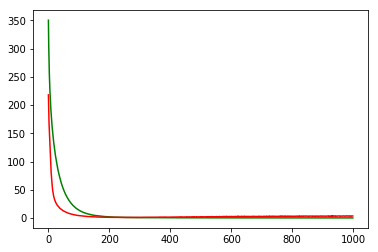

working on d,u and l,le 0.5 64 0.05 1e-05


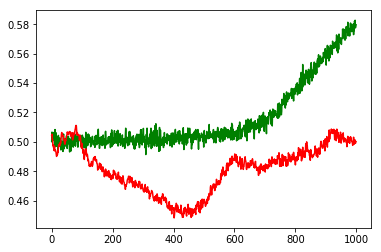

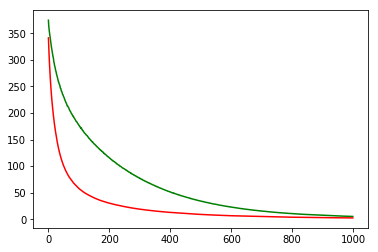

working on d,u and l,le 0.5 128 0.01 0.001


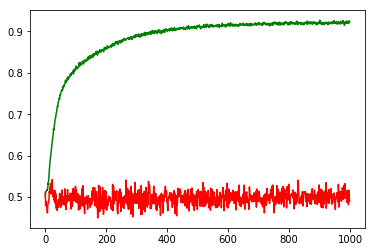

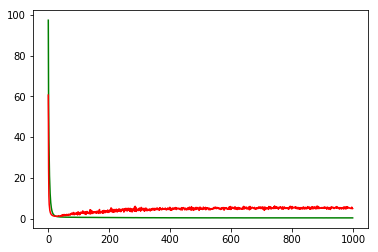

working on d,u and l,le 0.5 128 0.01 0.0001


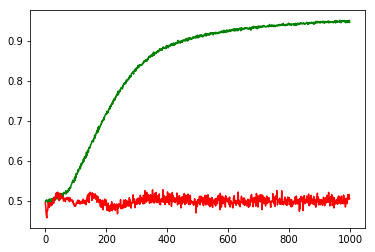

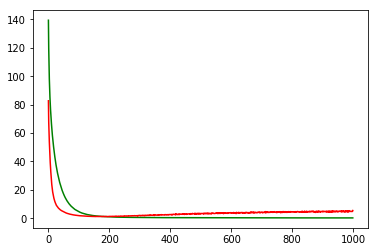

working on d,u and l,le 0.5 128 0.01 1e-05


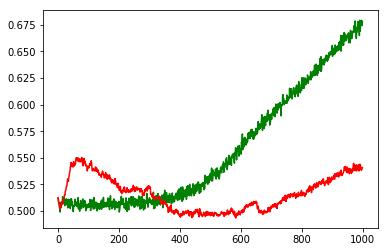

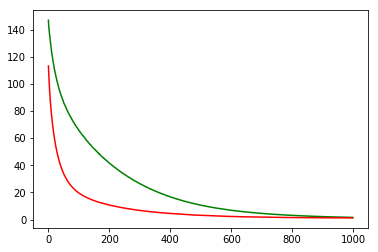

working on d,u and l,le 0.5 128 0.05 0.001


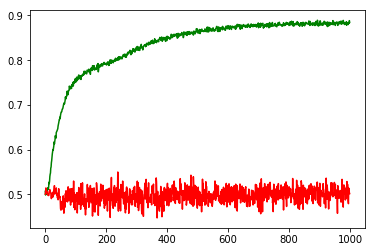

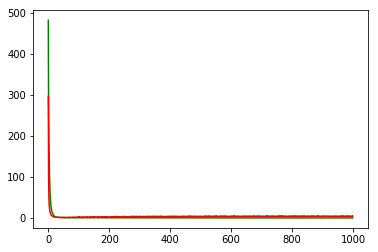

working on d,u and l,le 0.5 128 0.05 0.0001


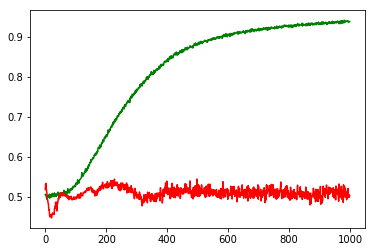

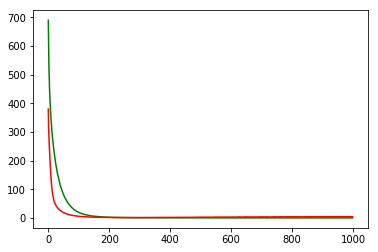

working on d,u and l,le 0.5 128 0.05 1e-05


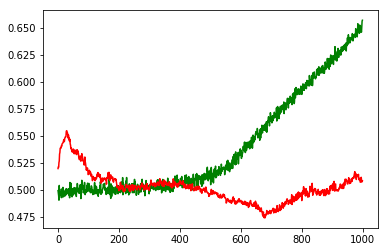

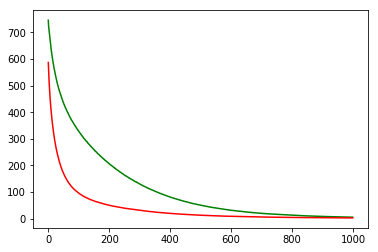

working on d,u and l,le 0.5 256 0.01 0.001


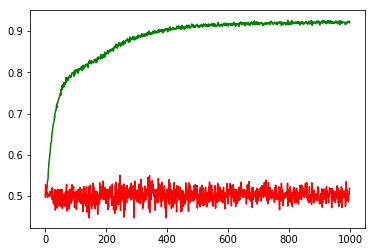

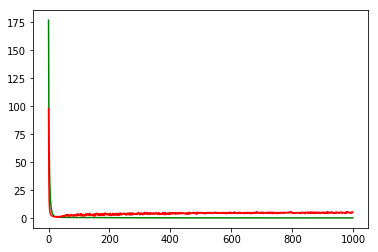

working on d,u and l,le 0.5 256 0.01 0.0001


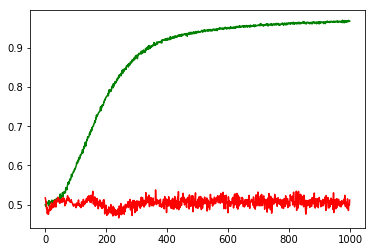

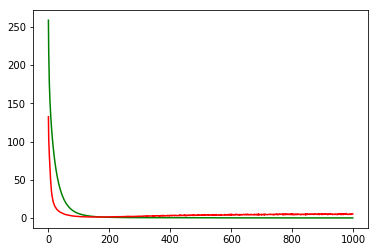

working on d,u and l,le 0.5 256 0.01 1e-05


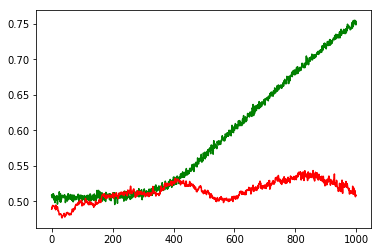

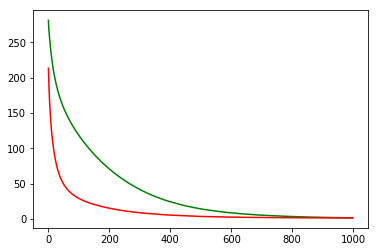

working on d,u and l,le 0.5 256 0.05 0.001


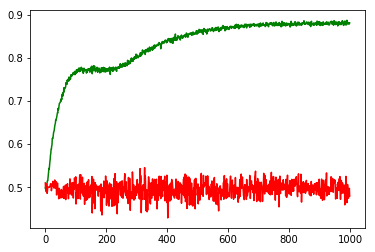

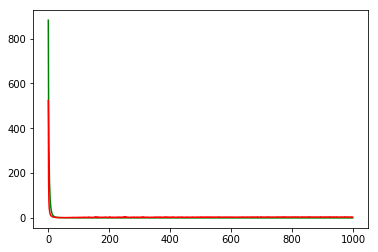

working on d,u and l,le 0.5 256 0.05 0.0001


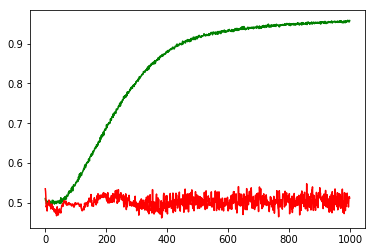

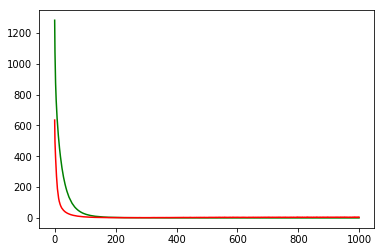

working on d,u and l,le 0.5 256 0.05 1e-05


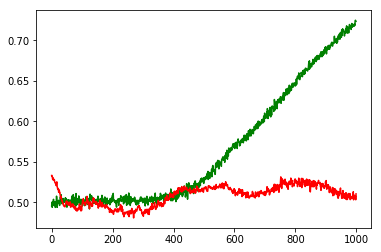

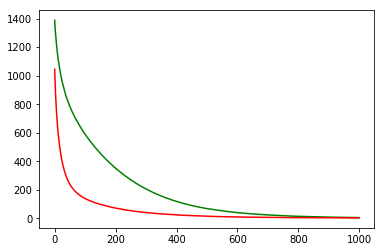

maxd,maxu,maxl,maxle: 0.5 128 0.01 1e-05
Chart for BEST MODEL FOR: AMZN


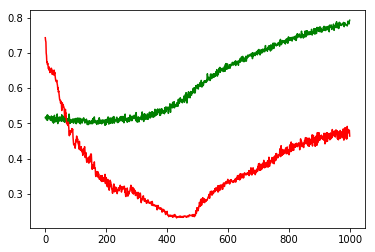

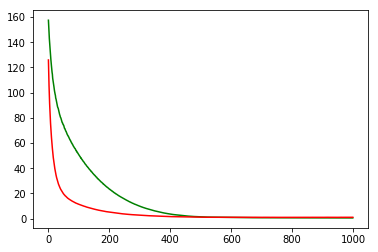

F1,score 0.5781792911744268
G-score: 0.45282990426366576
Accuracy 0.4637809195703837
Window: 140
[[109 142]
 [465 416]]
Vol pos 2.2281347666167437
Vol neg 2.4795386433708333
Real Percentage of gain: 4.002971368866822
Percentage of gain: -0.2962095442158175
Total gain: -335.3092040523054
000000000000000000000000000000000000000000000000
Percentile:  0
[[106  93]
 [243 188]]
630/630 [==============================] - 0s 24us/step
[0.9489691359656197, 0.46666666685588776]
Percentile:  1
[[  3  33]
 [164 185]]
385/385 [==============================] - 0s 25us/step
[0.9987698129729017, 0.4883116883116883]
Percentile:  2
[[ 0 16]
 [24 36]]
76/76 [==============================] - 0s 49us/step
[0.9059787925920988, 0.47368421052631576]
Percentile:  3
[[ 0  0]
 [29  4]]
33/33 [==============================] - 0s 55us/step
[1.2372837301456567, 0.12121212121212122]
Percentile:  4
[[0 0]
 [5 1]]
6/6 [==============================] - 0s 98us/step
[1.3176648616790771, 0.1666666716337204]
000000000

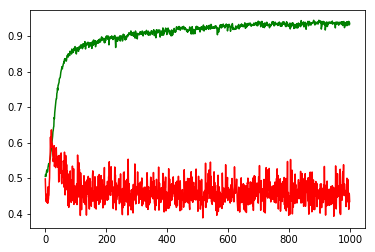

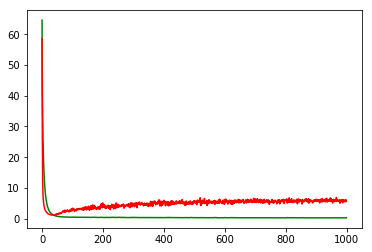

working on d,u and l,le 0.5 64 0.01 0.0001


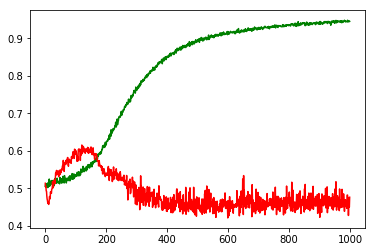

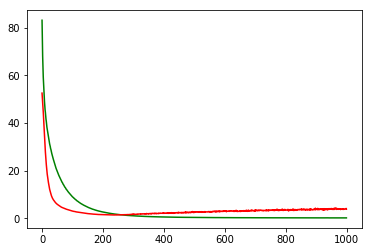

working on d,u and l,le 0.5 64 0.01 1e-05


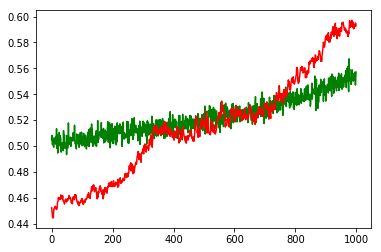

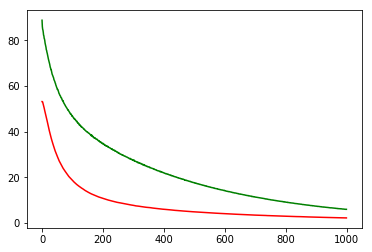

working on d,u and l,le 0.5 64 0.05 0.001


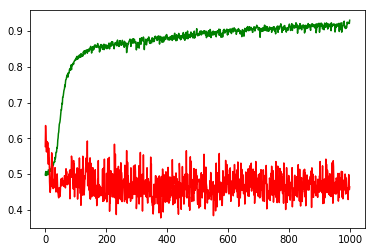

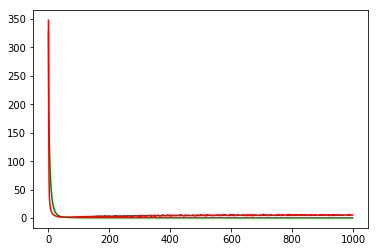

working on d,u and l,le 0.5 64 0.05 0.0001


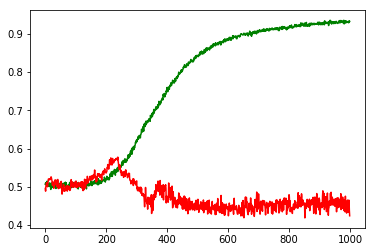

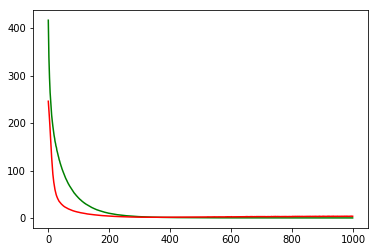

working on d,u and l,le 0.5 64 0.05 1e-05


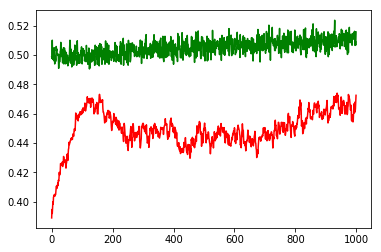

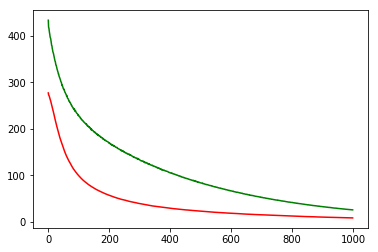

working on d,u and l,le 0.5 128 0.01 0.001


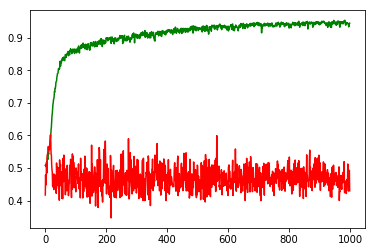

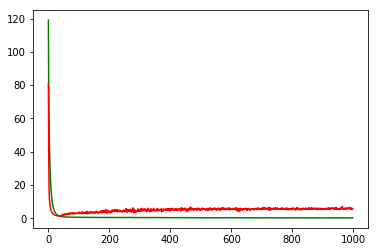

working on d,u and l,le 0.5 128 0.01 0.0001


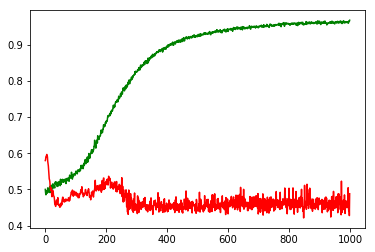

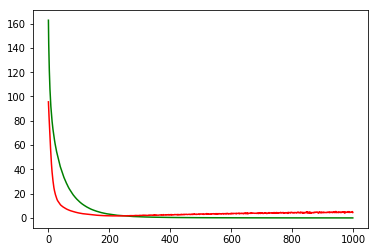

working on d,u and l,le 0.5 128 0.01 1e-05


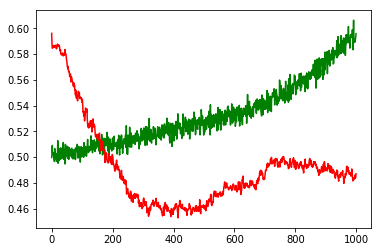

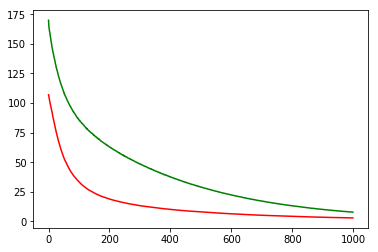

working on d,u and l,le 0.5 128 0.05 0.001


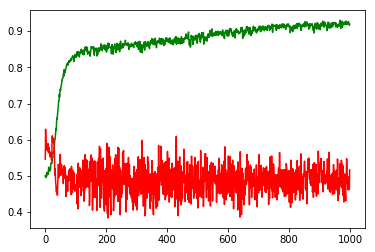

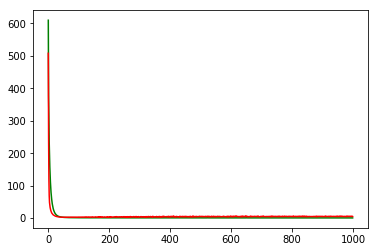

working on d,u and l,le 0.5 128 0.05 0.0001


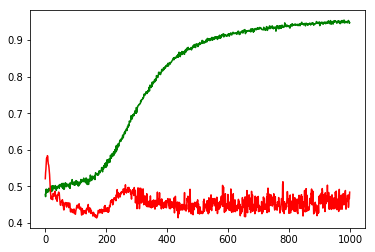

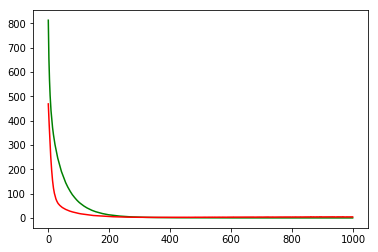

working on d,u and l,le 0.5 128 0.05 1e-05


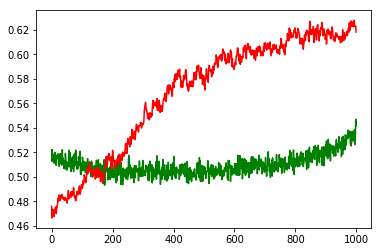

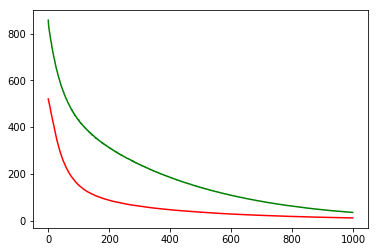

working on d,u and l,le 0.5 256 0.01 0.001


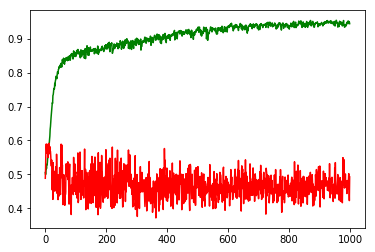

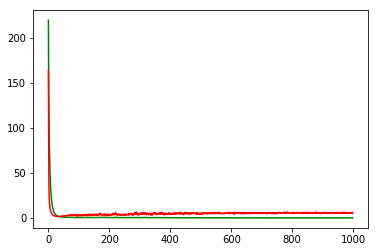

working on d,u and l,le 0.5 256 0.01 0.0001


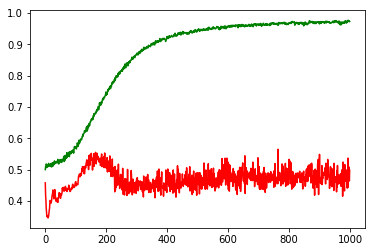

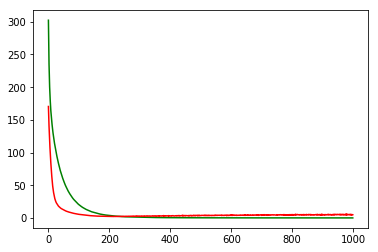

working on d,u and l,le 0.5 256 0.01 1e-05


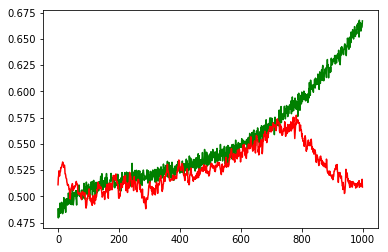

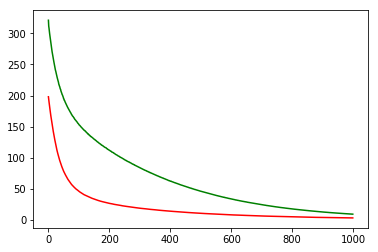

working on d,u and l,le 0.5 256 0.05 0.001


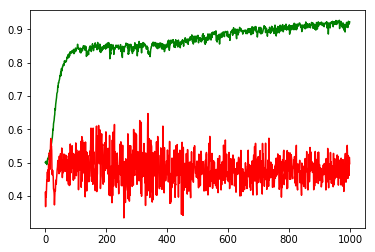

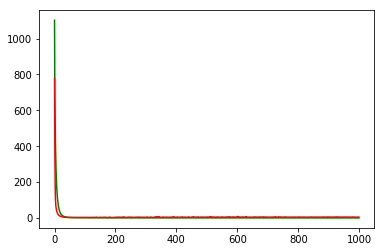

working on d,u and l,le 0.5 256 0.05 0.0001


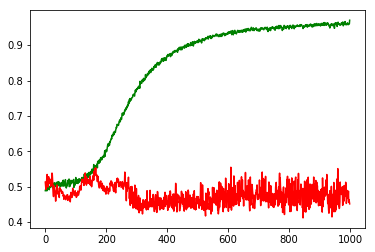

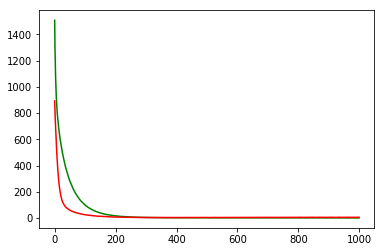

working on d,u and l,le 0.5 256 0.05 1e-05


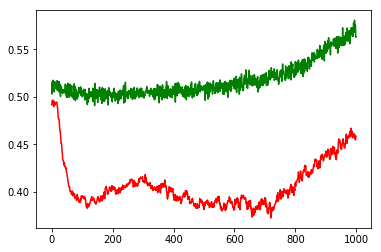

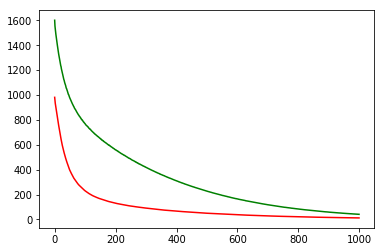

maxd,maxu,maxl,maxle: 0.5 128 0.05 1e-05
Chart for BEST MODEL FOR: PEP


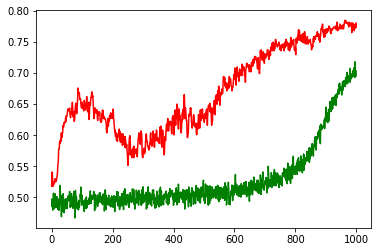

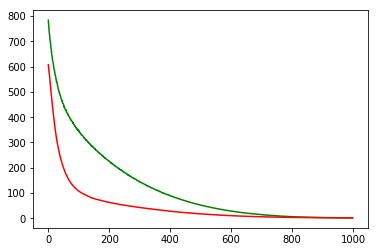

F1,score 0.8672237697307335
G-score: 0.6129649742478204
Accuracy 0.7803379416740435
Window: 140
[[ 41  50]
 [ 93 467]]
Vol pos 2.3455065522905127
Vol neg 1.1476542231273614
Real Percentage of gain: 91.01717928340742
Percentage of gain: 1.578191666138814
Total gain: 1027.402774656368
000000000000000000000000000000000000000000000000
Percentile:  0
[[33 39]
 [25 85]]
182/182 [==============================] - 0s 32us/step
[0.8311834780724494, 0.6483516480241504]
Percentile:  1
[[ 8 11]
 [54 88]]
161/161 [==============================] - 0s 40us/step
[0.8812741211482457, 0.5962732919254659]
Percentile:  2
[[  0   0]
 [ 14 172]]
186/186 [==============================] - 0s 26us/step
[0.667073510026419, 0.9247311802320582]
Percentile:  3
[[76]]
76/76 [==============================] - 0s 40us/step
[0.4666819894000104, 1.0]
Percentile:  4
[[45]]
45/45 [==============================] - 0s 67us/step
[0.40591612127092147, 1.0]
000000000000000000000000000000000000000000000000
Working on... GOO

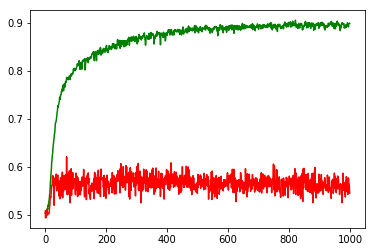

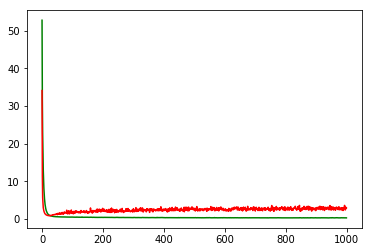

working on d,u and l,le 0.5 64 0.01 0.0001


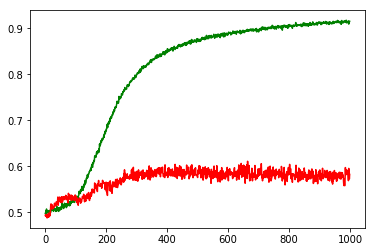

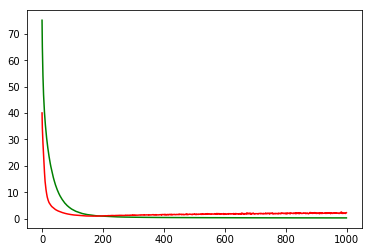

working on d,u and l,le 0.5 64 0.01 1e-05


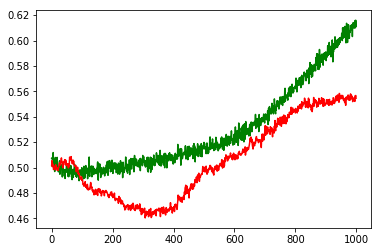

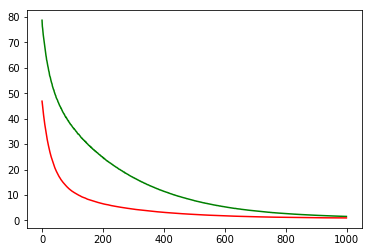

working on d,u and l,le 0.5 64 0.05 0.001


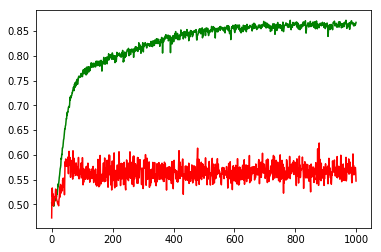

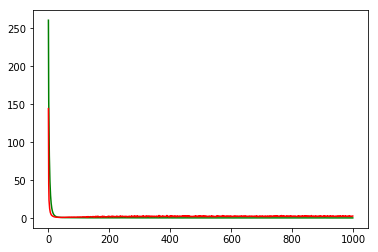

working on d,u and l,le 0.5 64 0.05 0.0001


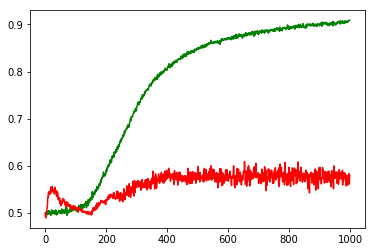

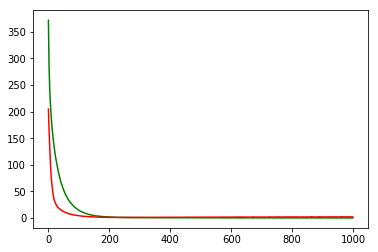

working on d,u and l,le 0.5 64 0.05 1e-05


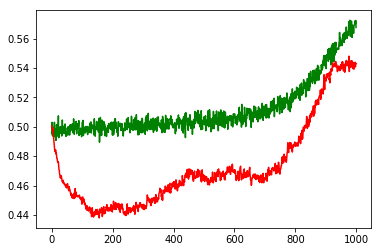

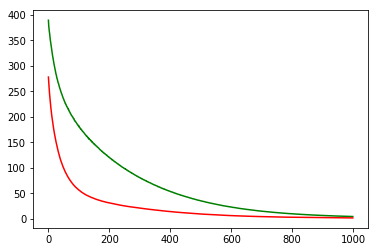

working on d,u and l,le 0.5 128 0.01 0.001


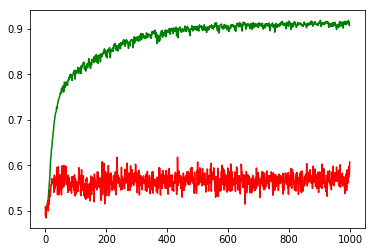

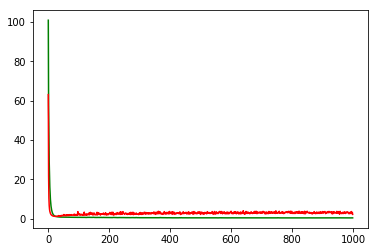

working on d,u and l,le 0.5 128 0.01 0.0001


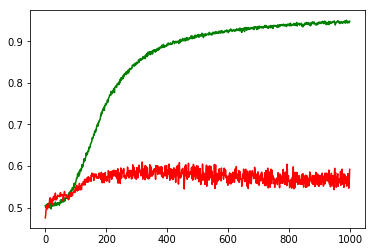

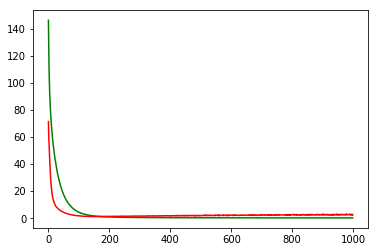

working on d,u and l,le 0.5 128 0.01 1e-05


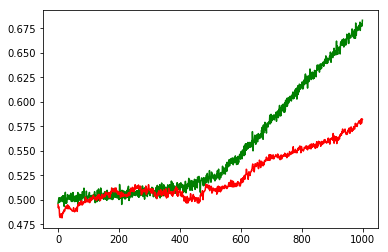

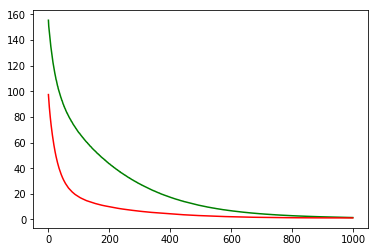

working on d,u and l,le 0.5 128 0.05 0.001


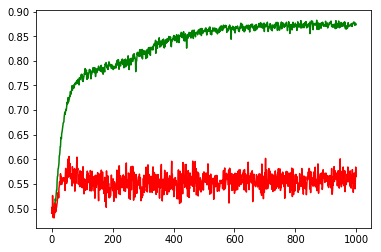

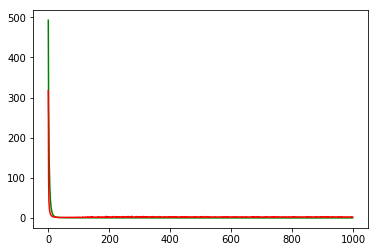

working on d,u and l,le 0.5 128 0.05 0.0001


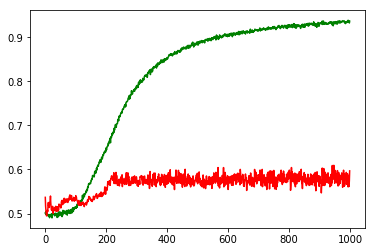

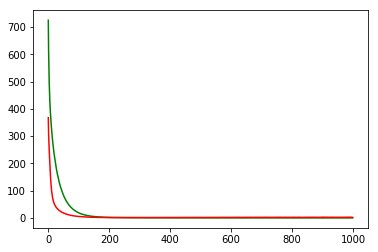

working on d,u and l,le 0.5 128 0.05 1e-05


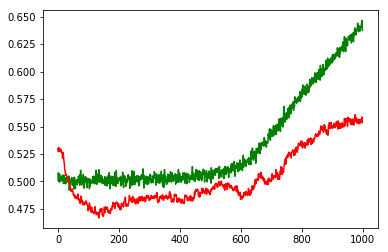

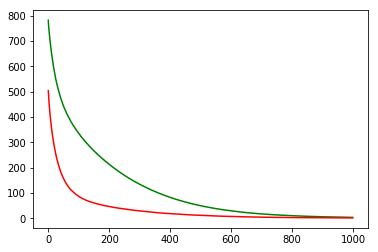

working on d,u and l,le 0.5 256 0.01 0.001


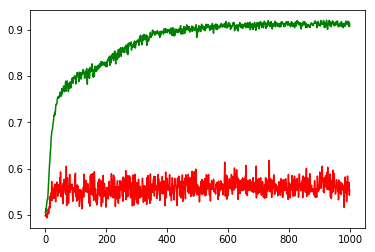

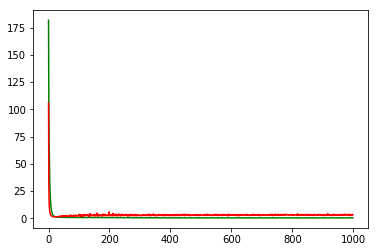

working on d,u and l,le 0.5 256 0.01 0.0001


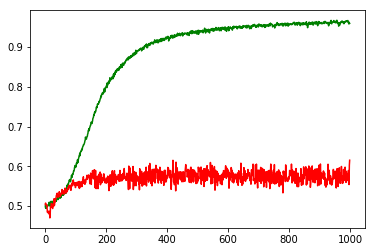

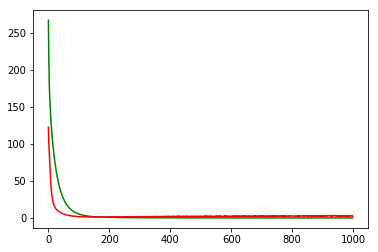

working on d,u and l,le 0.5 256 0.01 1e-05


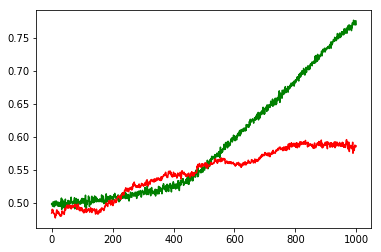

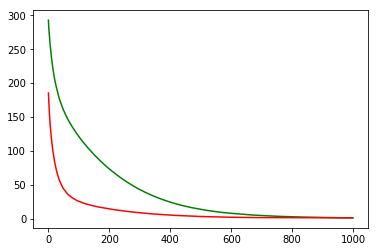

working on d,u and l,le 0.5 256 0.05 0.001


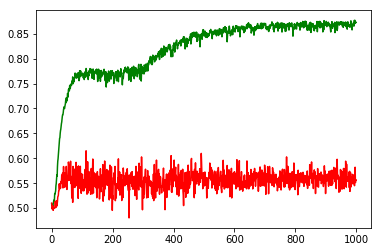

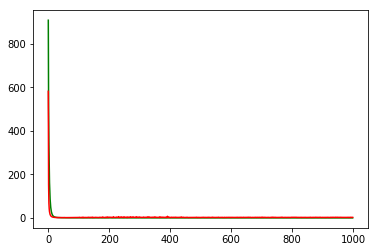

working on d,u and l,le 0.5 256 0.05 0.0001


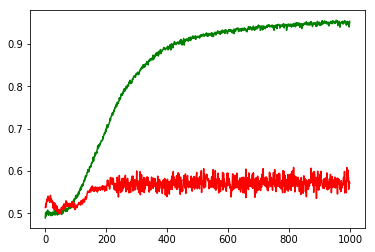

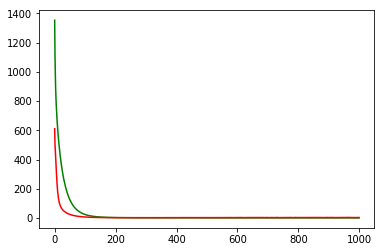

working on d,u and l,le 0.5 256 0.05 1e-05


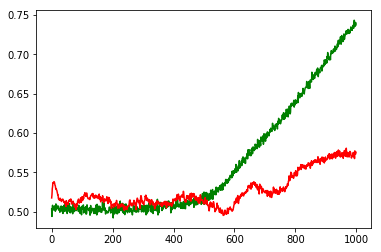

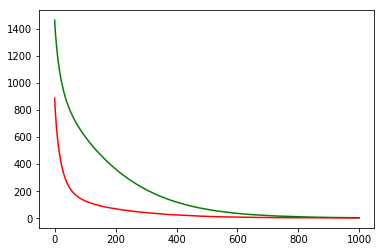

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: GOOGL


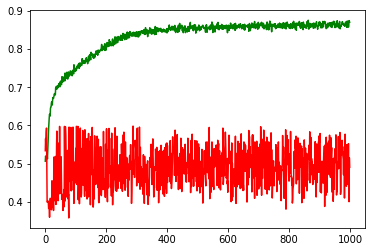

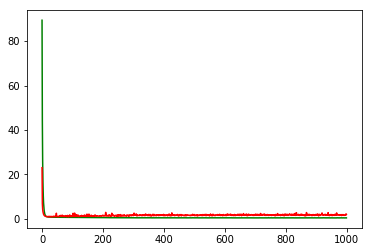

F1,score 0.6269430051813472
G-score: 0.3321345966824148
Accuracy 0.49026548704214856
Window: 140
[[ 70 385]
 [191 484]]
Vol pos 3.3491026206442105
Vol neg 2.576523325766575
Real Percentage of gain: 50.77231558640862
Percentage of gain: 0.32860656300473035
Total gain: 371.32541619534527
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 41 191]
 [ 57 122]]
411/411 [==============================] - 0s 28us/step
[2.275859132880422, 0.3965936733858429]
Percentile:  1
[[  9 102]
 [ 74 178]]
363/363 [==============================] - 0s 31us/step
[1.7749489347139995, 0.5151515154799154]
Percentile:  2
[[18 79]
 [37 72]]
206/206 [==============================] - 0s 31us/step
[2.0172658302251576, 0.43689320214743754]
Percentile:  3
[[ 1 13]
 [15 72]]
101/101 [==============================] - 0s 50us/step
[1.1218359997071843, 0.7227722772277227]
Percentile:  4
[[ 0  0]
 [ 8 39]]
47/47 [==============================] - 0s 56us/step
[0.3473636311419467, 0.8297872365789211]
000

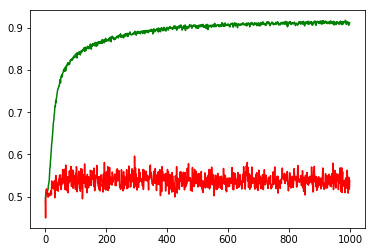

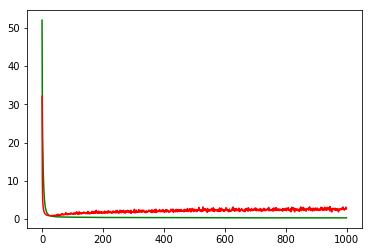

working on d,u and l,le 0.5 64 0.01 0.0001


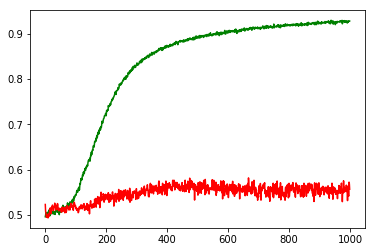

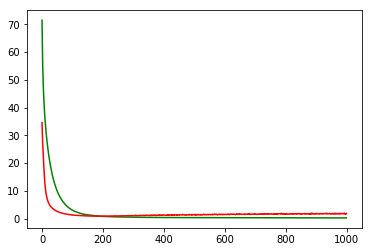

working on d,u and l,le 0.5 64 0.01 1e-05


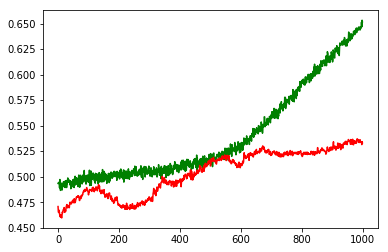

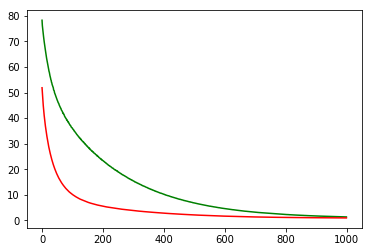

working on d,u and l,le 0.5 64 0.05 0.001


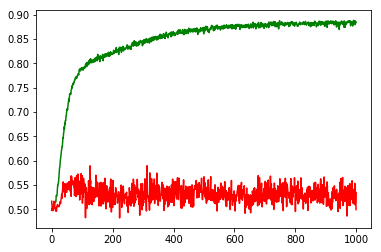

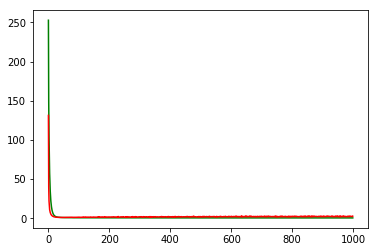

working on d,u and l,le 0.5 64 0.05 0.0001


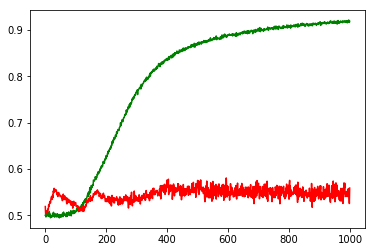

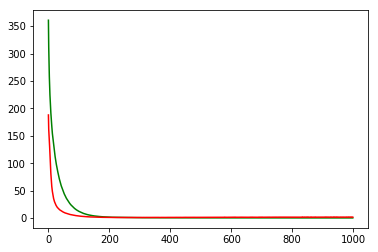

working on d,u and l,le 0.5 64 0.05 1e-05


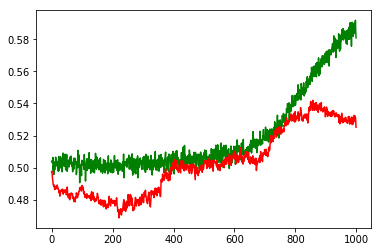

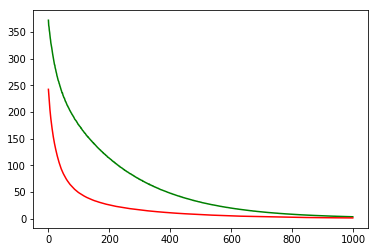

working on d,u and l,le 0.5 128 0.01 0.001


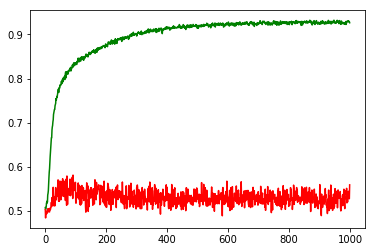

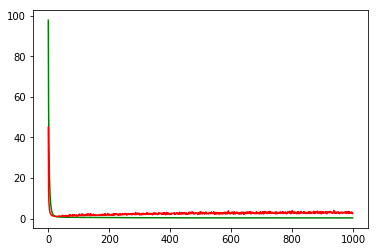

working on d,u and l,le 0.5 128 0.01 0.0001


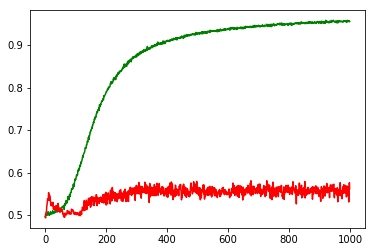

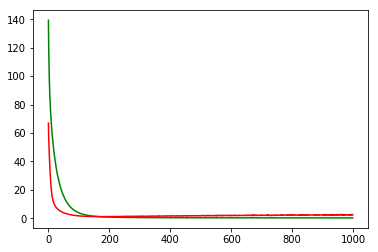

working on d,u and l,le 0.5 128 0.01 1e-05


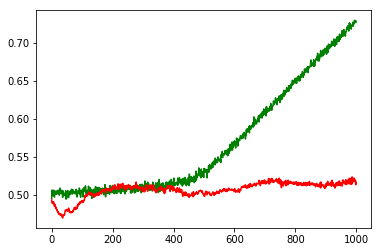

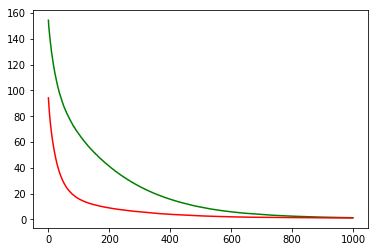

working on d,u and l,le 0.5 128 0.05 0.001


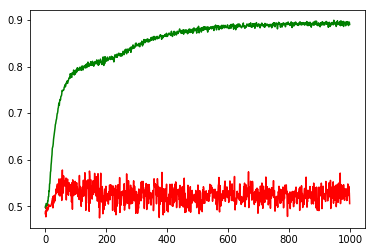

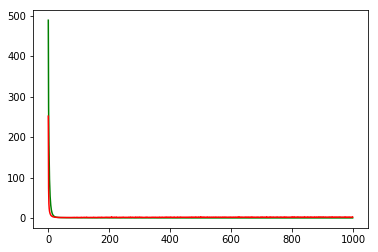

working on d,u and l,le 0.5 128 0.05 0.0001


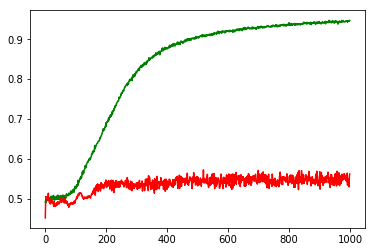

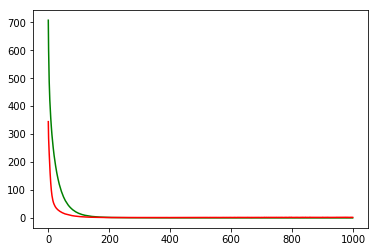

working on d,u and l,le 0.5 128 0.05 1e-05


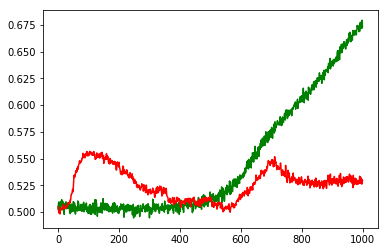

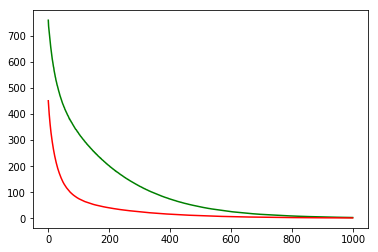

working on d,u and l,le 0.5 256 0.01 0.001


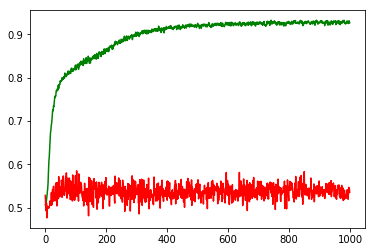

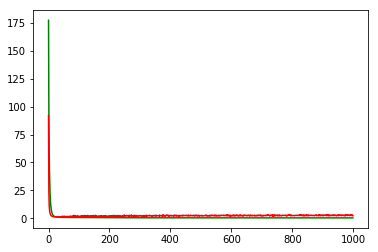

working on d,u and l,le 0.5 256 0.01 0.0001


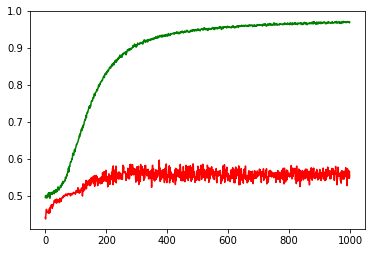

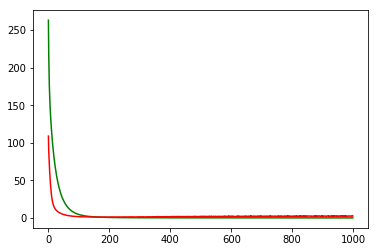

working on d,u and l,le 0.5 256 0.01 1e-05


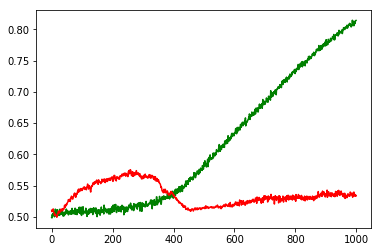

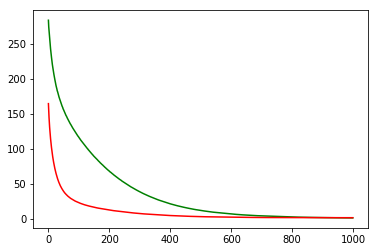

working on d,u and l,le 0.5 256 0.05 0.001


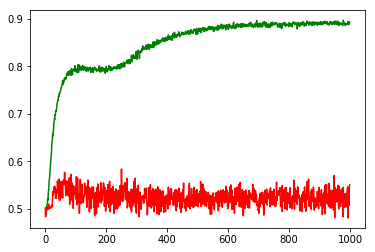

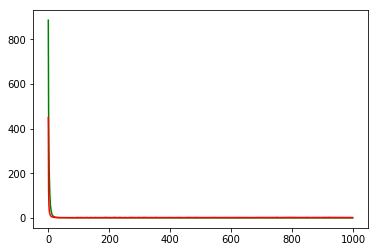

working on d,u and l,le 0.5 256 0.05 0.0001


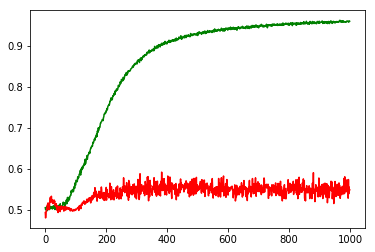

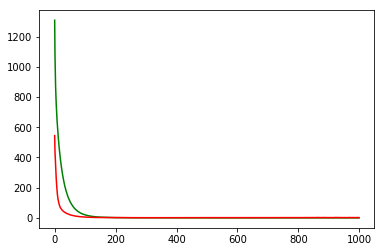

working on d,u and l,le 0.5 256 0.05 1e-05


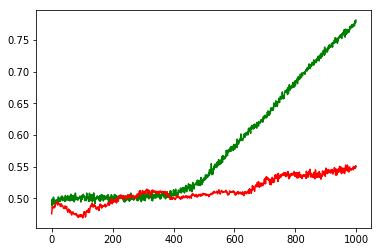

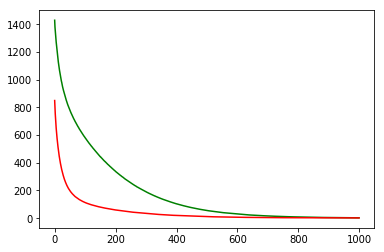

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.0001
Chart for BEST MODEL FOR: MSFT


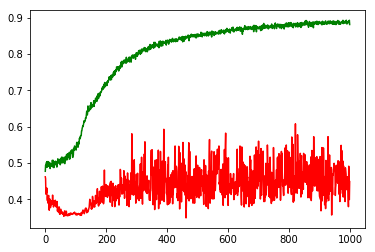

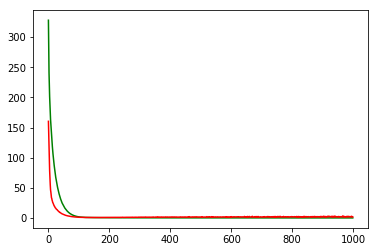

F1,score 0.4015369836695485
G-score: 0.4572349960828871
Accuracy 0.4486725675321258
Window: 140
[[298 121]
 [502 209]]
Vol pos 1.2678315515186542
Vol neg 1.8251747301478312
Real Percentage of gain: -3.8208532483625968
Percentage of gain: -0.4374276639487975
Total gain: -494.2932602621412
000000000000000000000000000000000000000000000000
Percentile:  0
[[224  68]
 [163  89]]
544/544 [==============================] - 0s 23us/step
[1.5411634273169672, 0.5753676470588235]
Percentile:  1
[[ 50  24]
 [171  68]]
313/313 [==============================] - 0s 28us/step
[1.6378045539124706, 0.3769968049213909]
Percentile:  2
[[ 17   6]
 [115  25]]
163/163 [==============================] - 0s 46us/step
[2.2481305701600993, 0.25766871165644173]
Percentile:  3
[[ 6 14]
 [42 19]]
81/81 [==============================] - 0s 42us/step
[4.5690526432461205, 0.30864197530864196]
Percentile:  4
[[ 1  9]
 [11  7]]
28/28 [==============================] - 0s 28us/step
[4.279821872711182, 0.2857142984867096

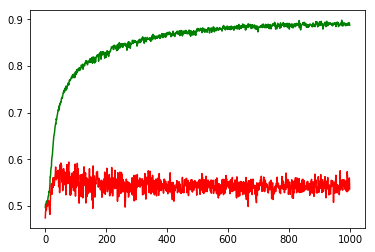

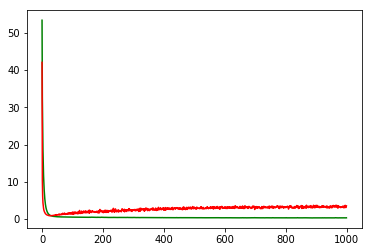

working on d,u and l,le 0.5 64 0.01 0.0001


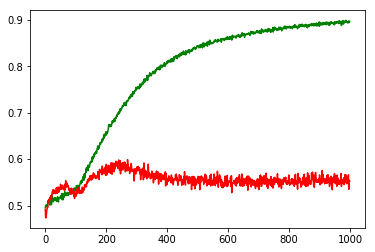

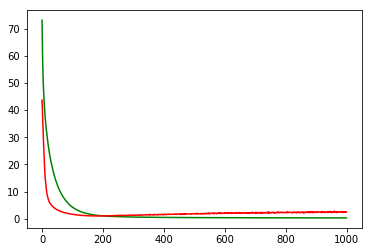

working on d,u and l,le 0.5 64 0.01 1e-05


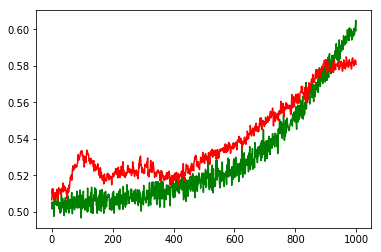

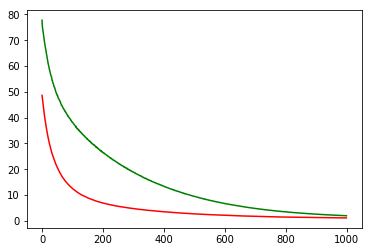

working on d,u and l,le 0.5 64 0.05 0.001


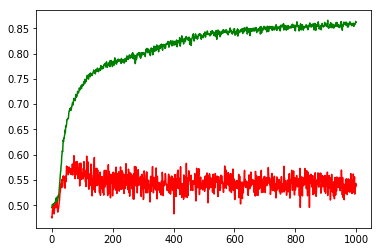

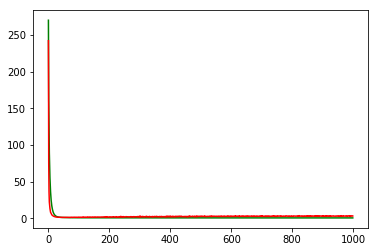

working on d,u and l,le 0.5 64 0.05 0.0001


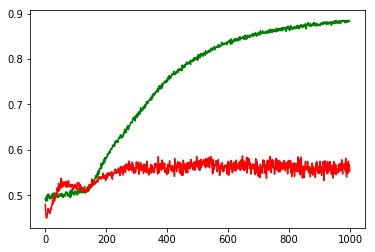

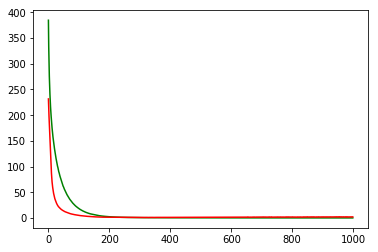

working on d,u and l,le 0.5 64 0.05 1e-05


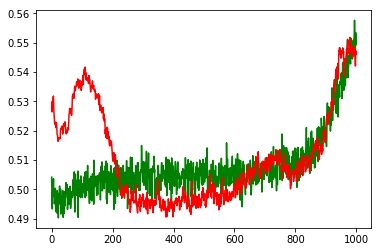

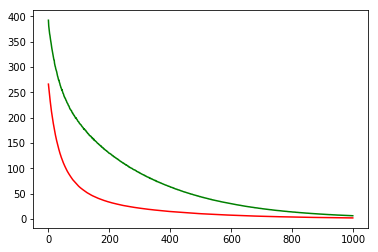

working on d,u and l,le 0.5 128 0.01 0.001


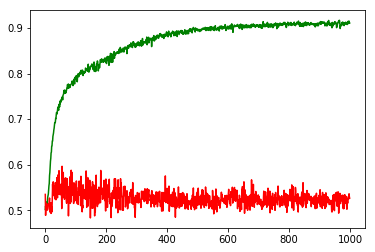

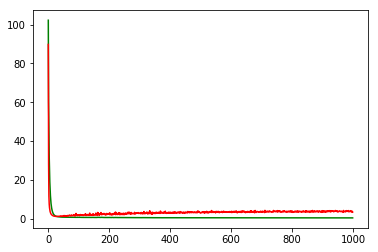

working on d,u and l,le 0.5 128 0.01 0.0001


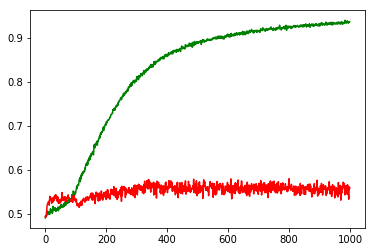

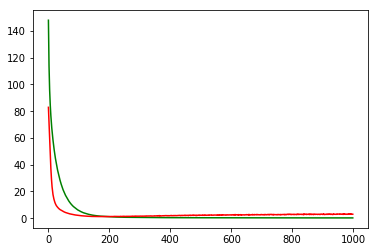

working on d,u and l,le 0.5 128 0.01 1e-05


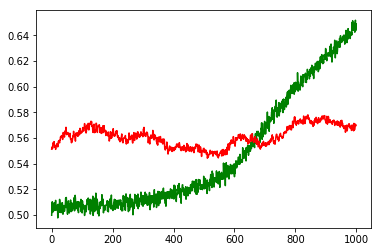

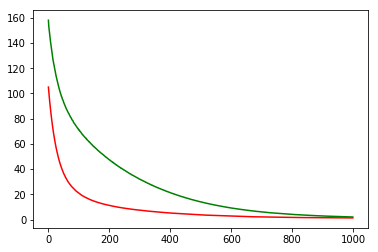

working on d,u and l,le 0.5 128 0.05 0.001


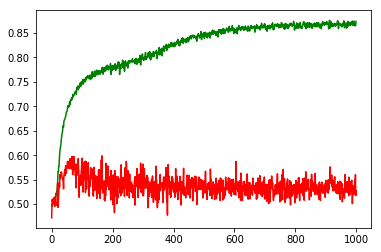

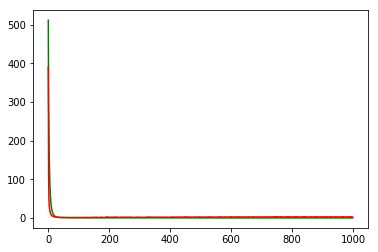

working on d,u and l,le 0.5 128 0.05 0.0001


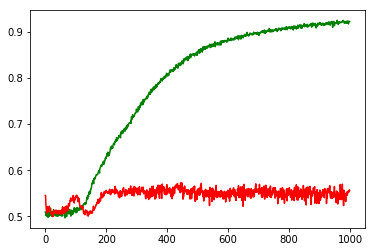

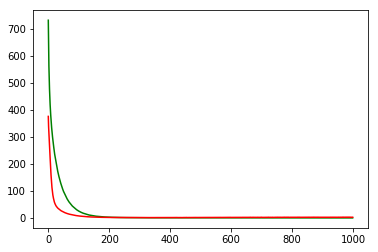

working on d,u and l,le 0.5 128 0.05 1e-05


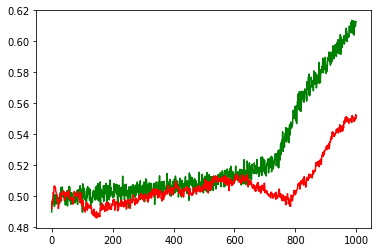

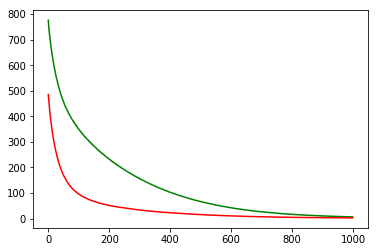

working on d,u and l,le 0.5 256 0.01 0.001


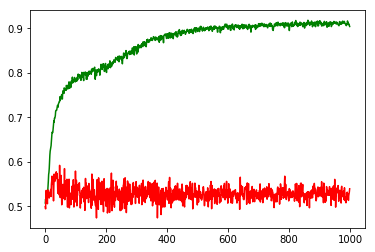

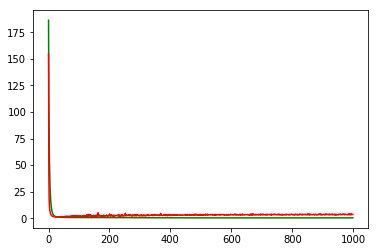

working on d,u and l,le 0.5 256 0.01 0.0001


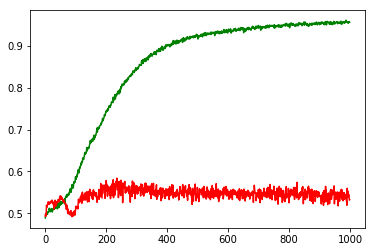

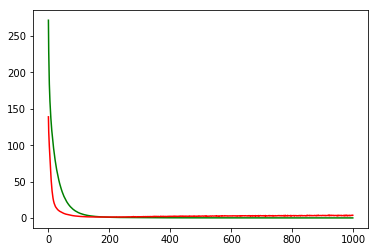

working on d,u and l,le 0.5 256 0.01 1e-05


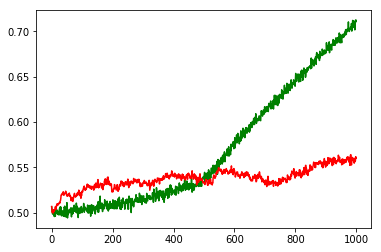

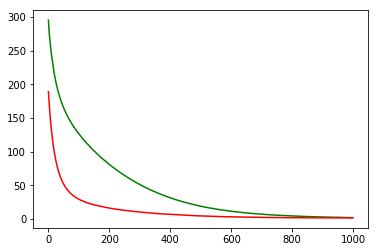

working on d,u and l,le 0.5 256 0.05 0.001


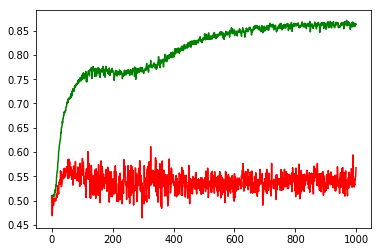

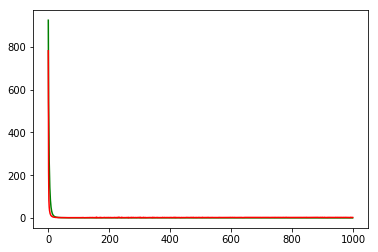

working on d,u and l,le 0.5 256 0.05 0.0001


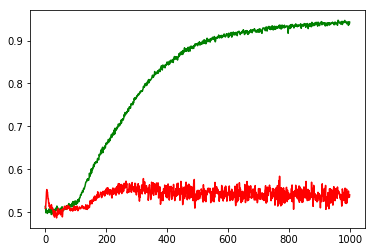

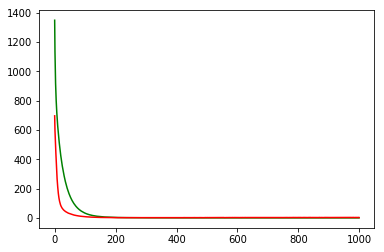

working on d,u and l,le 0.5 256 0.05 1e-05


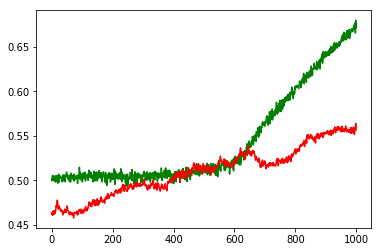

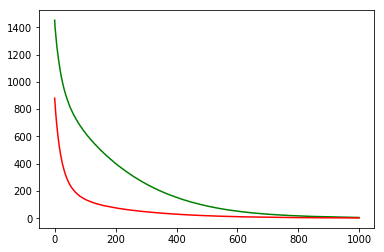

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.0001
Chart for BEST MODEL FOR: FB


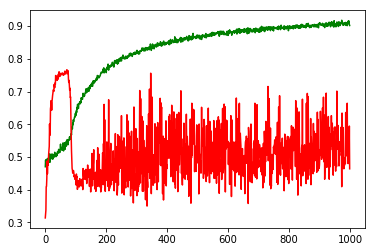

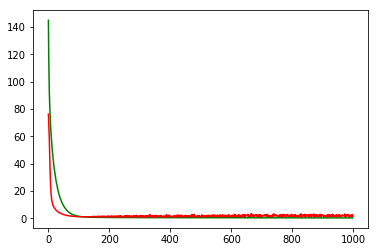

F1,score 0.4928989139515455
G-score: 0.5448628071053959
Accuracy 0.46378091874766053
Window: 140
[[230  33]
 [574 295]]
Vol pos 3.227719077259882
Vol neg 2.9478907479695007
Real Percentage of gain: -65.29053159069761
Percentage of gain: -0.0837607495194778
Total gain: -94.81716845604888
000000000000000000000000000000000000000000000000
Percentile:  0
[[197  15]
 [251  59]]
522/522 [==============================] - 0s 28us/step
[2.0578836947108594, 0.4904214559386973]
Percentile:  1
[[ 21  16]
 [273 158]]
468/468 [==============================] - 0s 27us/step
[2.608313670525184, 0.38247863247863245]
Percentile:  2
[[11  2]
 [50 42]]
105/105 [==============================] - 0s 38us/step
[1.4178511664980933, 0.5047619048328627]
Percentile:  3
[[14]]
14/14 [==============================] - 0s 60us/step
[0.07896117120981216, 1.0]
Percentile:  4
[[21]]
21/21 [==============================] - 0s 32us/step
[0.06727217882871628, 1.0]
000000000000000000000000000000000000000000000000
Working

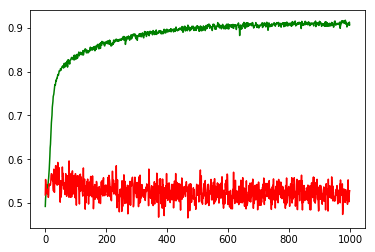

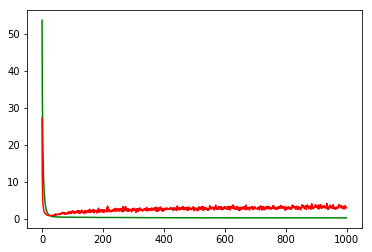

working on d,u and l,le 0.5 64 0.01 0.0001


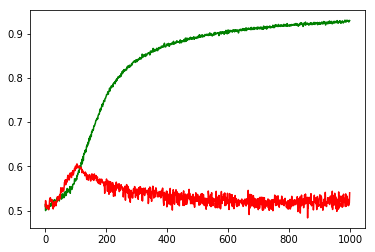

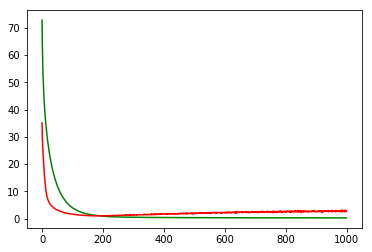

working on d,u and l,le 0.5 64 0.01 1e-05


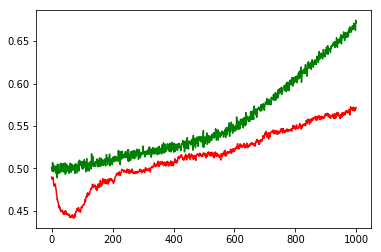

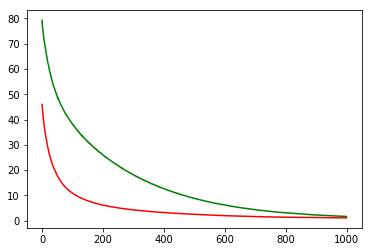

working on d,u and l,le 0.5 64 0.05 0.001


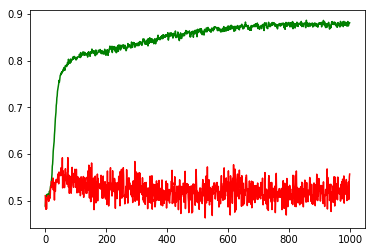

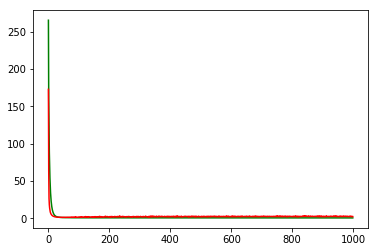

working on d,u and l,le 0.5 64 0.05 0.0001


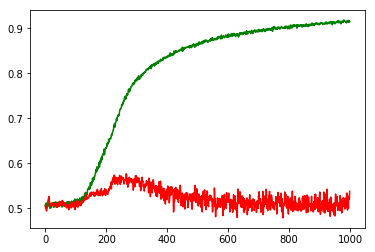

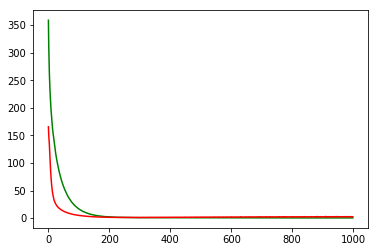

working on d,u and l,le 0.5 64 0.05 1e-05


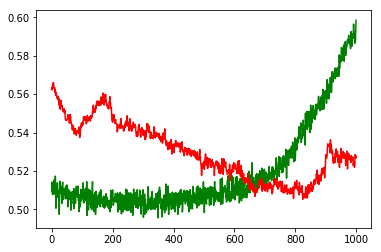

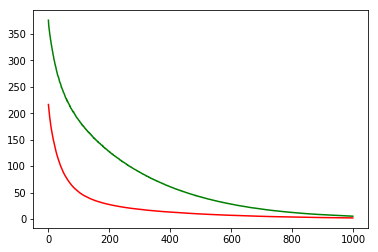

working on d,u and l,le 0.5 128 0.01 0.001


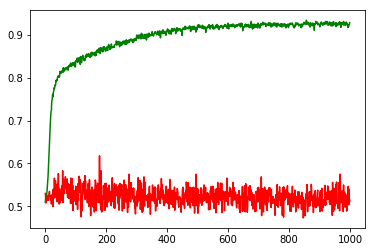

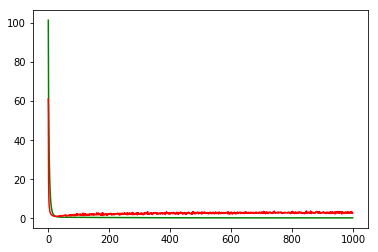

working on d,u and l,le 0.5 128 0.01 0.0001


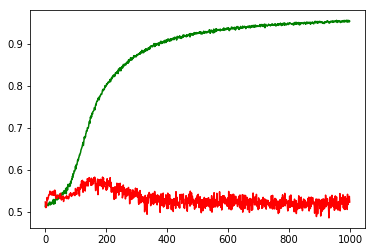

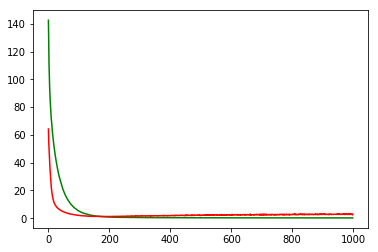

working on d,u and l,le 0.5 128 0.01 1e-05


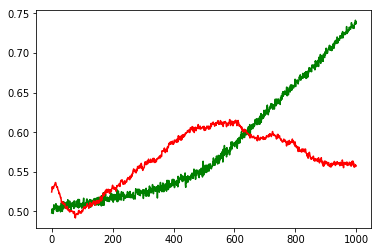

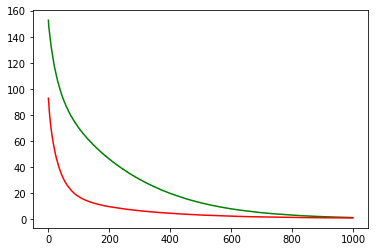

working on d,u and l,le 0.5 128 0.05 0.001


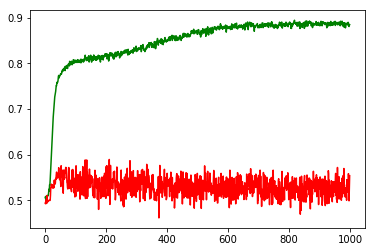

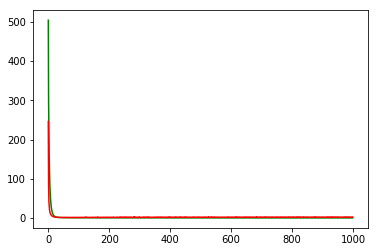

working on d,u and l,le 0.5 128 0.05 0.0001


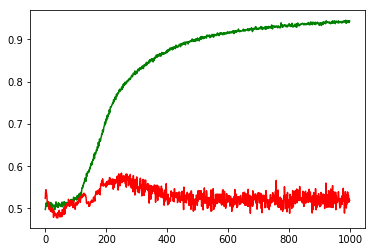

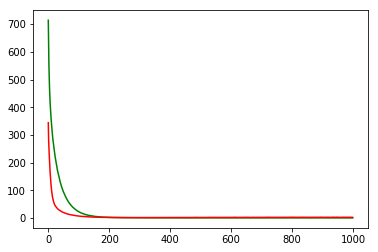

working on d,u and l,le 0.5 128 0.05 1e-05


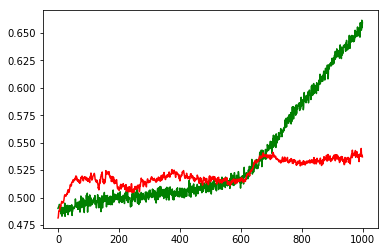

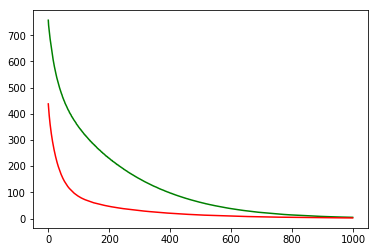

working on d,u and l,le 0.5 256 0.01 0.001


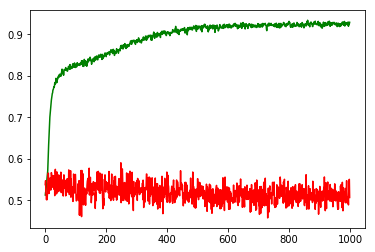

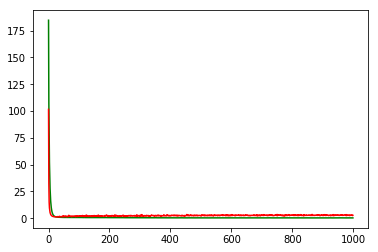

working on d,u and l,le 0.5 256 0.01 0.0001


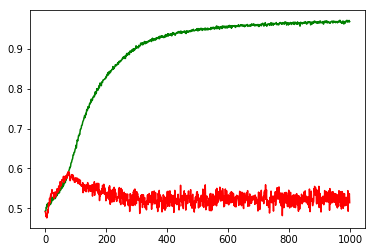

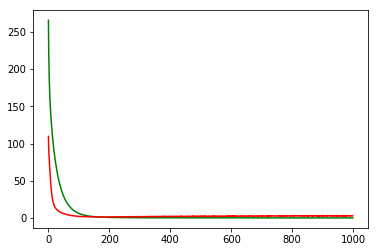

working on d,u and l,le 0.5 256 0.01 1e-05


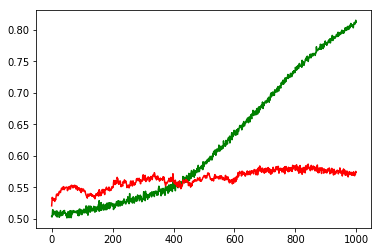

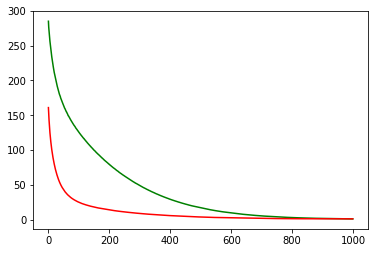

working on d,u and l,le 0.5 256 0.05 0.001


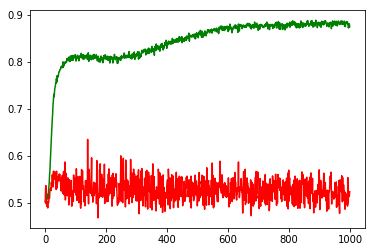

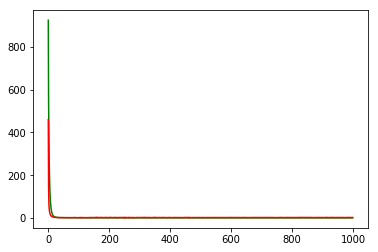

working on d,u and l,le 0.5 256 0.05 0.0001


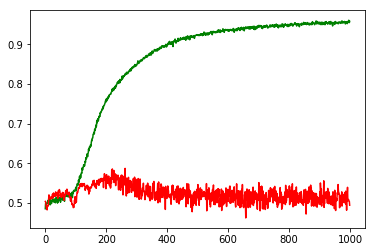

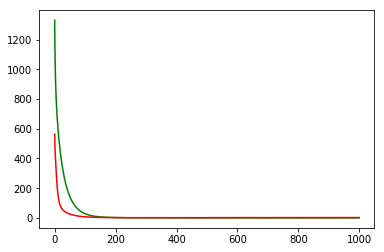

working on d,u and l,le 0.5 256 0.05 1e-05


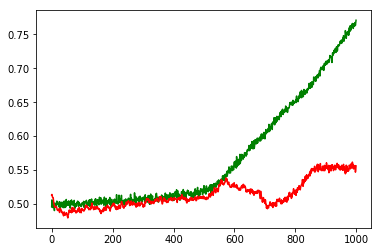

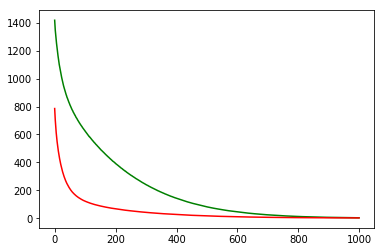

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.001
Chart for BEST MODEL FOR: INTC


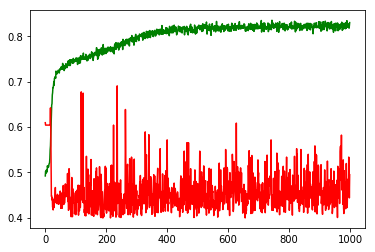

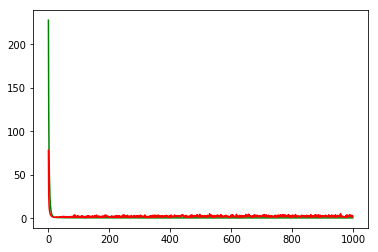

F1,score 0.3348837209302326
G-score: 0.44214106550343324
Accuracy 0.49469964432632124
Window: 140
[[416  32]
 [540 144]]
Vol pos 2.6726513273180146
Vol neg 1.9952839302017455
Real Percentage of gain: -29.669571185729115
Percentage of gain: 0.3139419922461924
Total gain: 355.3823352226898
000000000000000000000000000000000000000000000000
Percentile:  0
[[101  15]
 [209  29]]
354/354 [==============================] - 0s 29us/step
[2.8103968487621027, 0.3672316384180791]
Percentile:  1
[[106   8]
 [176  52]]
342/342 [==============================] - 0s 27us/step
[1.7756652471266294, 0.4619883040935672]
Percentile:  2
[[119   8]
 [106  45]]
278/278 [==============================] - 0s 31us/step
[1.2914356201243915, 0.5899280575539568]
Percentile:  3
[[63  0]
 [38 13]]
114/114 [==============================] - 0s 40us/step
[0.983620938305792, 0.6666666666666666]
Percentile:  4
[[27  1]
 [ 9  5]]
42/42 [==============================] - 0s 53us/step
[0.5238360804283902, 0.7619047619047619

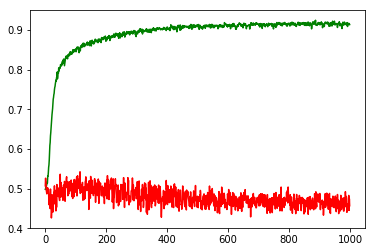

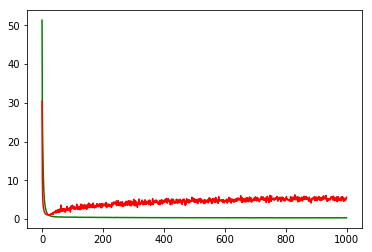

working on d,u and l,le 0.5 64 0.01 0.0001


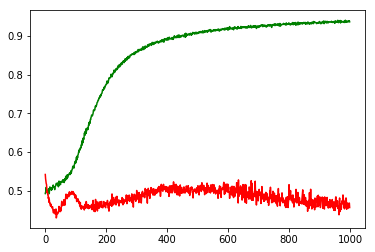

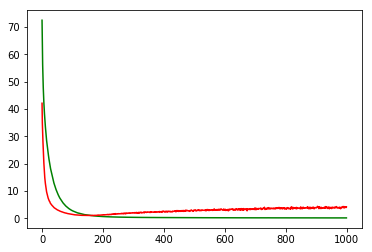

working on d,u and l,le 0.5 64 0.01 1e-05


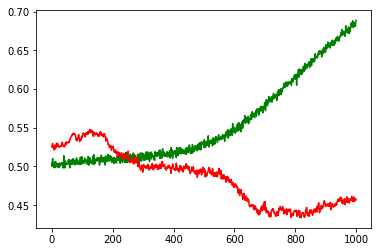

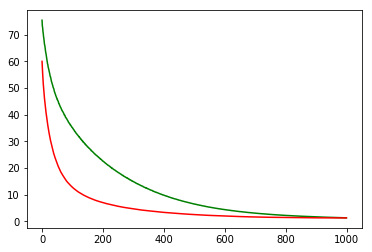

working on d,u and l,le 0.5 64 0.05 0.001


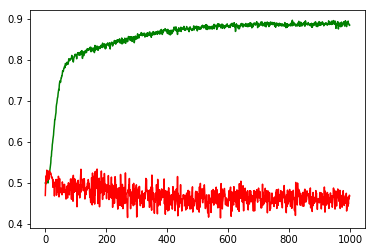

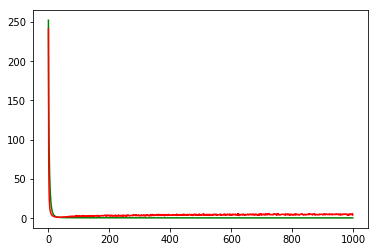

working on d,u and l,le 0.5 64 0.05 0.0001


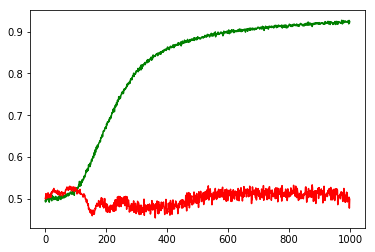

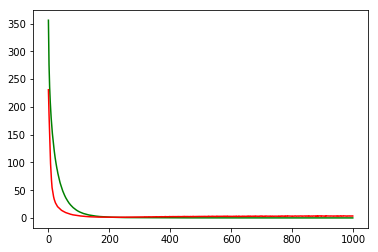

working on d,u and l,le 0.5 64 0.05 1e-05


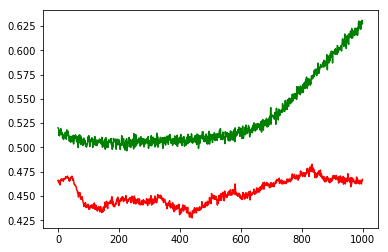

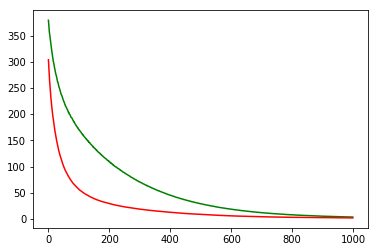

working on d,u and l,le 0.5 128 0.01 0.001


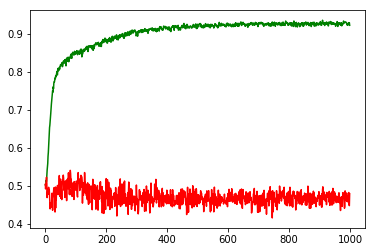

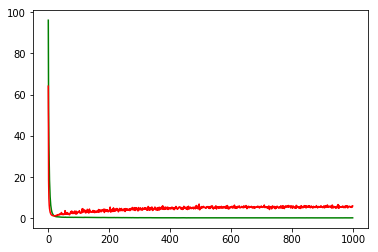

working on d,u and l,le 0.5 128 0.01 0.0001


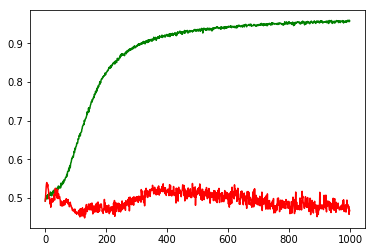

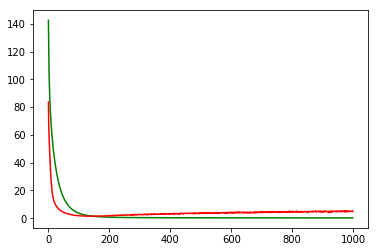

working on d,u and l,le 0.5 128 0.01 1e-05


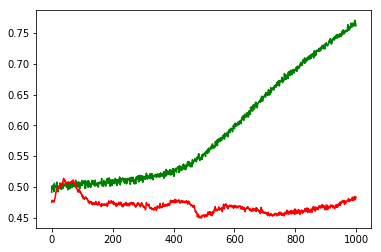

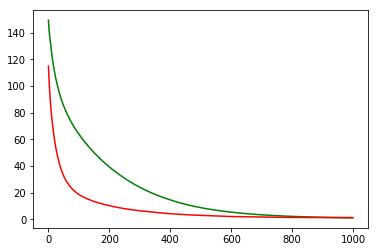

working on d,u and l,le 0.5 128 0.05 0.001


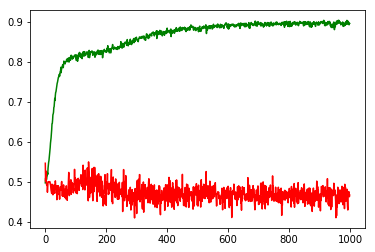

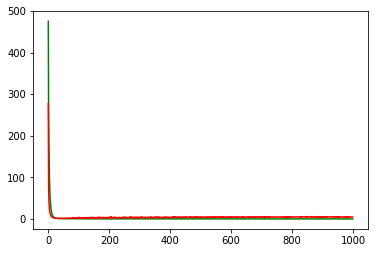

working on d,u and l,le 0.5 128 0.05 0.0001


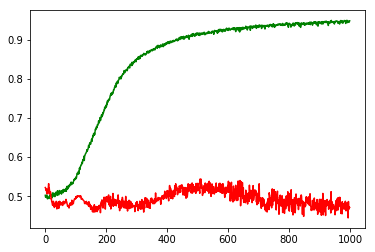

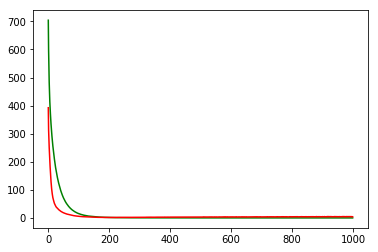

working on d,u and l,le 0.5 128 0.05 1e-05


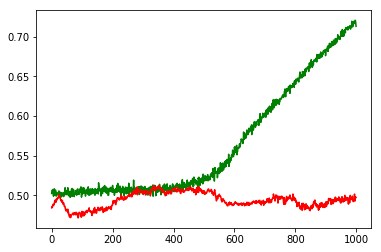

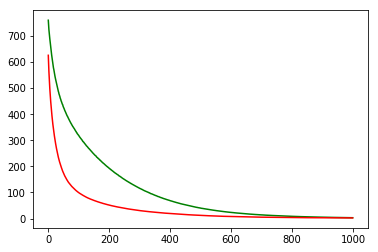

working on d,u and l,le 0.5 256 0.01 0.001


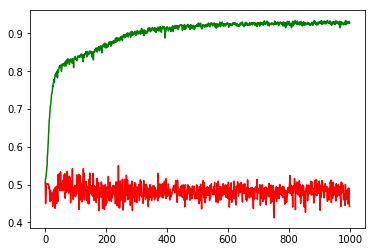

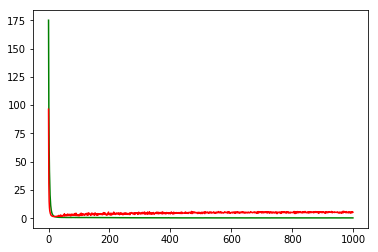

working on d,u and l,le 0.5 256 0.01 0.0001


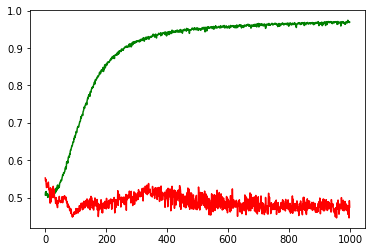

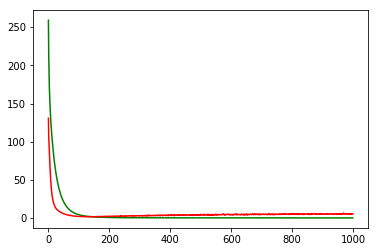

working on d,u and l,le 0.5 256 0.01 1e-05


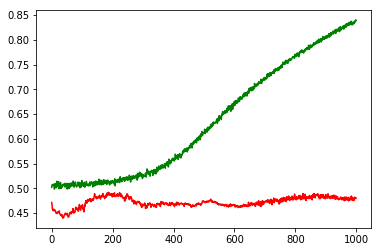

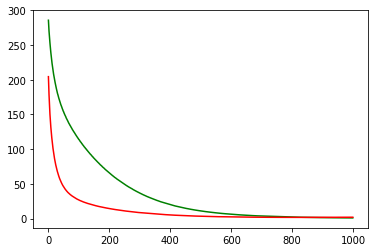

working on d,u and l,le 0.5 256 0.05 0.001


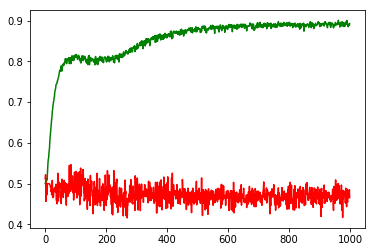

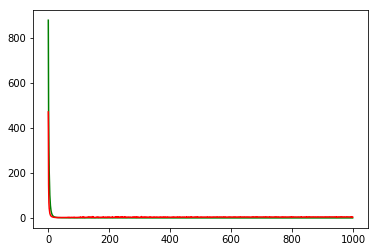

working on d,u and l,le 0.5 256 0.05 0.0001


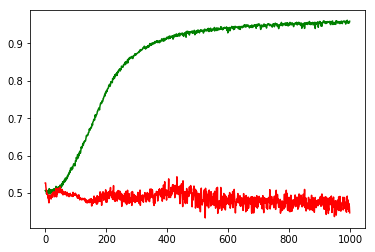

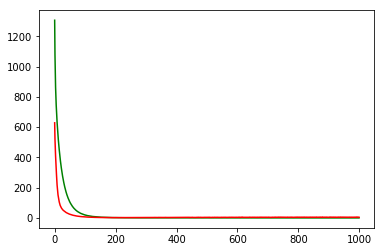

working on d,u and l,le 0.5 256 0.05 1e-05


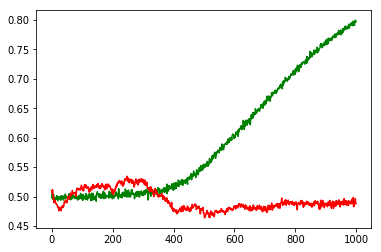

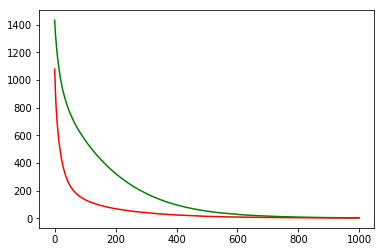

maxd,maxu,maxl,maxle: 0.5 64 0.01 1e-05
Chart for BEST MODEL FOR: CSCO


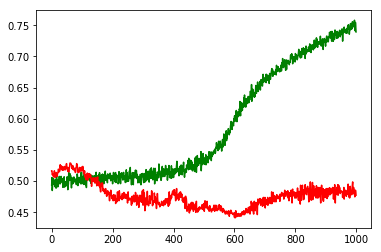

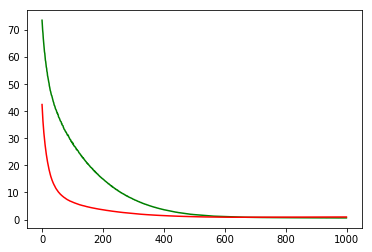

F1,score 0.29156626506024097
G-score: 0.4035456386651951
Accuracy 0.4773333331743876
Window: 140
[[416  61]
 [527 121]]
Vol pos 2.2216723350523293
Vol neg 1.4945203609655495
Real Percentage of gain: 28.692254495158938
Percentage of gain: 0.2793422859336512
Total gain: 314.2600716753576
000000000000000000000000000000000000000000000000
Percentile:  0
[[173  47]
 [258  38]]
516/516 [==============================] - 0s 28us/step
[0.9528431060702302, 0.40891472868217055]
Percentile:  1
[[ 89   7]
 [174  53]]
323/323 [==============================] - 0s 30us/step
[0.9631661215433764, 0.43962848297213625]
Percentile:  2
[[50  0]
 [64 24]]
138/138 [==============================] - 0s 40us/step
[0.7795154996540236, 0.5362318840579711]
Percentile:  3
[[54  4]
 [22  6]]
86/86 [==============================] - 0s 34us/step
[0.5601114291091298, 0.6976744186046512]
Percentile:  4
[[49  3]
 [ 6  0]]
58/58 [==============================] - 0s 41us/step
[0.2957449442353742, 0.8448275759302336]
000

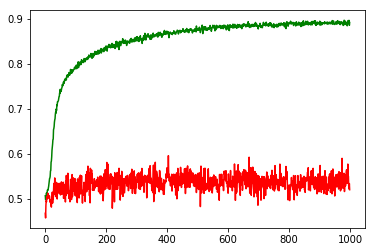

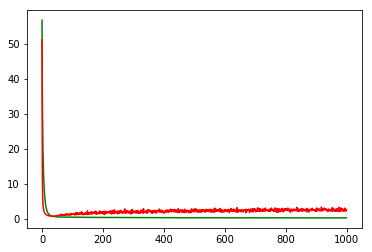

working on d,u and l,le 0.5 64 0.01 0.0001


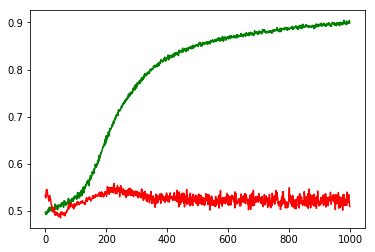

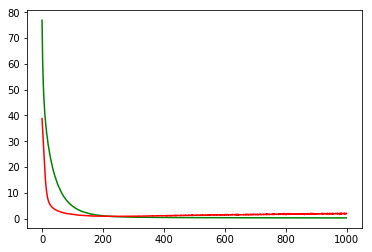

working on d,u and l,le 0.5 64 0.01 1e-05


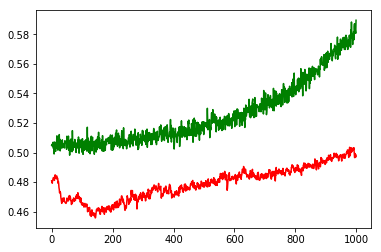

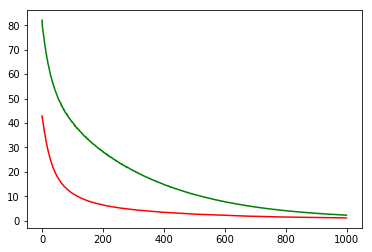

working on d,u and l,le 0.5 64 0.05 0.001


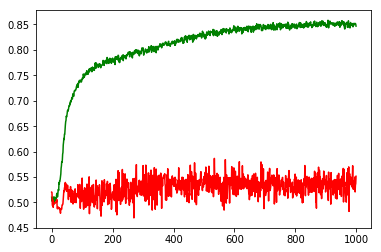

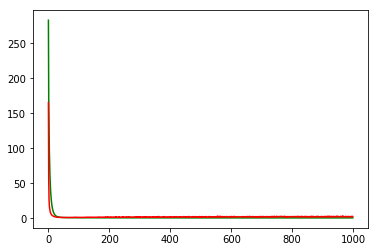

working on d,u and l,le 0.5 64 0.05 0.0001


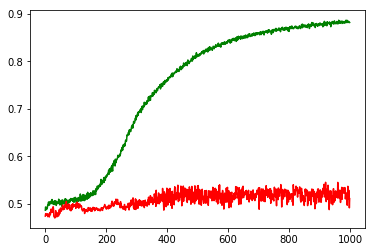

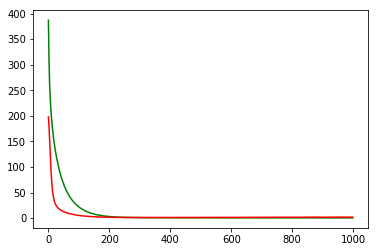

working on d,u and l,le 0.5 64 0.05 1e-05


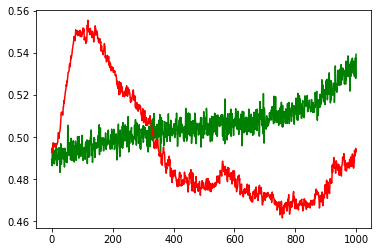

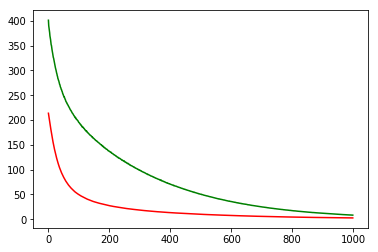

working on d,u and l,le 0.5 128 0.01 0.001


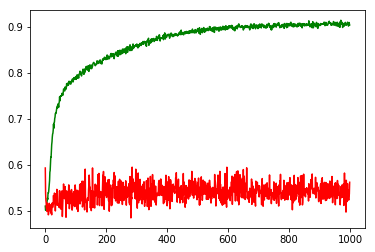

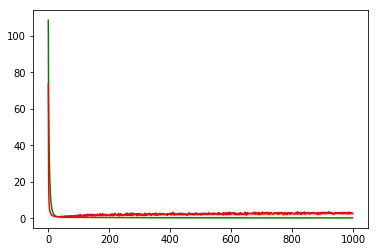

working on d,u and l,le 0.5 128 0.01 0.0001


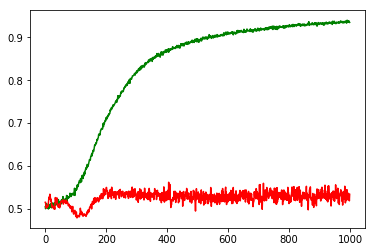

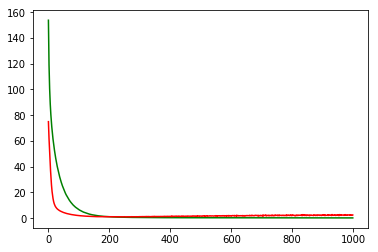

working on d,u and l,le 0.5 128 0.01 1e-05


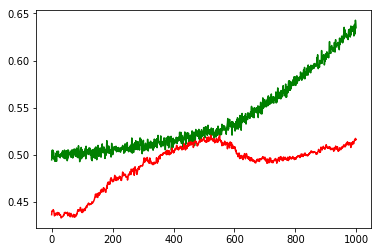

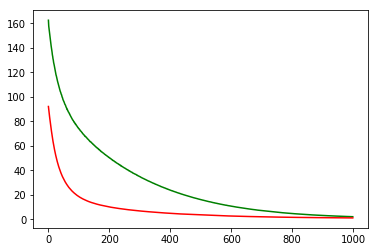

working on d,u and l,le 0.5 128 0.05 0.001


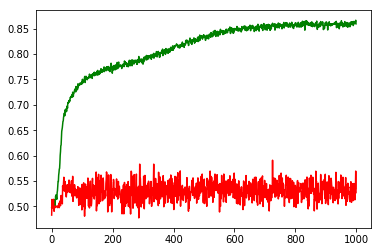

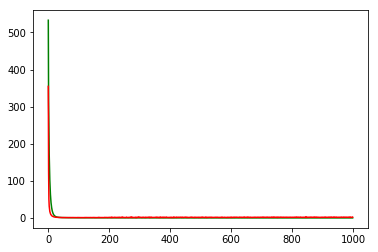

working on d,u and l,le 0.5 128 0.05 0.0001


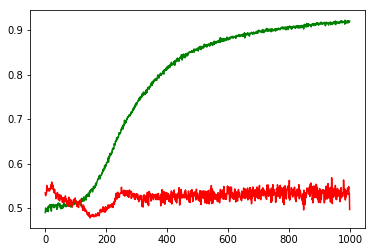

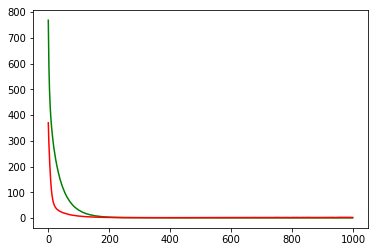

working on d,u and l,le 0.5 128 0.05 1e-05


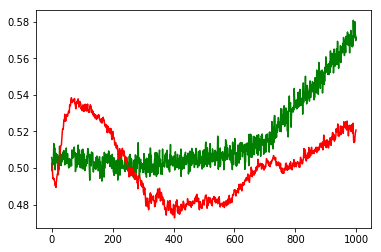

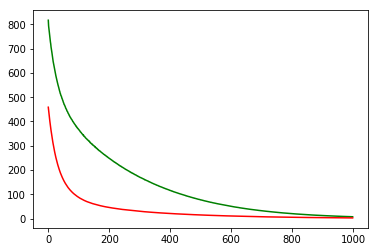

working on d,u and l,le 0.5 256 0.01 0.001


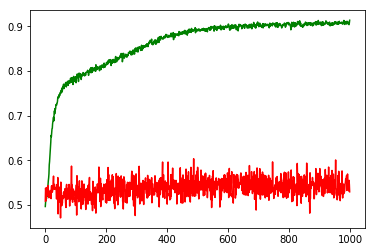

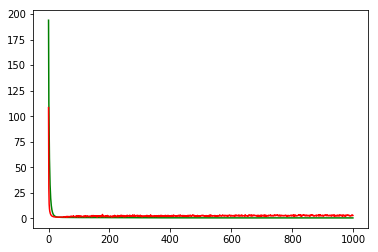

working on d,u and l,le 0.5 256 0.01 0.0001


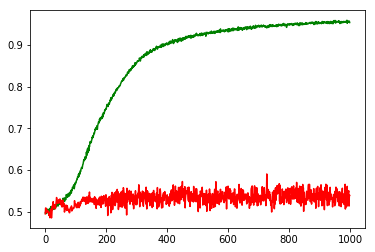

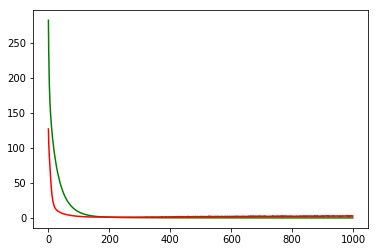

working on d,u and l,le 0.5 256 0.01 1e-05


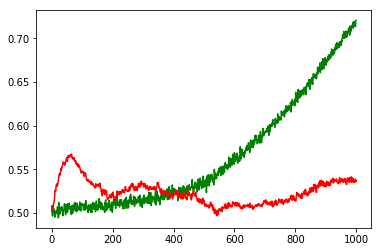

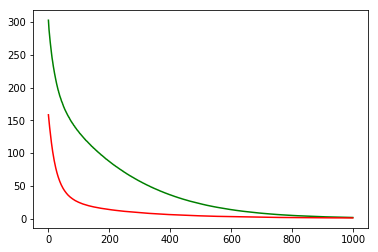

working on d,u and l,le 0.5 256 0.05 0.001


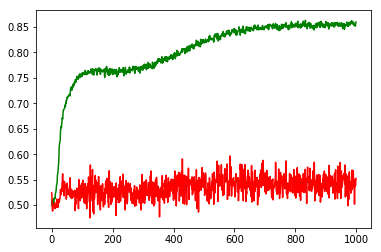

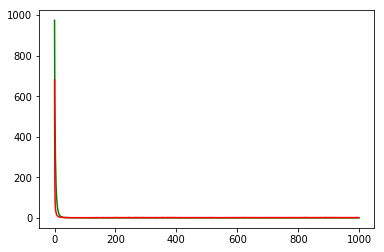

working on d,u and l,le 0.5 256 0.05 0.0001


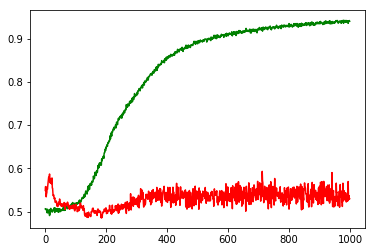

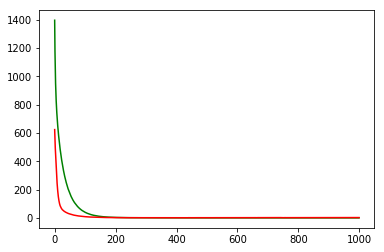

working on d,u and l,le 0.5 256 0.05 1e-05


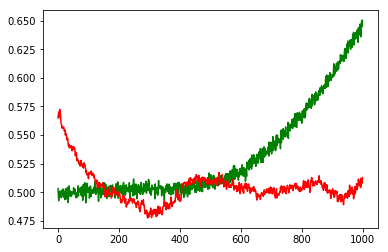

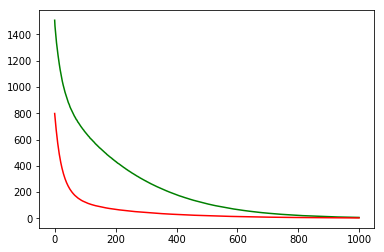

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: CMCSA


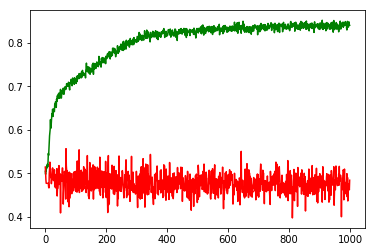

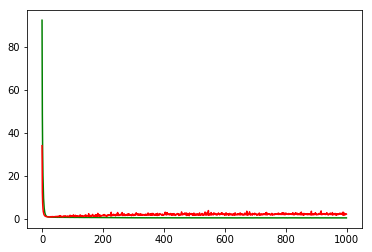

F1,score 0.37606837606837606
G-score: 0.45255364853772284
Accuracy 0.4840989410877228
Window: 140
[[372 168]
 [416 176]]
Vol pos 2.9362307415272673
Vol neg 2.7825474072944196
Real Percentage of gain: -100.99693178004689
Percentage of gain: -0.014092967758832784
Total gain: -15.953239502998715
000000000000000000000000000000000000000000000000
Percentile:  0
[[161  66]
 [154  47]]
428/428 [==============================] - 0s 28us/step
[1.9237922920244876, 0.48598130841121495]
Percentile:  1
[[128  69]
 [195 109]]
501/501 [==============================] - 0s 28us/step
[2.3906180130507417, 0.473053892364283]
Percentile:  2
[[25 17]
 [57 17]]
116/116 [==============================] - 0s 42us/step
[2.1951261059991243, 0.3620689655172414]
Percentile:  3
[[46 14]
 [ 9  3]]
72/72 [==============================] - 0s 127us/step
[0.9735966920852661, 0.6805555555555556]
Percentile:  4
[[11  2]
 [ 0  0]]
13/13 [==============================] - 0s 100us/step
[0.2740614116191864, 0.84615385532379

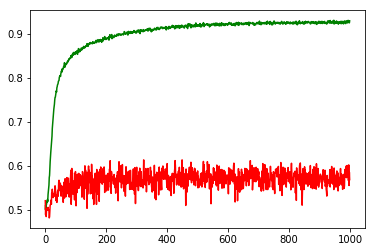

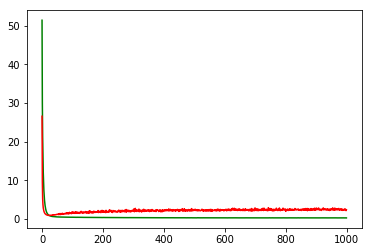

working on d,u and l,le 0.5 64 0.01 0.0001


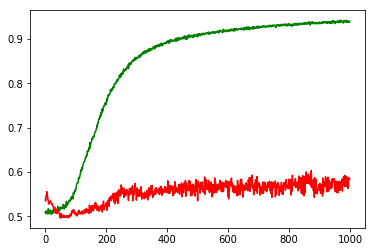

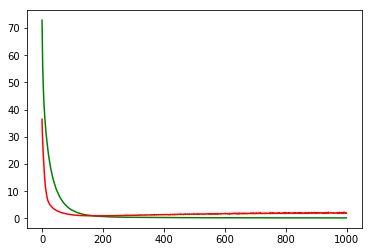

working on d,u and l,le 0.5 64 0.01 1e-05


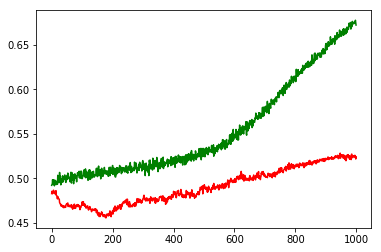

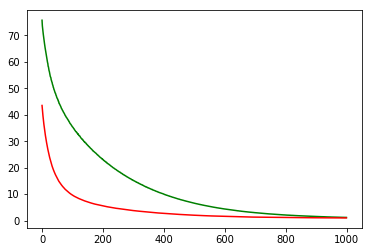

working on d,u and l,le 0.5 64 0.05 0.001


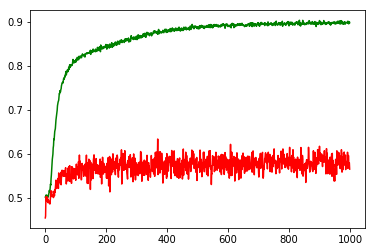

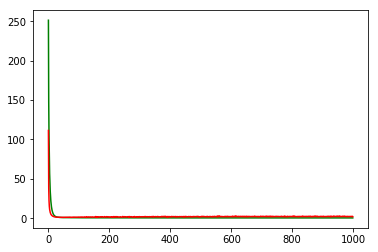

working on d,u and l,le 0.5 64 0.05 0.0001


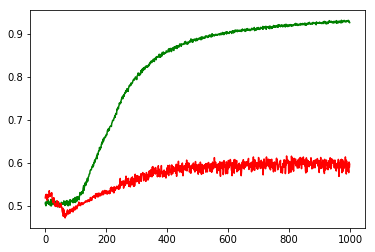

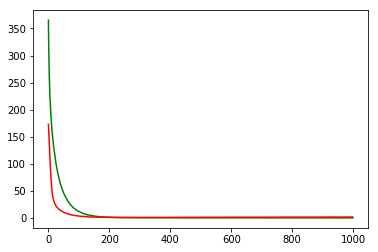

working on d,u and l,le 0.5 64 0.05 1e-05


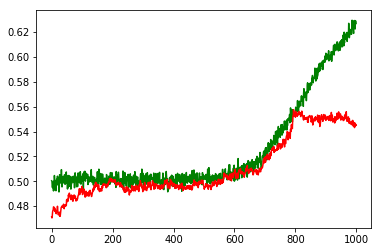

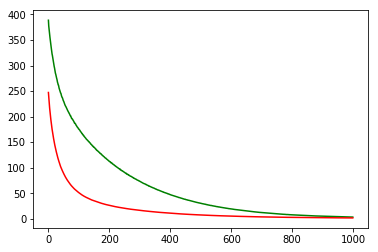

working on d,u and l,le 0.5 128 0.01 0.001


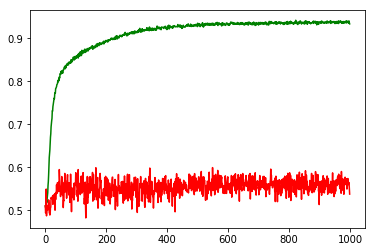

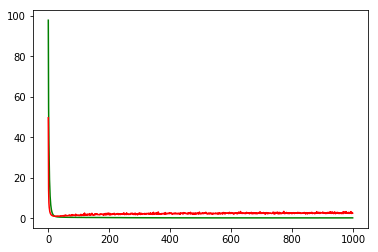

working on d,u and l,le 0.5 128 0.01 0.0001


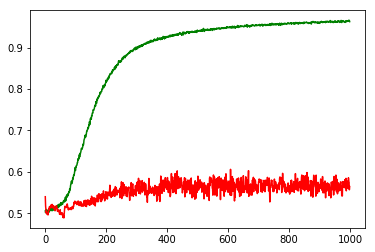

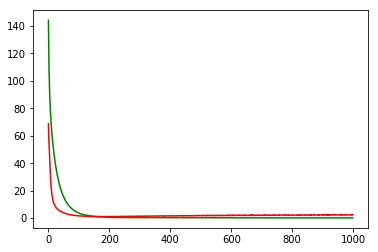

working on d,u and l,le 0.5 128 0.01 1e-05


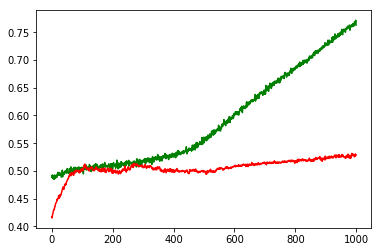

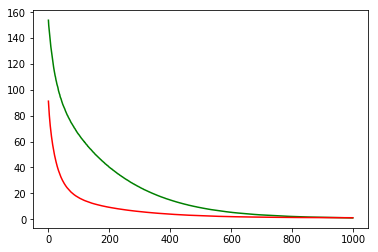

working on d,u and l,le 0.5 128 0.05 0.001


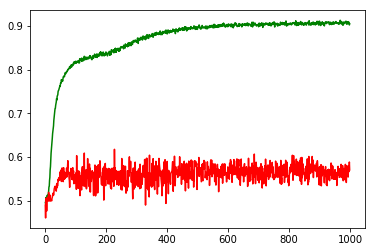

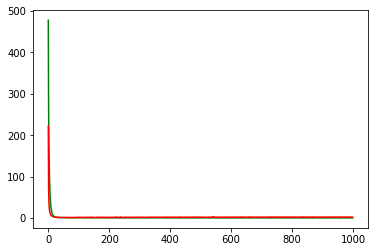

working on d,u and l,le 0.5 128 0.05 0.0001


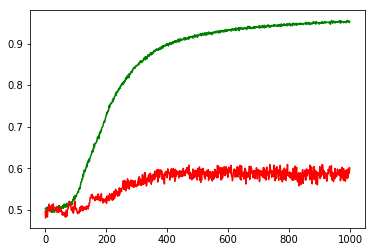

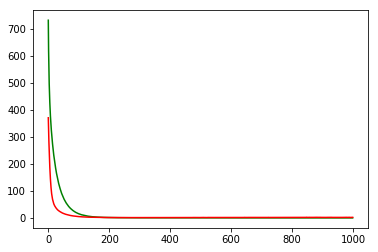

working on d,u and l,le 0.5 128 0.05 1e-05


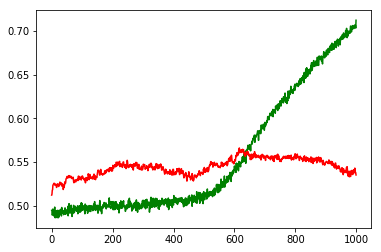

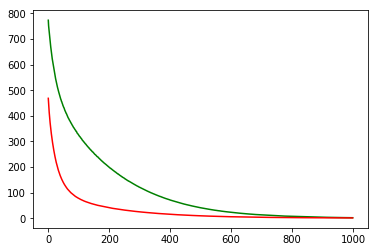

working on d,u and l,le 0.5 256 0.01 0.001


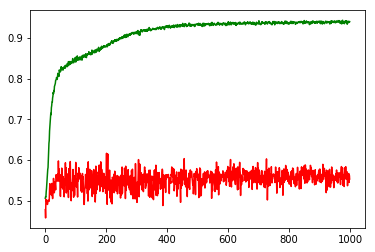

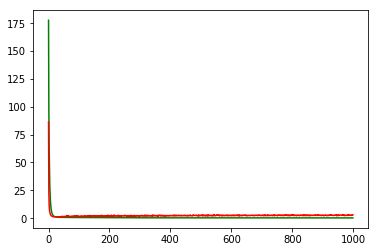

working on d,u and l,le 0.5 256 0.01 0.0001


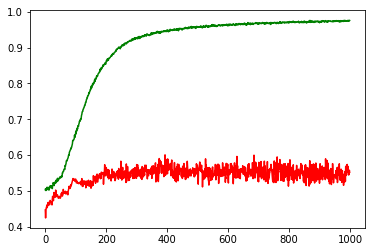

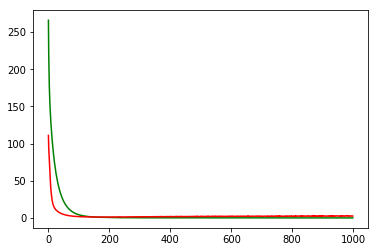

working on d,u and l,le 0.5 256 0.01 1e-05


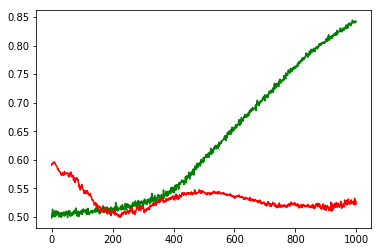

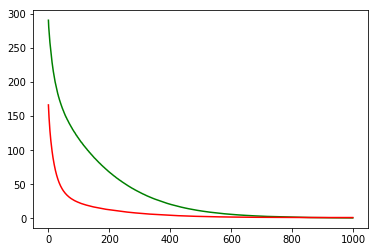

working on d,u and l,le 0.5 256 0.05 0.001


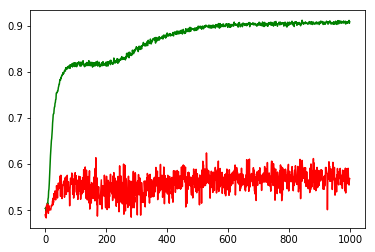

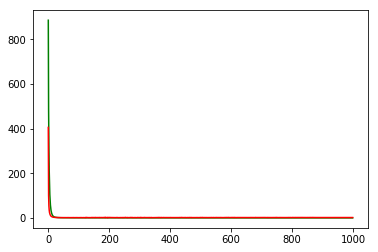

working on d,u and l,le 0.5 256 0.05 0.0001


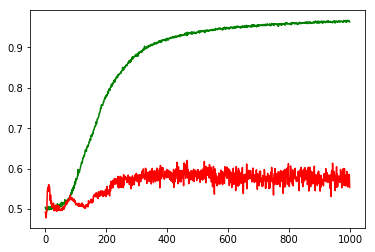

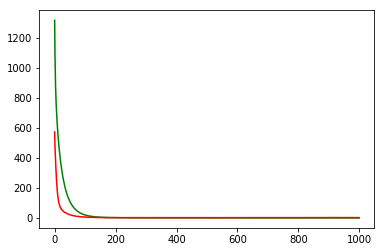

working on d,u and l,le 0.5 256 0.05 1e-05


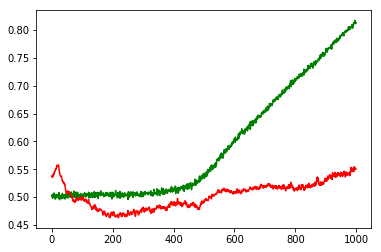

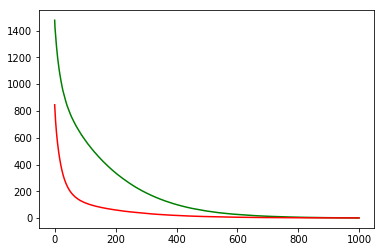

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.0001
Chart for BEST MODEL FOR: NVDA


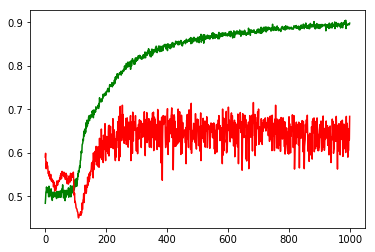

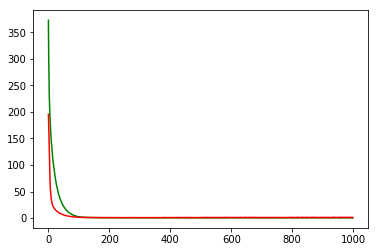

F1,score 0.6960950764006791
G-score: 0.6913328984437151
Accuracy 0.6837455838813378
Window: 140
[[364 112]
 [246 410]]
Vol pos 4.044178207844943
Vol neg 3.1764703269135133
Real Percentage of gain: 356.4405494029574
Percentage of gain: 1.760616215403664
Total gain: 1993.0175558369476
000000000000000000000000000000000000000000000000
Percentile:  0
[[235  78]
 [134 112]]
559/559 [==============================] - 0s 28us/step
[1.2564292457321249, 0.6207513420547697]
Percentile:  1
[[ 93  24]
 [ 64 156]]
337/337 [==============================] - 0s 24us/step
[0.7640392510579672, 0.7388724039145677]
Percentile:  2
[[24  7]
 [13 59]]
103/103 [==============================] - 0s 39us/step
[0.7444994671143663, 0.8058252427184466]
Percentile:  3
[[12  3]
 [24 41]]
80/80 [==============================] - 0s 35us/step
[0.7645222544670105, 0.6625]
Percentile:  4
[[ 0  0]
 [10 41]]
51/51 [==============================] - 0s 59us/step
[0.47236091840793104, 0.803921568627451]
00000000000000000000

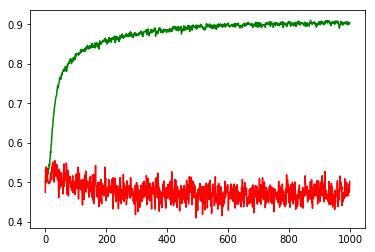

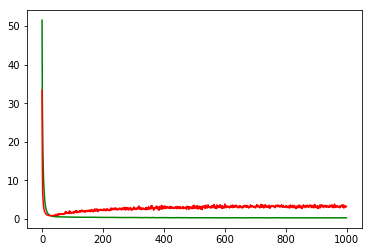

working on d,u and l,le 0.5 64 0.01 0.0001


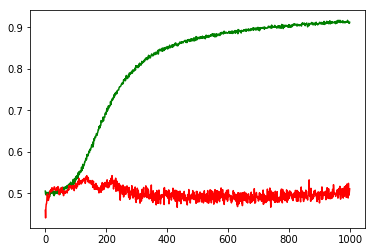

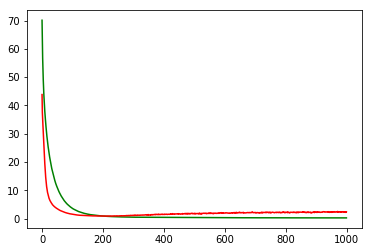

working on d,u and l,le 0.5 64 0.01 1e-05


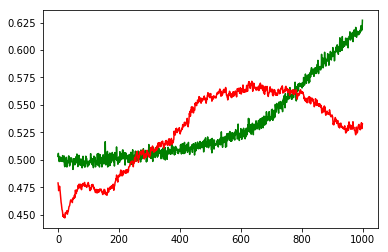

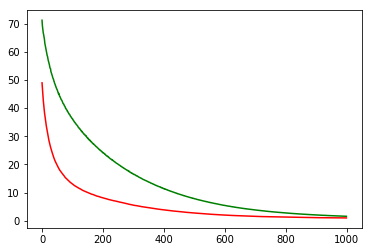

working on d,u and l,le 0.5 64 0.05 0.001


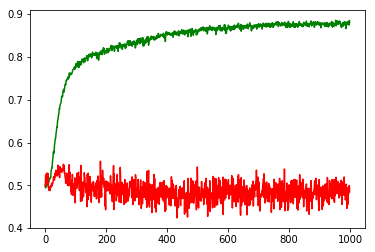

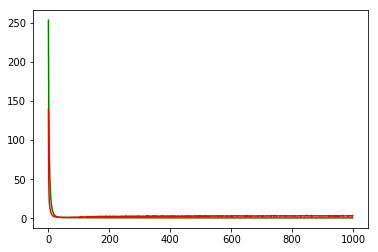

working on d,u and l,le 0.5 64 0.05 0.0001


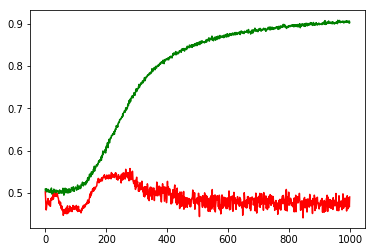

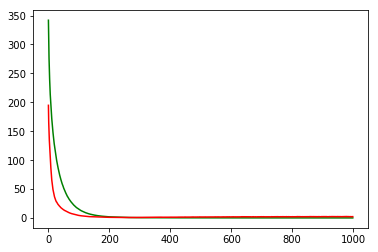

working on d,u and l,le 0.5 64 0.05 1e-05


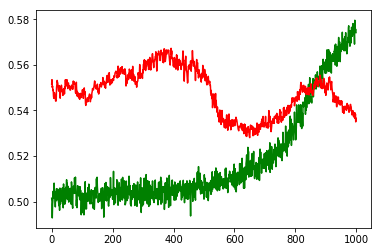

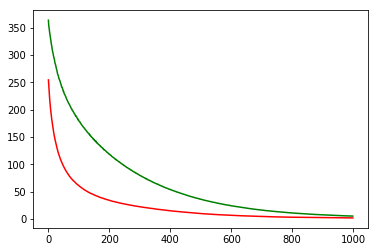

working on d,u and l,le 0.5 128 0.01 0.001


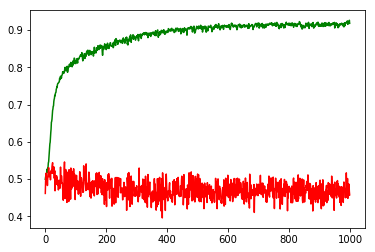

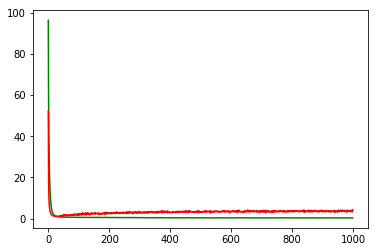

working on d,u and l,le 0.5 128 0.01 0.0001


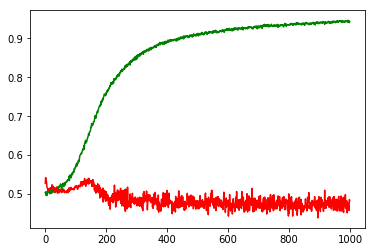

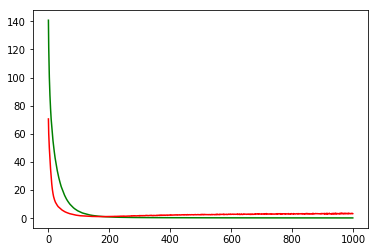

working on d,u and l,le 0.5 128 0.01 1e-05


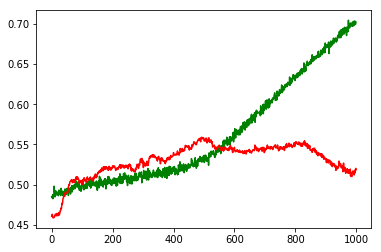

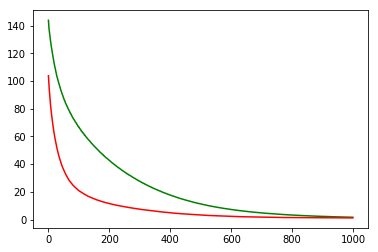

working on d,u and l,le 0.5 128 0.05 0.001


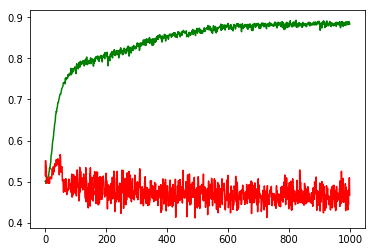

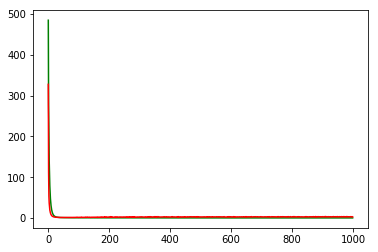

working on d,u and l,le 0.5 128 0.05 0.0001


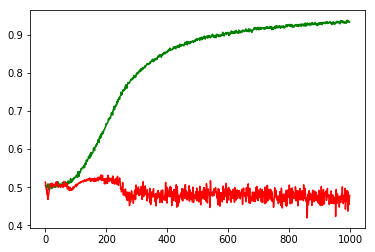

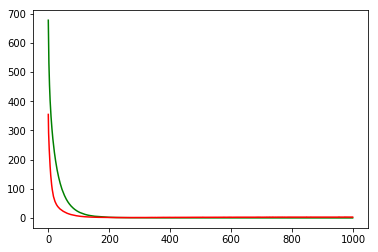

working on d,u and l,le 0.5 128 0.05 1e-05


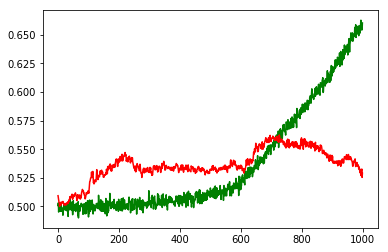

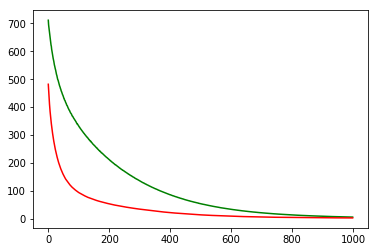

working on d,u and l,le 0.5 256 0.01 0.001


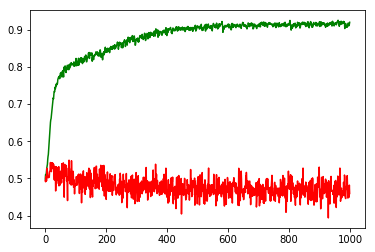

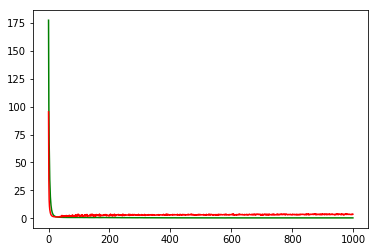

working on d,u and l,le 0.5 256 0.01 0.0001


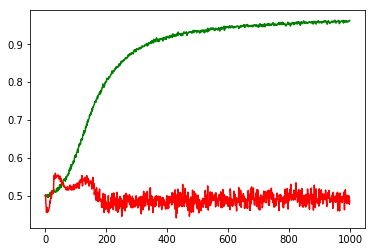

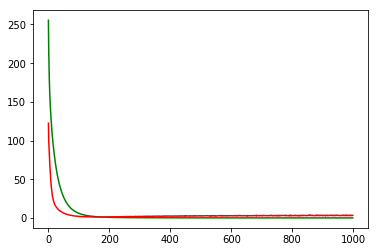

working on d,u and l,le 0.5 256 0.01 1e-05


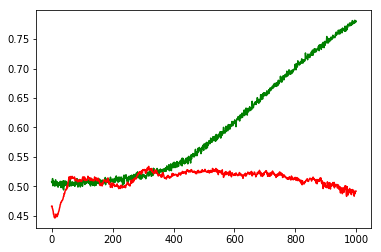

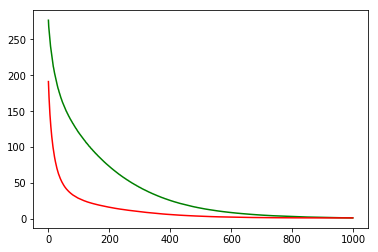

working on d,u and l,le 0.5 256 0.05 0.001


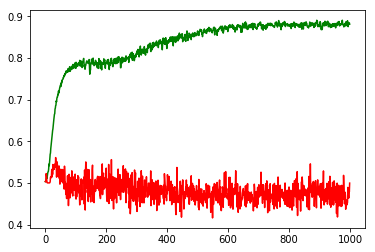

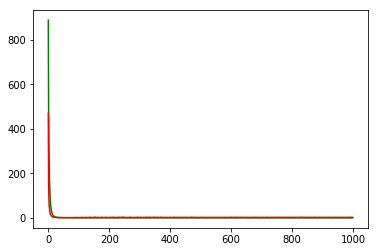

working on d,u and l,le 0.5 256 0.05 0.0001


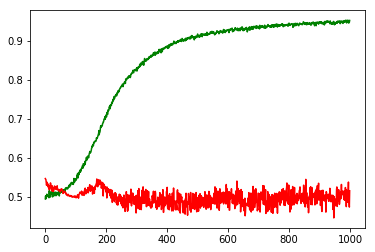

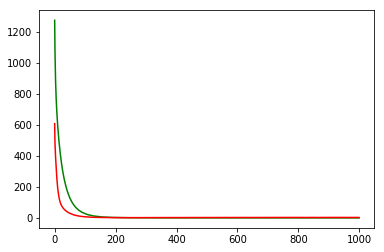

working on d,u and l,le 0.5 256 0.05 1e-05


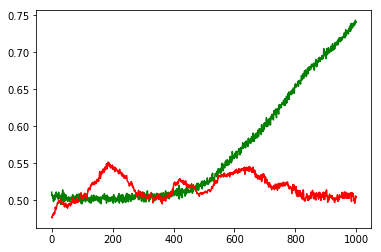

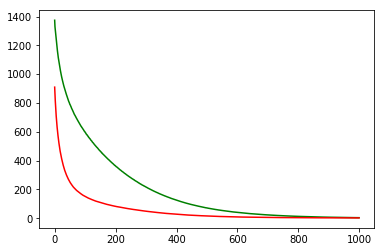

maxd,maxu,maxl,maxle: 0.5 256 0.05 0.0001
Chart for BEST MODEL FOR: NFLX


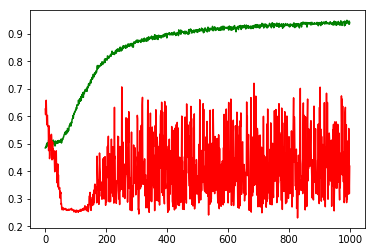

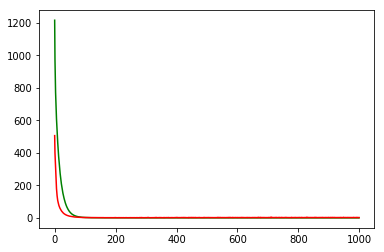

F1,score 0.5366197183098591
G-score: 0.3779919054721034
Accuracy 0.41872791435187784
Window: 140
[[ 93 204]
 [454 381]]
Vol pos 3.8866668538523017
Vol neg 4.660828883038568
Real Percentage of gain: -104.82472852476076
Percentage of gain: -1.0817538129976918
Total gain: -1224.545316313387
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 87  83]
 [145 145]]
460/460 [==============================] - 0s 47us/step
[2.1593081163323444, 0.5043478258278059]
Percentile:  1
[[  1  59]
 [152 116]]
328/328 [==============================] - 0s 41us/step
[2.7528895517674887, 0.3567073170731707]
Percentile:  2
[[  3  35]
 [119  76]]
233/233 [==============================] - 0s 42us/step
[2.842532346049092, 0.3390557947588581]
Percentile:  3
[[ 1 26]
 [37 33]]
97/97 [==============================] - 0s 49us/step
[3.462943804555947, 0.35051546391752575]
Percentile:  4
[[ 0  1]
 [ 1 10]]
12/12 [==============================] - 0s 109us/step
[0.8205804824829102, 0.8333333134651184]

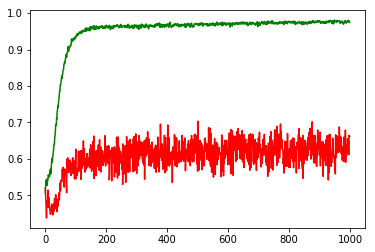

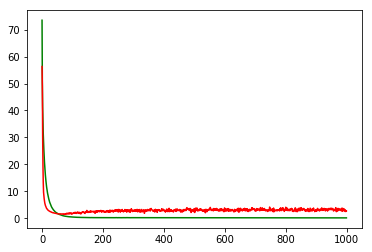

working on d,u and l,le 0.5 64 0.01 0.0001


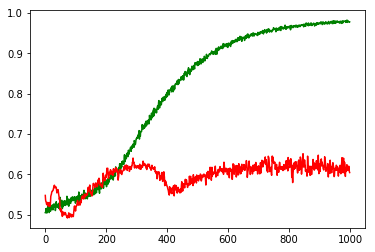

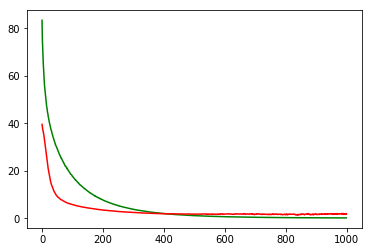

working on d,u and l,le 0.5 64 0.01 1e-05


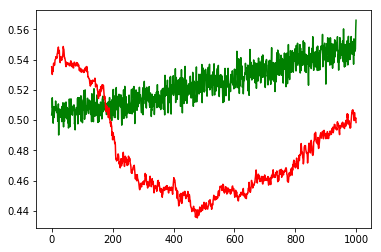

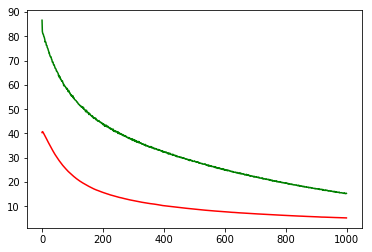

working on d,u and l,le 0.5 64 0.05 0.001


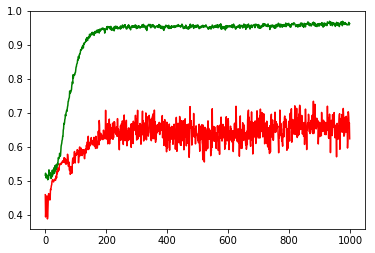

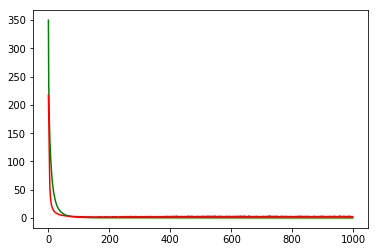

working on d,u and l,le 0.5 64 0.05 0.0001


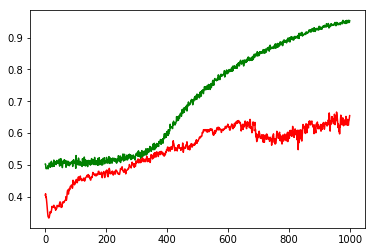

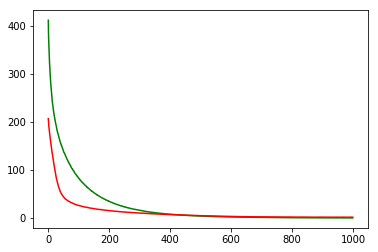

working on d,u and l,le 0.5 64 0.05 1e-05


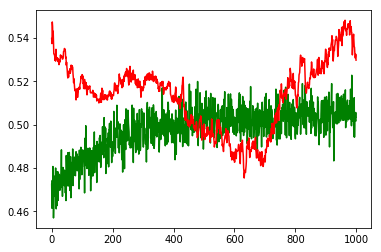

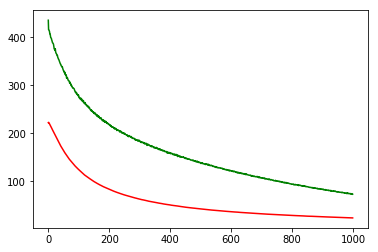

working on d,u and l,le 0.5 128 0.01 0.001


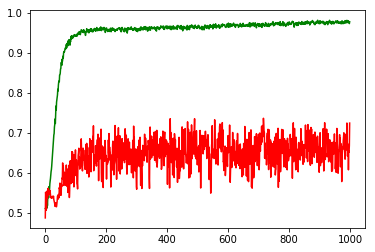

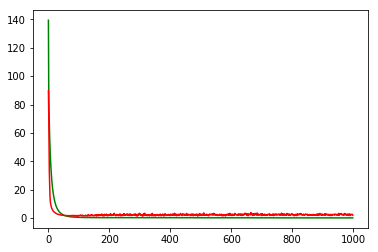

working on d,u and l,le 0.5 128 0.01 0.0001


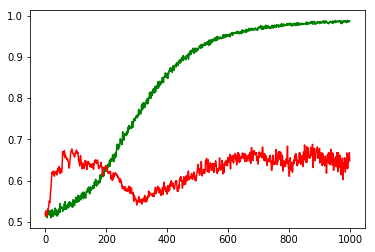

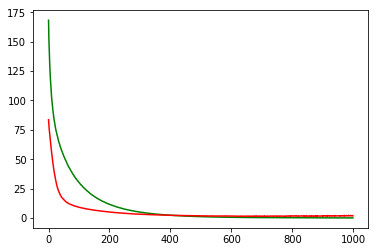

working on d,u and l,le 0.5 128 0.01 1e-05


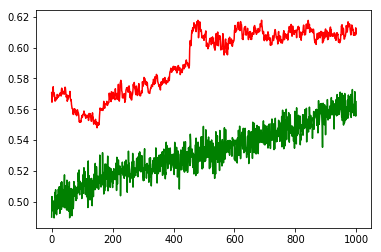

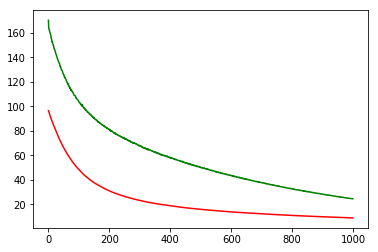

working on d,u and l,le 0.5 128 0.05 0.001


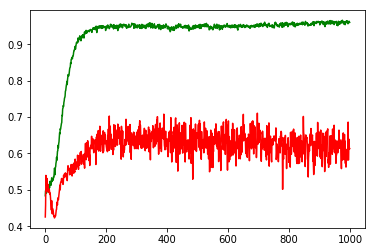

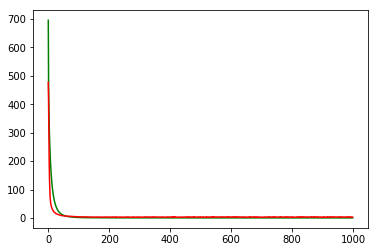

working on d,u and l,le 0.5 128 0.05 0.0001


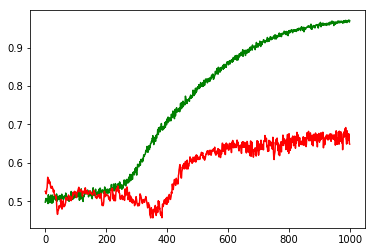

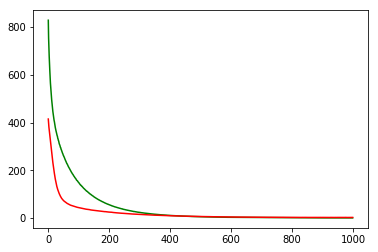

working on d,u and l,le 0.5 128 0.05 1e-05


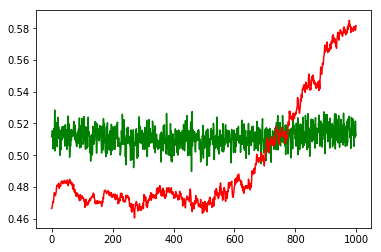

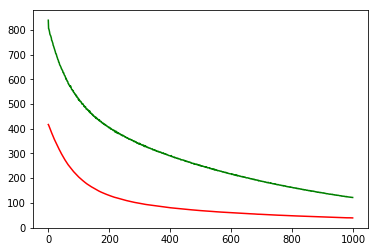

working on d,u and l,le 0.5 256 0.01 0.001


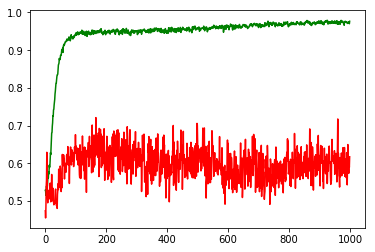

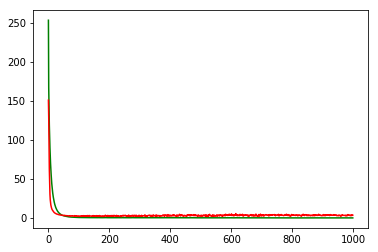

working on d,u and l,le 0.5 256 0.01 0.0001


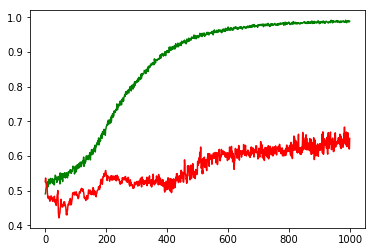

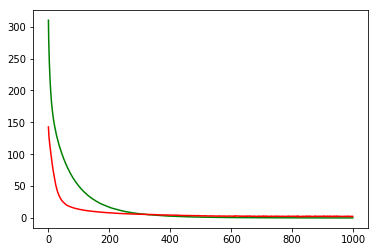

working on d,u and l,le 0.5 256 0.01 1e-05


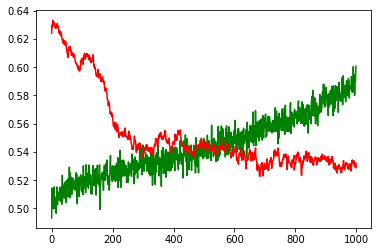

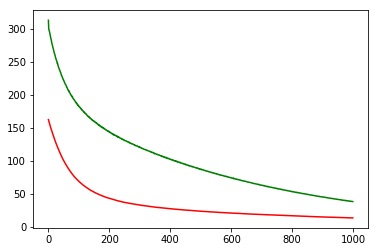

working on d,u and l,le 0.5 256 0.05 0.001


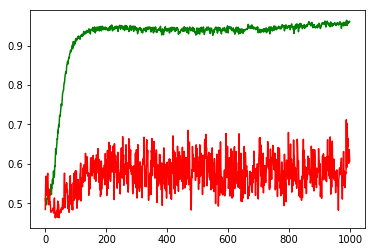

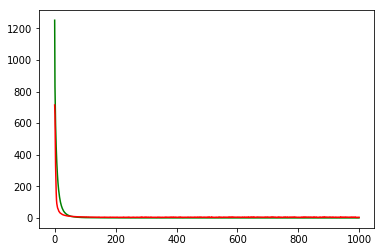

working on d,u and l,le 0.5 256 0.05 0.0001


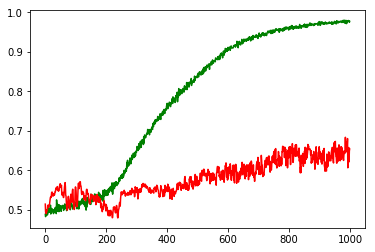

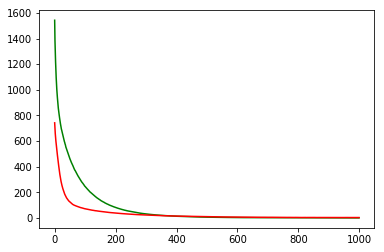

working on d,u and l,le 0.5 256 0.05 1e-05


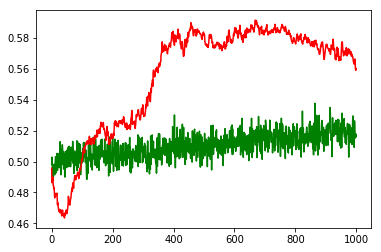

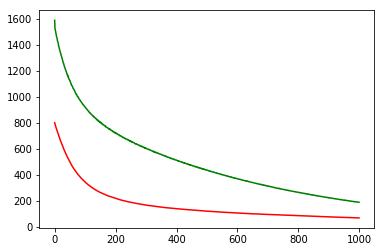

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: BKNG


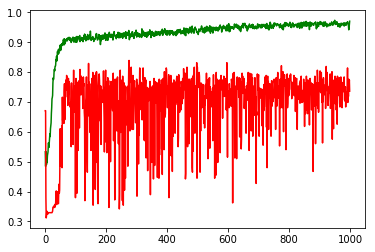

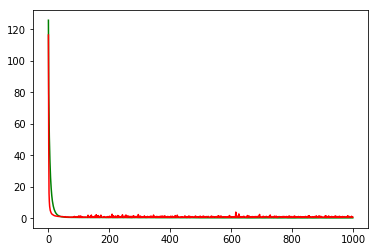

F1,score 0.7751605995717344
G-score: 0.7613020868401494
Accuracy 0.7361809036240505
Window: 140
[[112  19]
 [ 86 181]]
Vol pos 1.1808237508548938
Vol neg 1.1815194528627857
Real Percentage of gain: 157.9460662664257
Percentage of gain: 0.5575925036429433
Total gain: 221.92181644989142
000000000000000000000000000000000000000000000000
Percentile:  0
[[80 17]
 [19 56]]
172/172 [==============================] - 0s 30us/step
[0.5863579613005006, 0.7906976744186046]
Percentile:  1
[[26  0]
 [32 42]]
100/100 [==============================] - 0s 36us/step
[0.699576644897461, 0.68]
Percentile:  2
[[ 6  1]
 [30 52]]
89/89 [==============================] - 0s 54us/step
[1.0021496033400632, 0.6516853925887118]
Percentile:  3
[[ 0  0]
 [ 4 19]]
23/23 [==============================] - 0s 31us/step
[0.440280020236969, 0.8260869383811951]
Percentile:  4
[[ 0  0]
 [ 1 11]]
12/12 [==============================] - 0s 63us/step
[0.19940152764320374, 0.9166666865348816]
0000000000000000000000000000000

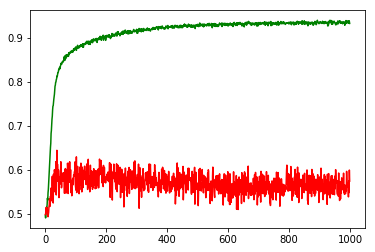

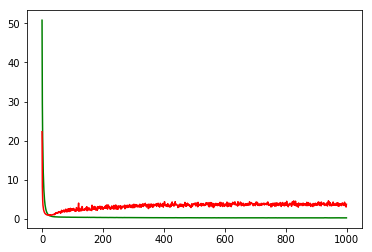

working on d,u and l,le 0.5 64 0.01 0.0001


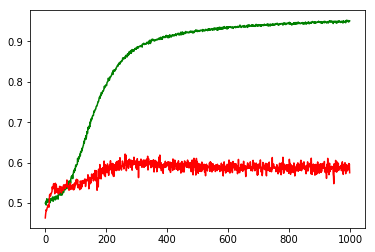

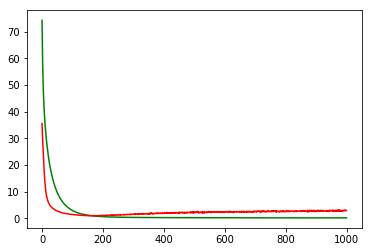

working on d,u and l,le 0.5 64 0.01 1e-05


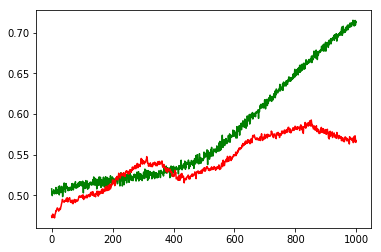

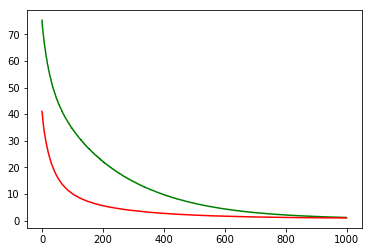

working on d,u and l,le 0.5 64 0.05 0.001


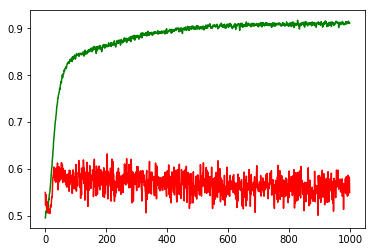

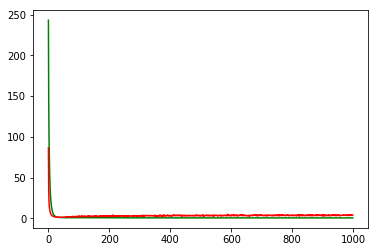

working on d,u and l,le 0.5 64 0.05 0.0001


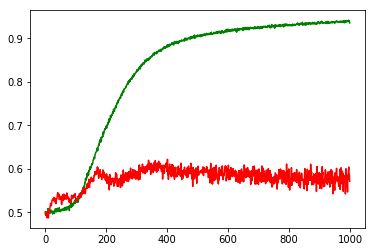

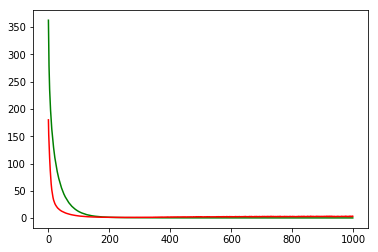

working on d,u and l,le 0.5 64 0.05 1e-05


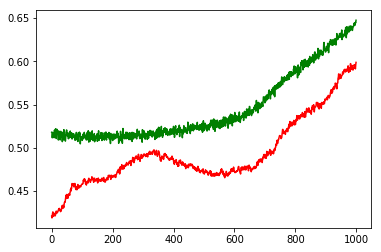

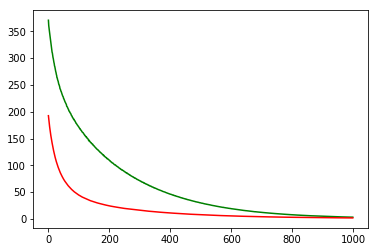

working on d,u and l,le 0.5 128 0.01 0.001


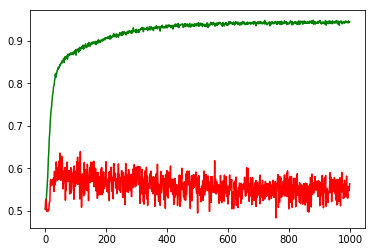

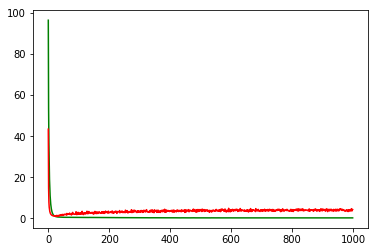

working on d,u and l,le 0.5 128 0.01 0.0001


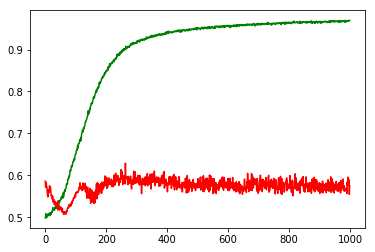

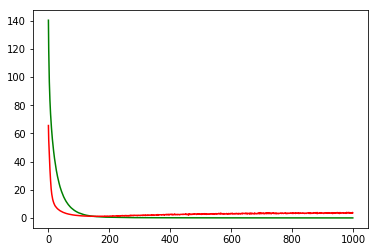

working on d,u and l,le 0.5 128 0.01 1e-05


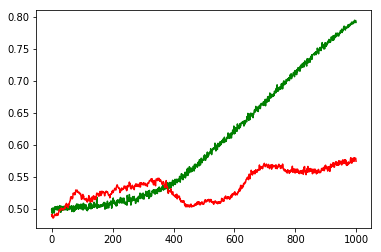

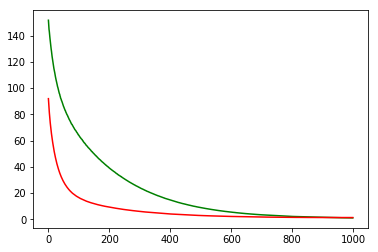

working on d,u and l,le 0.5 128 0.05 0.001


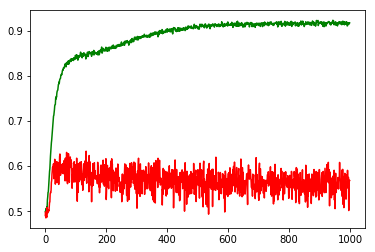

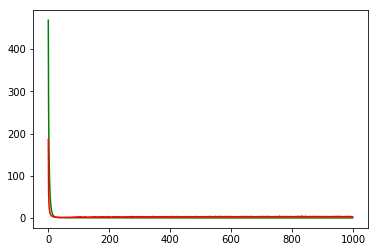

working on d,u and l,le 0.5 128 0.05 0.0001


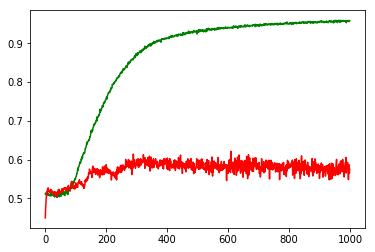

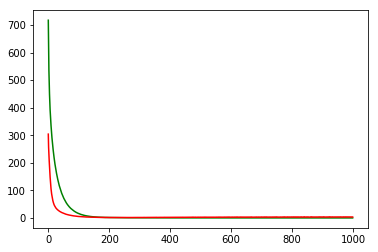

working on d,u and l,le 0.5 128 0.05 1e-05


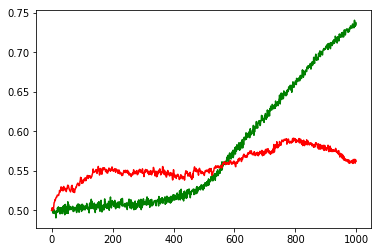

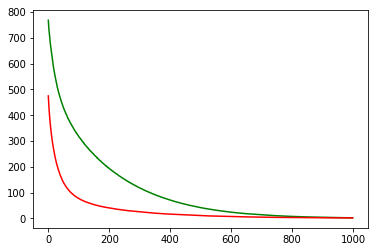

working on d,u and l,le 0.5 256 0.01 0.001


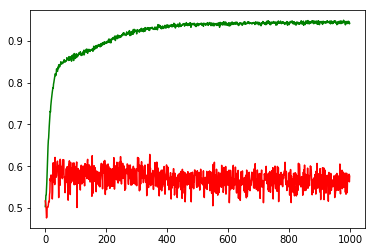

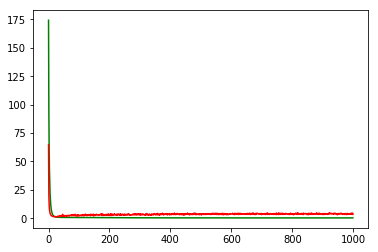

working on d,u and l,le 0.5 256 0.01 0.0001


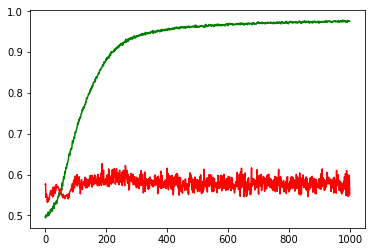

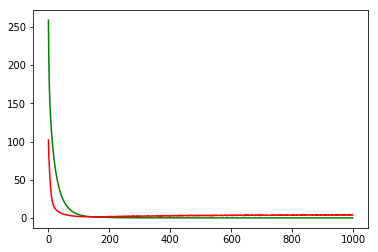

working on d,u and l,le 0.5 256 0.01 1e-05


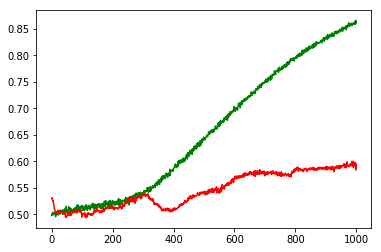

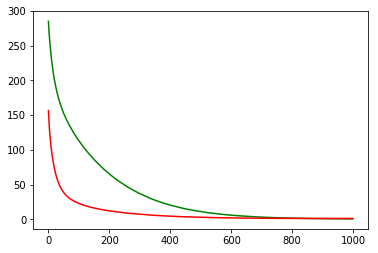

working on d,u and l,le 0.5 256 0.05 0.001


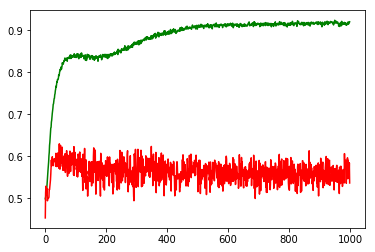

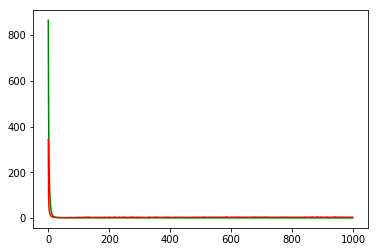

working on d,u and l,le 0.5 256 0.05 0.0001


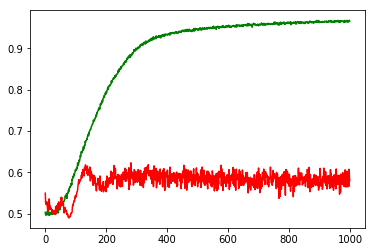

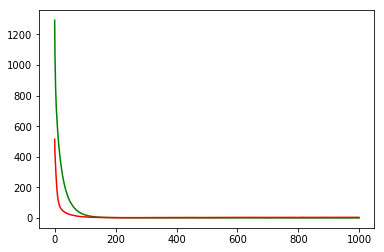

working on d,u and l,le 0.5 256 0.05 1e-05


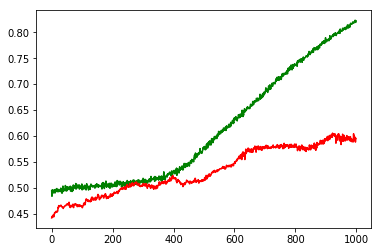

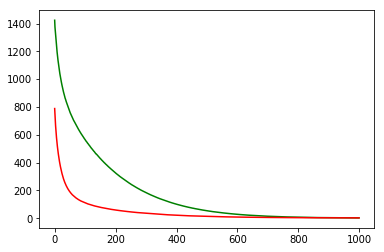

maxd,maxu,maxl,maxle: 0.5 256 0.01 1e-05
Chart for BEST MODEL FOR: ADBE


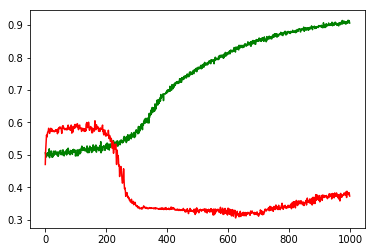

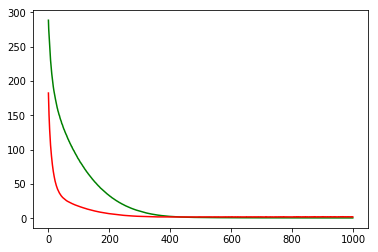

F1,score 0.3712255772646536
G-score: 0.39256909495868353
Accuracy 0.3728963692331863
Window: 140
[[212 176]
 [532 209]]
Vol pos 2.110698208901424
Vol neg 2.89637019178691
Real Percentage of gain: -119.85263520155904
Percentage of gain: -1.0292525685010034
Total gain: -1162.0261498376328
000000000000000000000000000000000000000000000000
Percentile:  0
[[141 136]
 [176 108]]
561/561 [==============================] - 0s 31us/step
[1.5929309481392995, 0.4438502681234091]
Percentile:  1
[[ 45  18]
 [196  65]]
324/324 [==============================] - 0s 35us/step
[1.851588581815178, 0.3395061728395062]
Percentile:  2
[[11 14]
 [97 36]]
158/158 [==============================] - 0s 32us/step
[2.187100153180617, 0.29746835065793387]
Percentile:  3
[[15  8]
 [43  0]]
66/66 [==============================] - 0s 59us/step
[2.5337714354197183, 0.22727272727272727]
Percentile:  4
[[ 0  0]
 [18  0]]
18/18 [==============================] - 0s 49us/step
[4.052627086639404, 0.0]
00000000000000000000

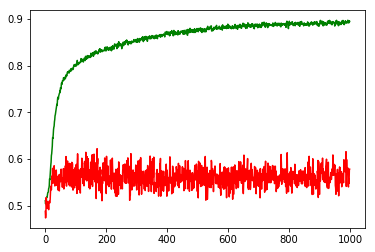

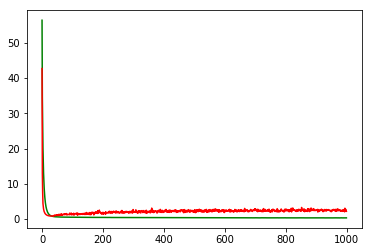

working on d,u and l,le 0.5 64 0.01 0.0001


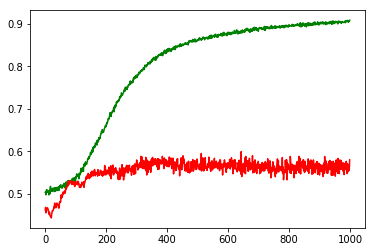

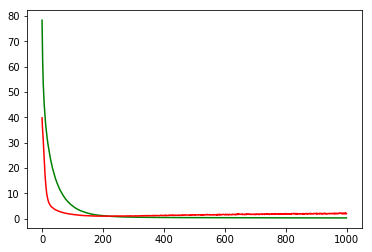

working on d,u and l,le 0.5 64 0.01 1e-05


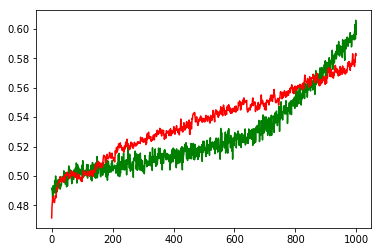

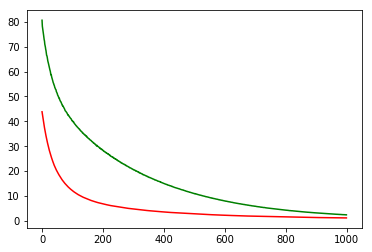

working on d,u and l,le 0.5 64 0.05 0.001


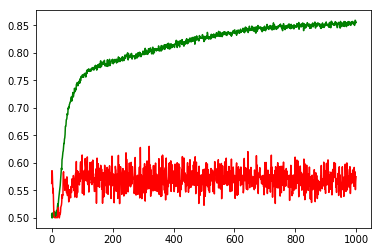

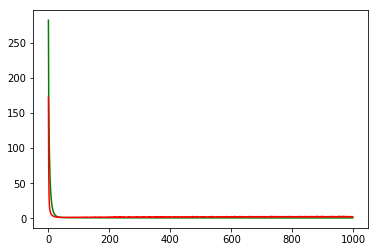

working on d,u and l,le 0.5 64 0.05 0.0001


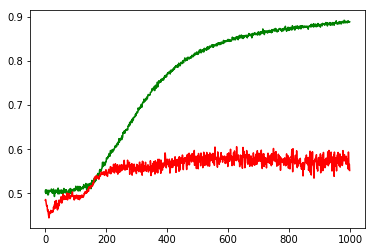

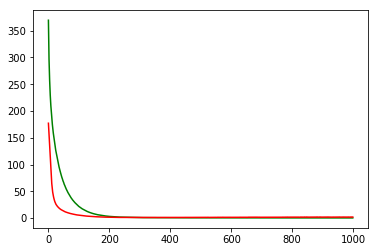

working on d,u and l,le 0.5 64 0.05 1e-05


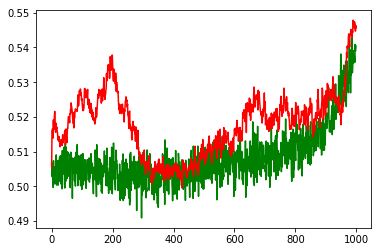

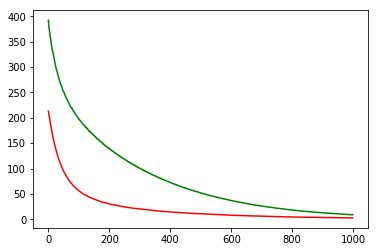

working on d,u and l,le 0.5 128 0.01 0.001


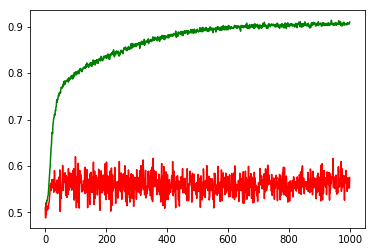

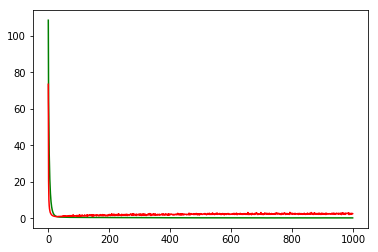

working on d,u and l,le 0.5 128 0.01 0.0001


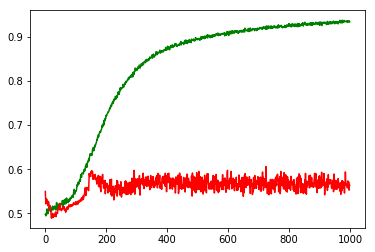

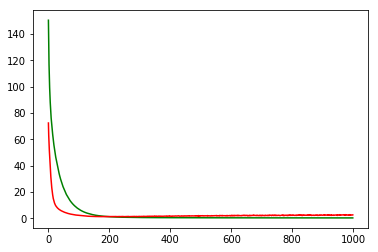

working on d,u and l,le 0.5 128 0.01 1e-05


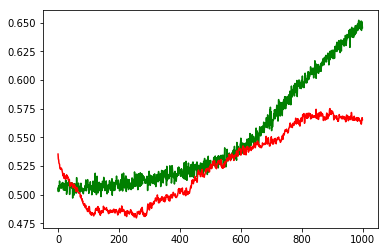

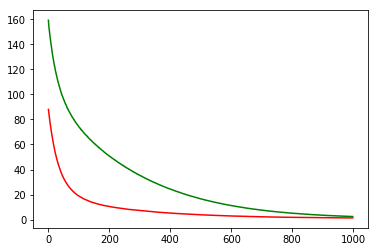

working on d,u and l,le 0.5 128 0.05 0.001


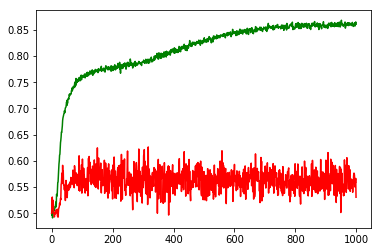

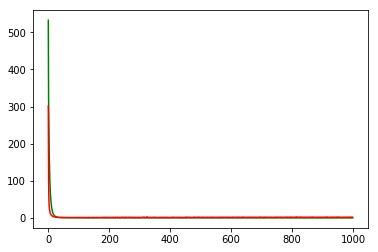

working on d,u and l,le 0.5 128 0.05 0.0001


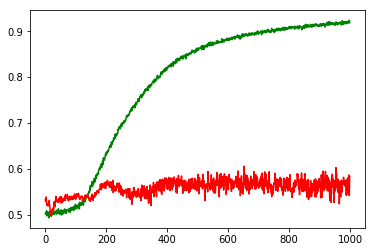

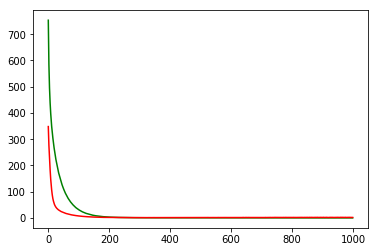

working on d,u and l,le 0.5 128 0.05 1e-05


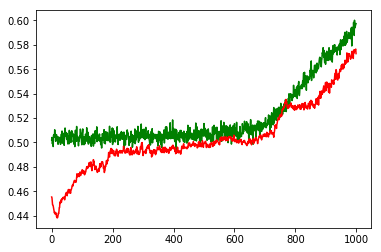

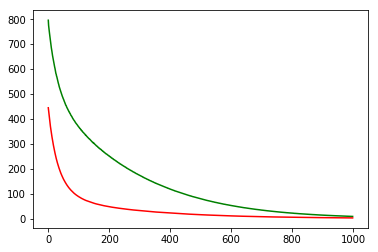

working on d,u and l,le 0.5 256 0.01 0.001


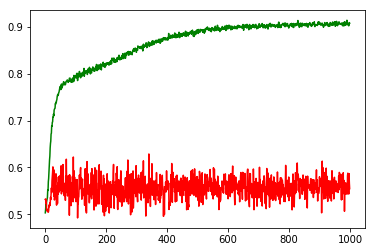

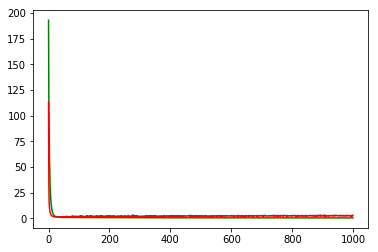

working on d,u and l,le 0.5 256 0.01 0.0001


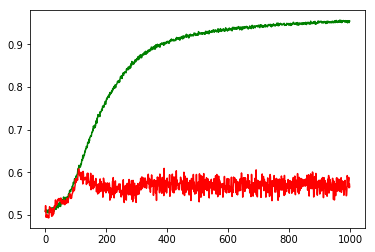

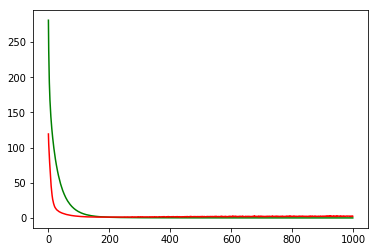

working on d,u and l,le 0.5 256 0.01 1e-05


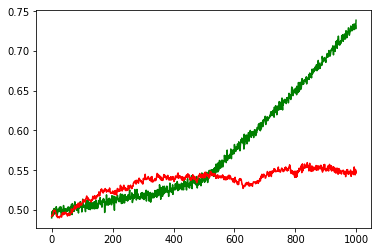

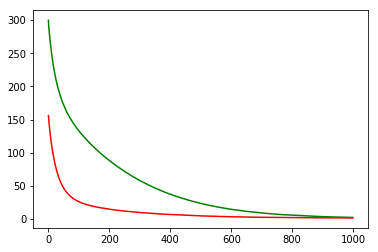

working on d,u and l,le 0.5 256 0.05 0.001


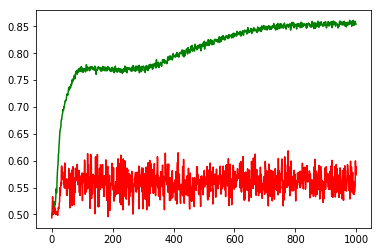

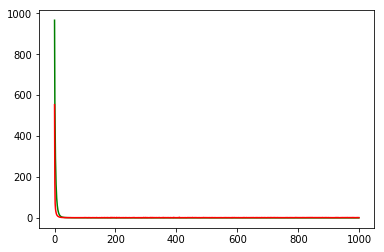

working on d,u and l,le 0.5 256 0.05 0.0001


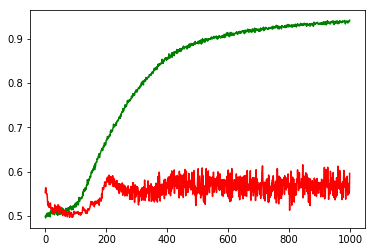

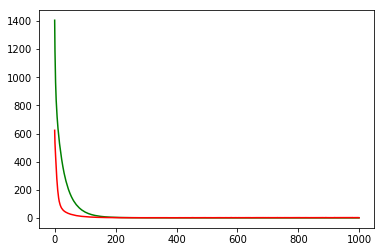

working on d,u and l,le 0.5 256 0.05 1e-05


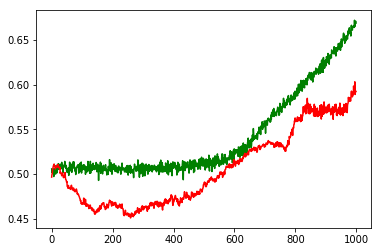

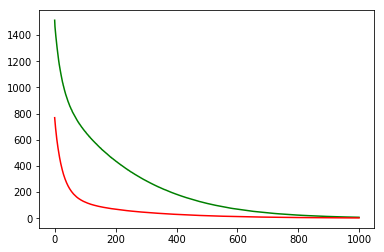

maxd,maxu,maxl,maxle: 0.5 256 0.05 0.0001
Chart for BEST MODEL FOR: AMGN


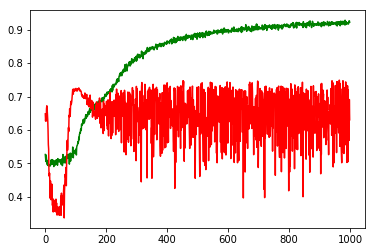

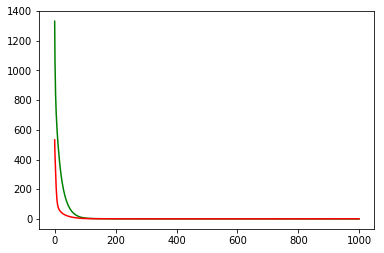

F1,score 0.7414330218068536
G-score: 0.5115227371146909
Accuracy 0.6304541431891525
Window: 140
[[113 207]
 [208 595]]
Vol pos 1.9264488504435016
Vol neg 1.939431010741714
Real Percentage of gain: 104.0611893292296
Percentage of gain: 0.4978289551702473
Total gain: 559.0619166561877
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 63 102]
 [ 87 194]]
446/446 [==============================] - 0s 29us/step
[1.172957121123113, 0.5762331822527899]
Percentile:  1
[[ 28  27]
 [ 64 197]]
316/316 [==============================] - 0s 39us/step
[0.767367993729024, 0.7120253160784517]
Percentile:  2
[[ 12  14]
 [ 44 144]]
214/214 [==============================] - 0s 33us/step
[0.6118668512763265, 0.7289719642879807]
Percentile:  3
[[10 46]
 [13 56]]
125/125 [==============================] - 0s 44us/step
[1.1851182088851928, 0.528000002861023]
Percentile:  4
[[ 0 17]
 [ 0  3]]
20/20 [==============================] - 0s 64us/step
[2.8027873039245605, 0.15000000596046448]
0000

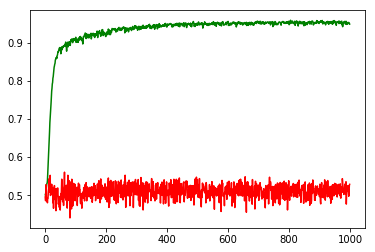

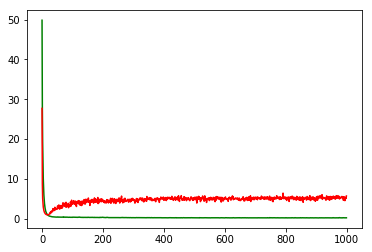

working on d,u and l,le 0.5 64 0.01 0.0001


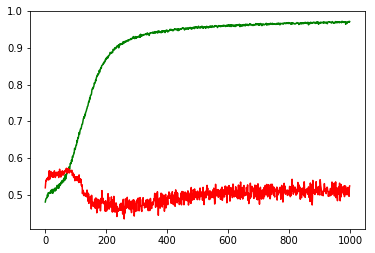

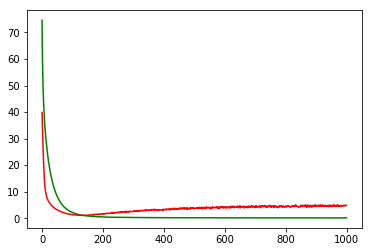

working on d,u and l,le 0.5 64 0.01 1e-05


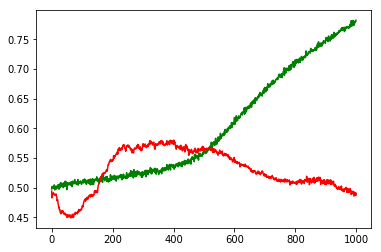

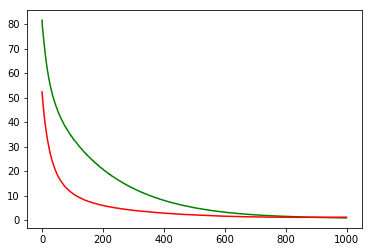

working on d,u and l,le 0.5 64 0.05 0.001


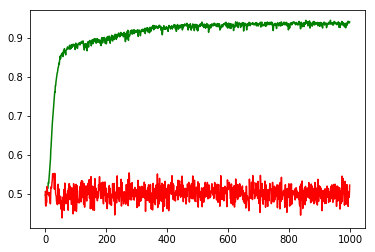

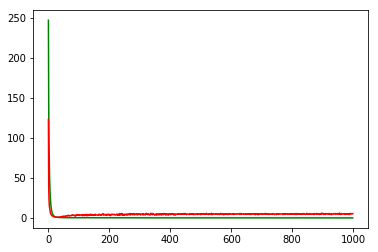

working on d,u and l,le 0.5 64 0.05 0.0001


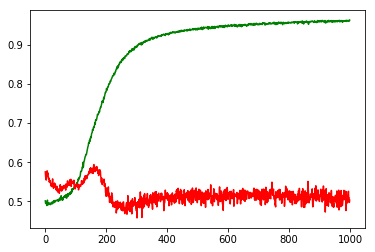

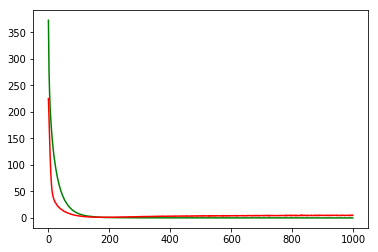

working on d,u and l,le 0.5 64 0.05 1e-05


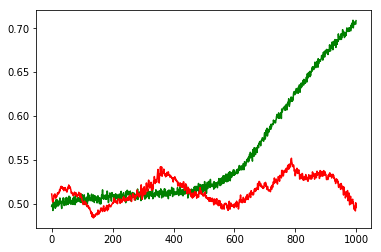

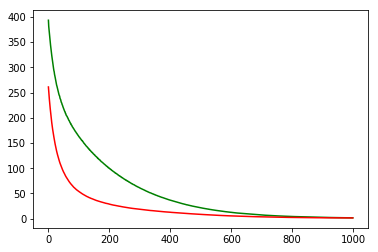

working on d,u and l,le 0.5 128 0.01 0.001


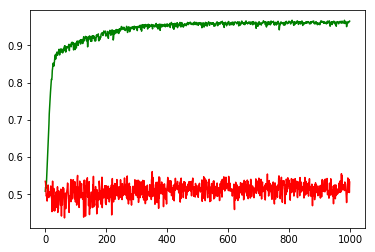

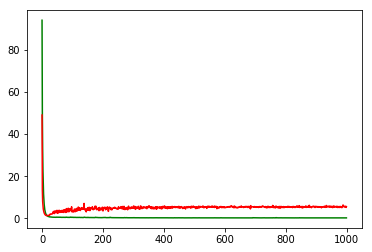

working on d,u and l,le 0.5 128 0.01 0.0001


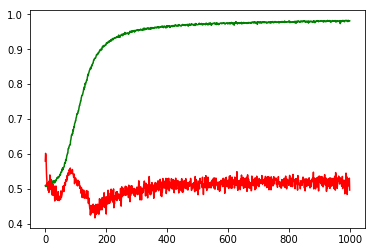

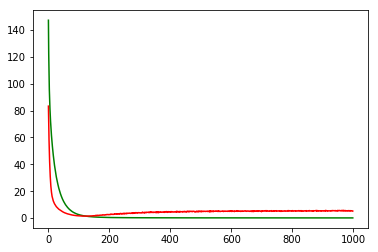

working on d,u and l,le 0.5 128 0.01 1e-05


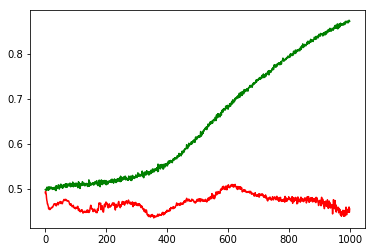

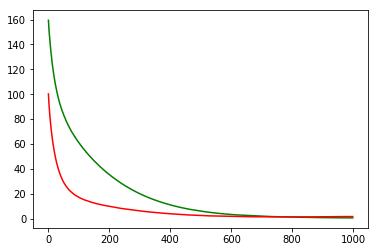

working on d,u and l,le 0.5 128 0.05 0.001


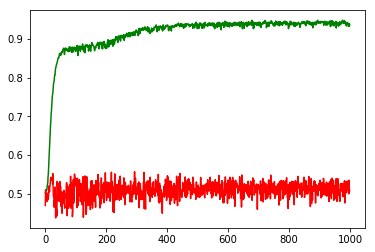

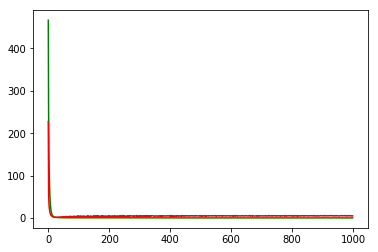

working on d,u and l,le 0.5 128 0.05 0.0001


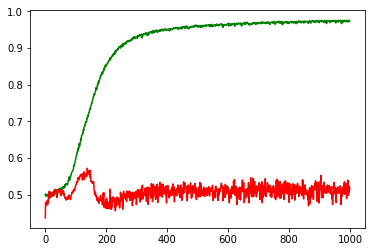

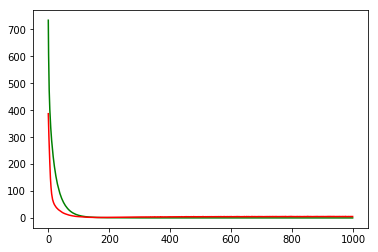

working on d,u and l,le 0.5 128 0.05 1e-05


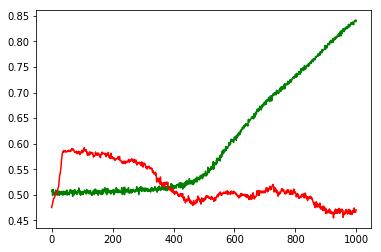

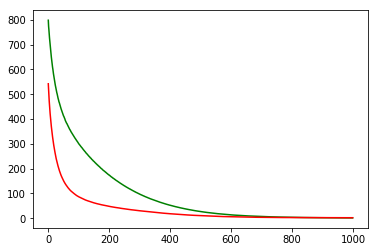

working on d,u and l,le 0.5 256 0.01 0.001


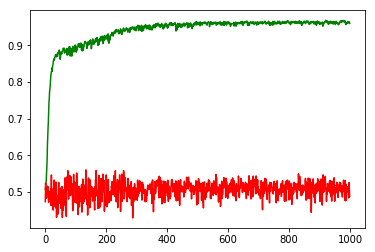

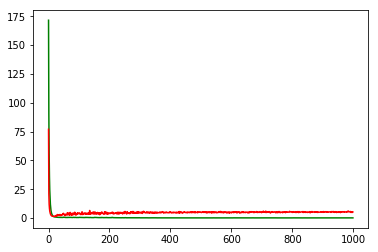

working on d,u and l,le 0.5 256 0.01 0.0001


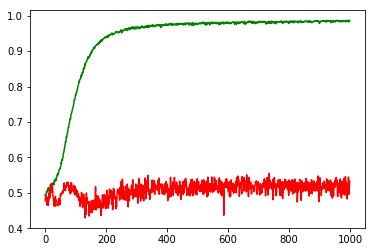

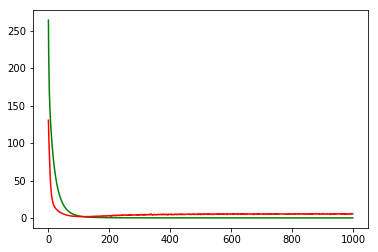

working on d,u and l,le 0.5 256 0.01 1e-05


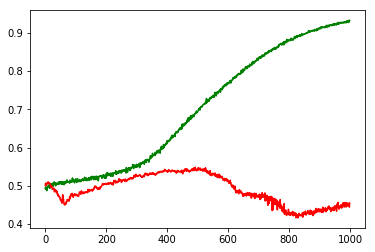

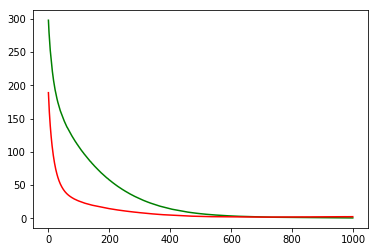

working on d,u and l,le 0.5 256 0.05 0.001


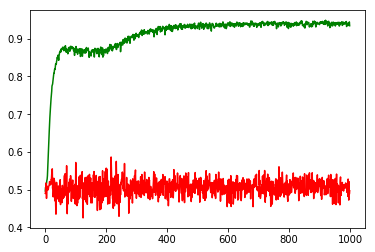

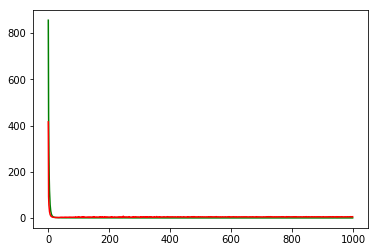

working on d,u and l,le 0.5 256 0.05 0.0001


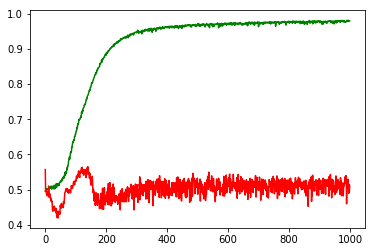

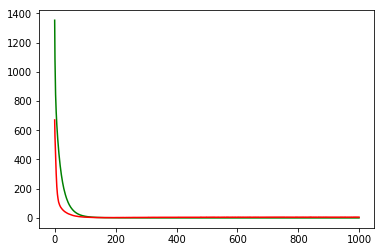

working on d,u and l,le 0.5 256 0.05 1e-05


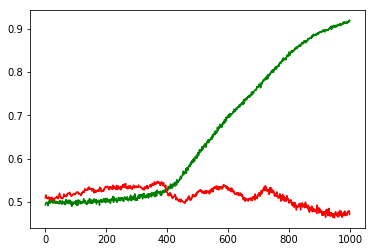

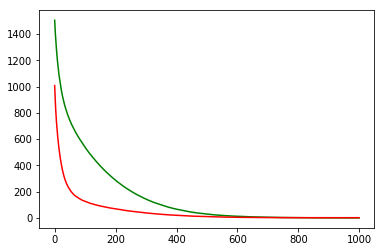

maxd,maxu,maxl,maxle: 0.5 128 0.05 1e-05
Chart for BEST MODEL FOR: TXN


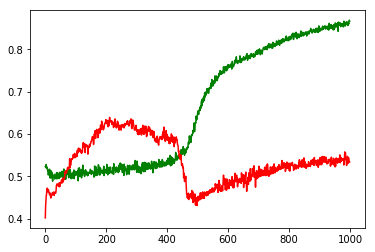

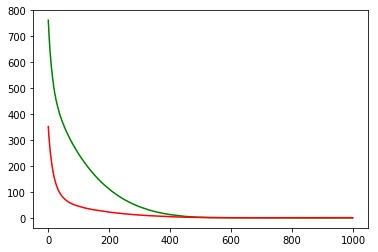

F1,score 0.5760257441673371
G-score: 0.5600449539521974
Accuracy 0.5340406714446981
Window: 140
[[246 122]
 [405 358]]
Vol pos 2.3963603398056077
Vol neg 2.609863866638748
Real Percentage of gain: -5.344254684942216
Percentage of gain: 0.06366347261181847
Total gain: 72.0033875239667
000000000000000000000000000000000000000000000000
Percentile:  0
[[140  68]
 [128 119]]
455/455 [==============================] - 0s 44us/step
[1.3231956157055529, 0.5692307693290186]
Percentile:  1
[[ 88  41]
 [102 103]]
334/334 [==============================] - 0s 26us/step
[1.196202050426049, 0.5718562874251497]
Percentile:  2
[[ 10   4]
 [114  64]]
192/192 [==============================] - 0s 37us/step
[1.574998398621877, 0.3854166666666667]
Percentile:  3
[[ 6  4]
 [58 54]]
122/122 [==============================] - 0s 72us/step
[1.0469000183168005, 0.49180327899387627]
Percentile:  4
[[ 2  5]
 [ 3 16]]
26/26 [==============================] - 0s 43us/step
[0.931911051273346, 0.692307710647583]
0000

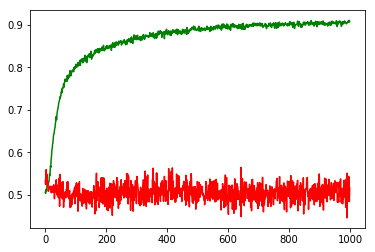

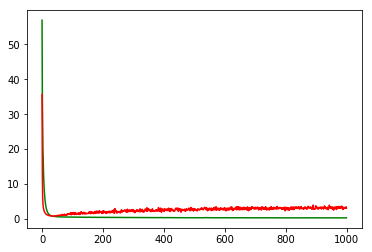

working on d,u and l,le 0.5 64 0.01 0.0001


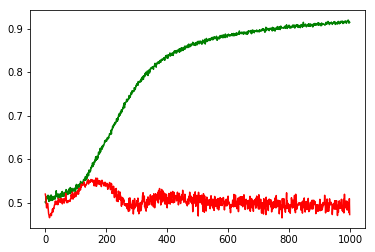

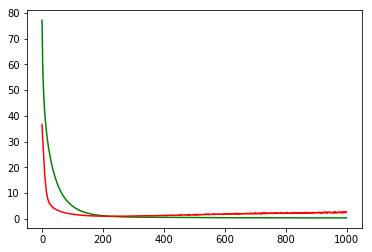

working on d,u and l,le 0.5 64 0.01 1e-05


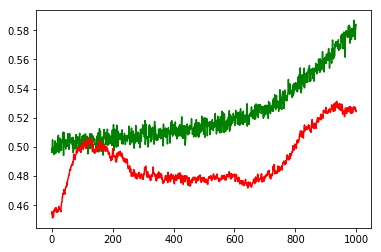

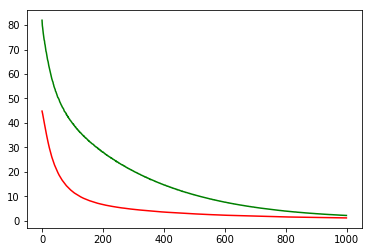

working on d,u and l,le 0.5 64 0.05 0.001


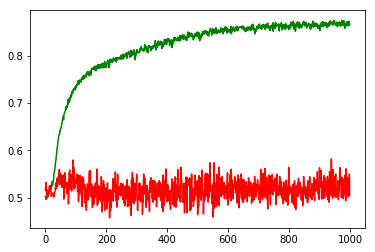

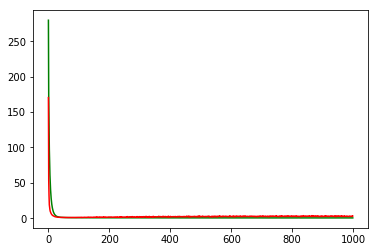

working on d,u and l,le 0.5 64 0.05 0.0001


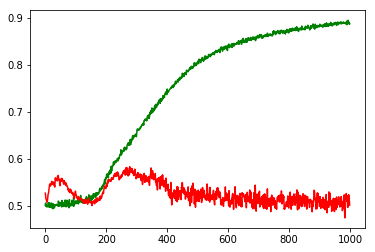

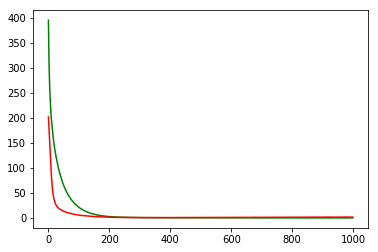

working on d,u and l,le 0.5 64 0.05 1e-05


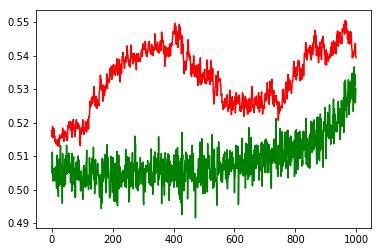

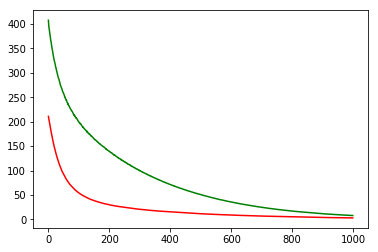

working on d,u and l,le 0.5 128 0.01 0.001


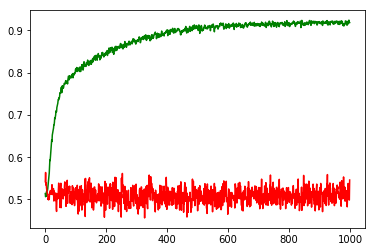

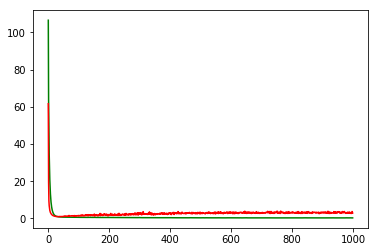

working on d,u and l,le 0.5 128 0.01 0.0001


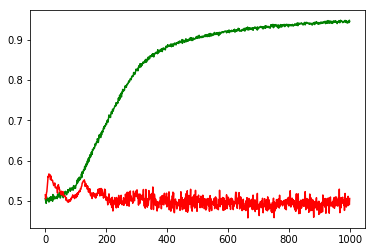

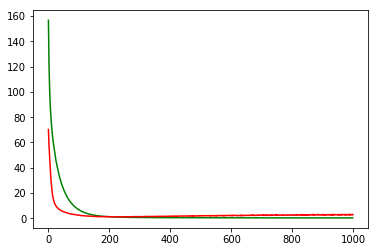

working on d,u and l,le 0.5 128 0.01 1e-05


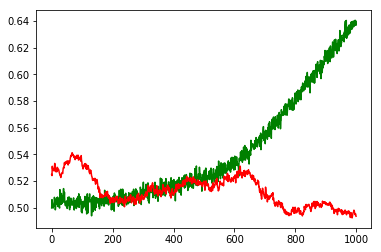

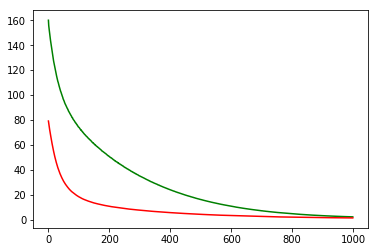

working on d,u and l,le 0.5 128 0.05 0.001


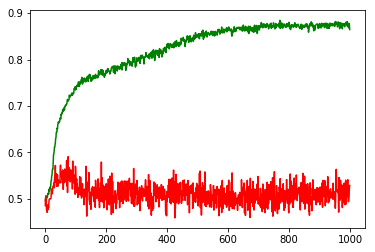

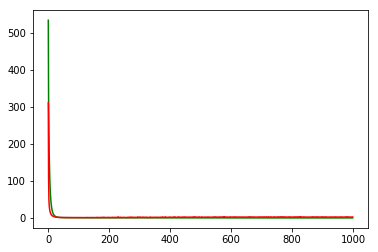

working on d,u and l,le 0.5 128 0.05 0.0001


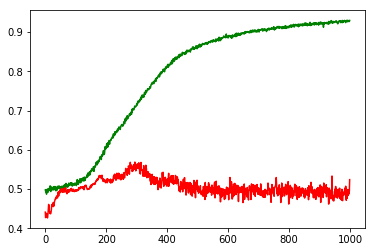

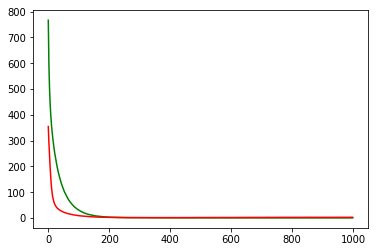

working on d,u and l,le 0.5 128 0.05 1e-05


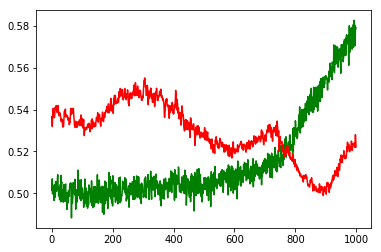

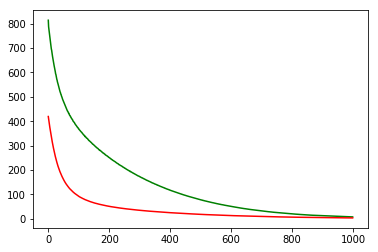

working on d,u and l,le 0.5 256 0.01 0.001


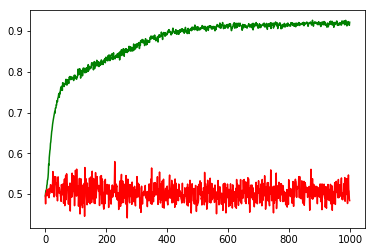

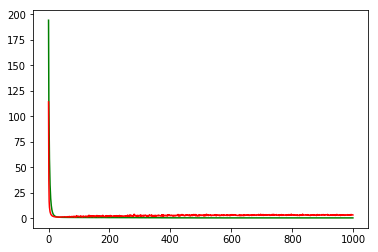

working on d,u and l,le 0.5 256 0.01 0.0001


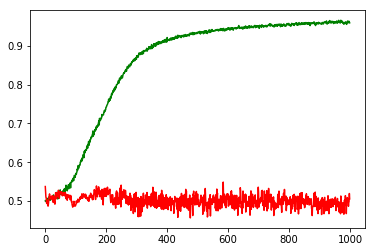

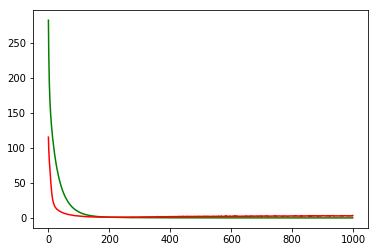

working on d,u and l,le 0.5 256 0.01 1e-05


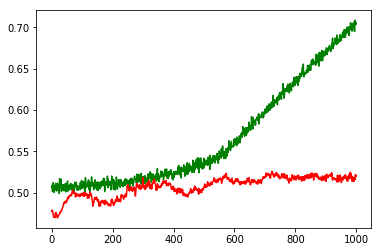

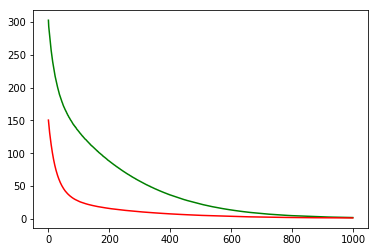

working on d,u and l,le 0.5 256 0.05 0.001


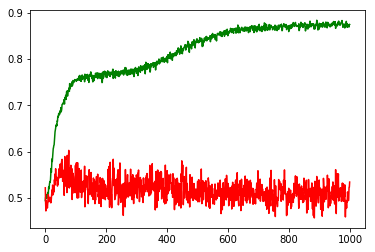

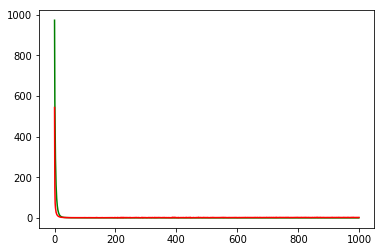

working on d,u and l,le 0.5 256 0.05 0.0001


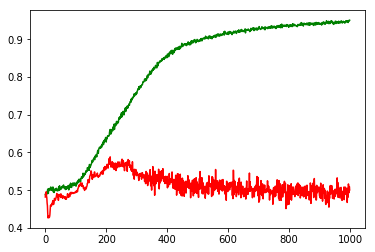

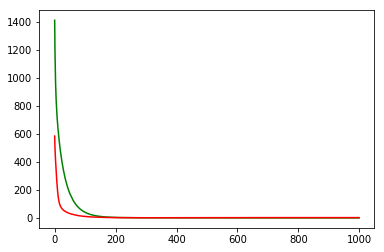

working on d,u and l,le 0.5 256 0.05 1e-05


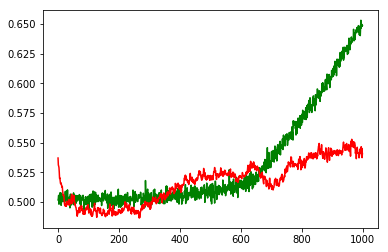

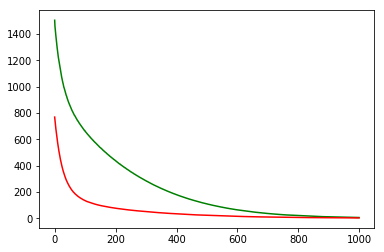

maxd,maxu,maxl,maxle: 0.5 128 0.01 0.001
Chart for BEST MODEL FOR: AVGO


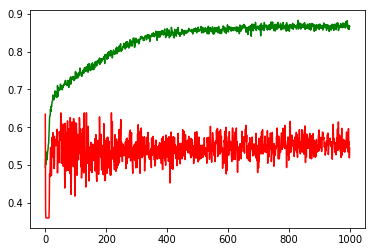

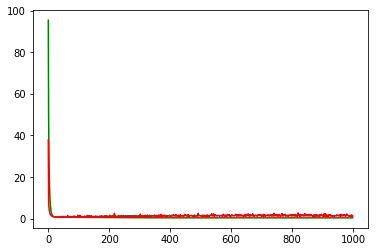

F1,score 0.6168782673637042
G-score: 0.5325279481786586
Accuracy 0.5448092259235263
Window: 140
[[201 205]
 [308 413]]
Vol pos 3.918731098615439
Vol neg 2.344000481664481
Real Percentage of gain: -32.662924418371084
Percentage of gain: 1.06799347600355
Total gain: 1203.6286474560009
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 95 106]
 [194  80]]
475/475 [==============================] - 0s 26us/step
[1.6348849109599466, 0.36842105162771127]
Percentile:  1
[[ 36  68]
 [ 27 123]]
254/254 [==============================] - 0s 29us/step
[1.0972000449661194, 0.6259842552537993]
Percentile:  2
[[ 18  20]
 [ 83 139]]
260/260 [==============================] - 0s 32us/step
[1.11404965198957, 0.6038461538461538]
Percentile:  3
[[16  9]
 [ 4 59]]
88/88 [==============================] - 0s 35us/step
[0.36466479843313043, 0.8522727218541232]
Percentile:  4
[[35  2]
 [ 0 11]]
48/48 [==============================] - 0s 50us/step
[0.19371014833450317, 0.9583333333333334]
000

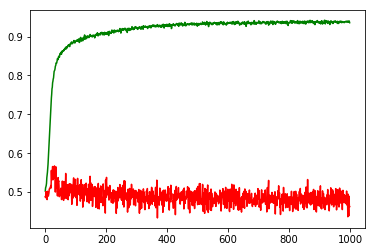

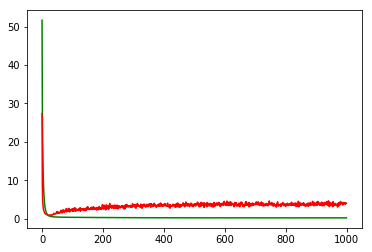

working on d,u and l,le 0.5 64 0.01 0.0001


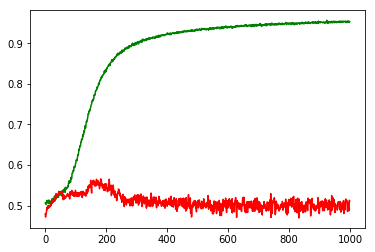

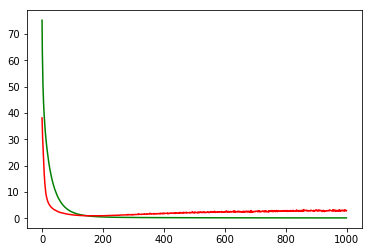

working on d,u and l,le 0.5 64 0.01 1e-05


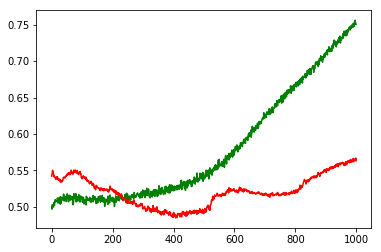

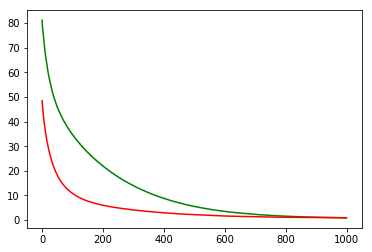

working on d,u and l,le 0.5 64 0.05 0.001


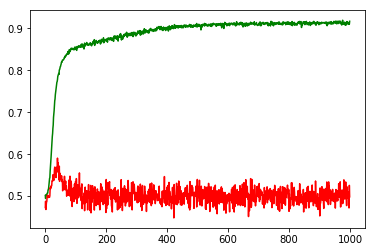

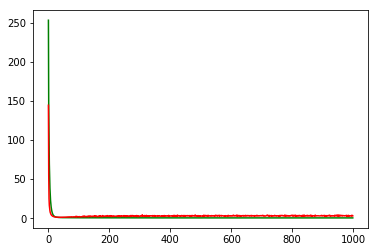

working on d,u and l,le 0.5 64 0.05 0.0001


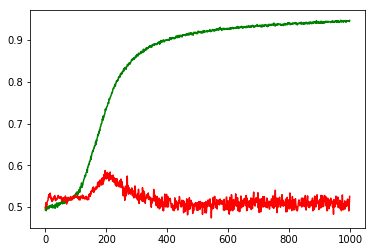

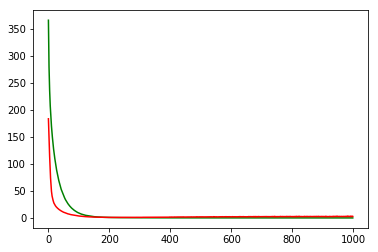

working on d,u and l,le 0.5 64 0.05 1e-05


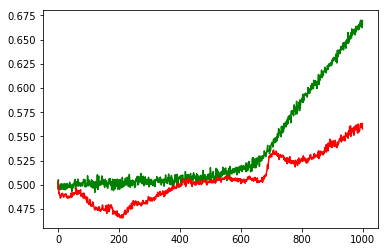

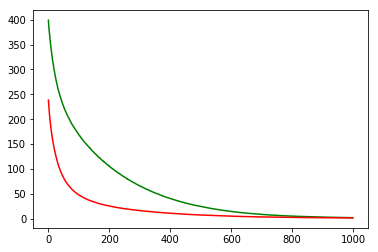

working on d,u and l,le 0.5 128 0.01 0.001


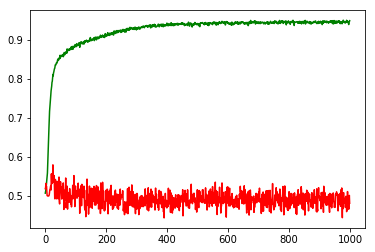

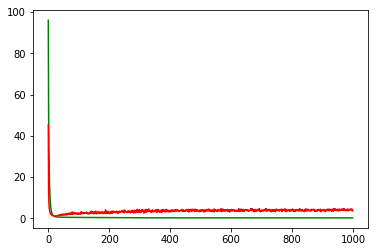

working on d,u and l,le 0.5 128 0.01 0.0001


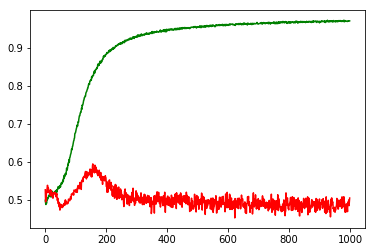

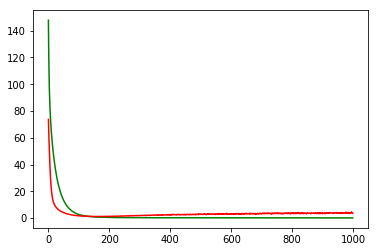

working on d,u and l,le 0.5 128 0.01 1e-05


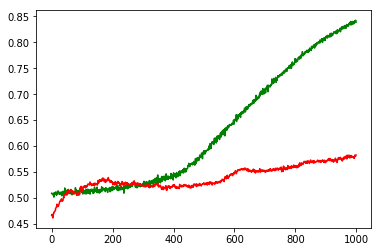

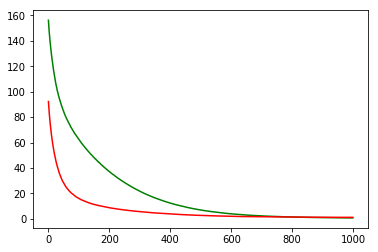

working on d,u and l,le 0.5 128 0.05 0.001


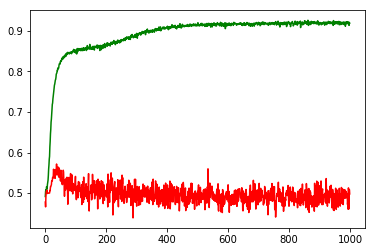

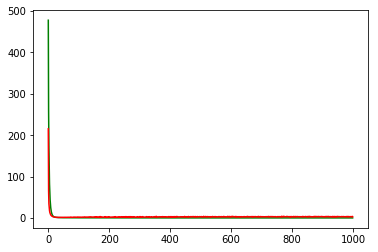

working on d,u and l,le 0.5 128 0.05 0.0001


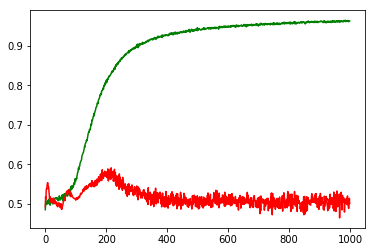

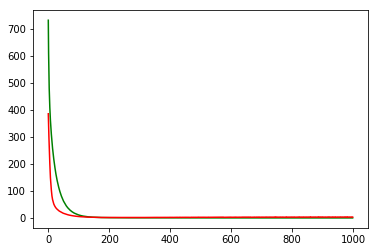

working on d,u and l,le 0.5 128 0.05 1e-05


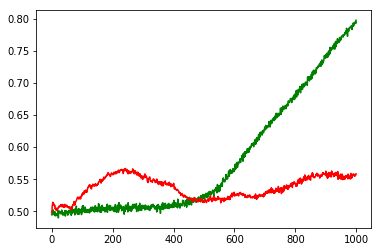

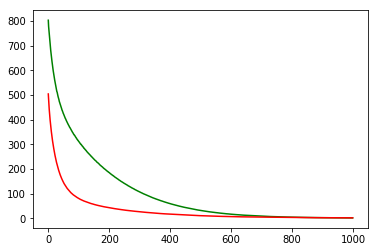

working on d,u and l,le 0.5 256 0.01 0.001


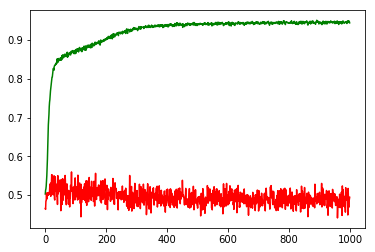

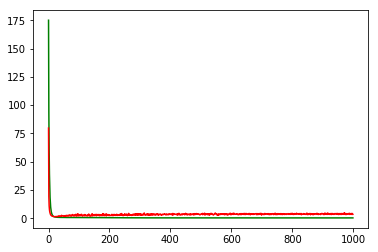

working on d,u and l,le 0.5 256 0.01 0.0001


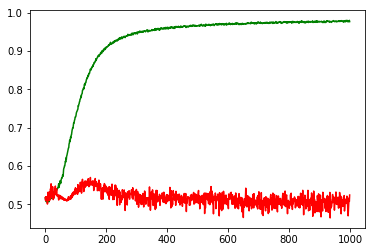

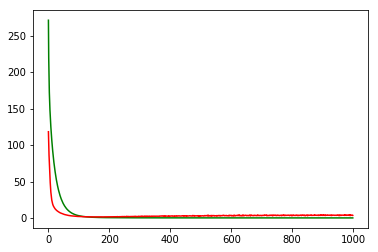

working on d,u and l,le 0.5 256 0.01 1e-05


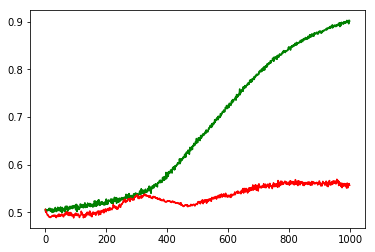

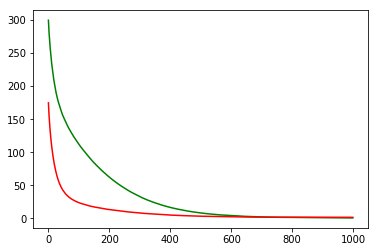

working on d,u and l,le 0.5 256 0.05 0.001


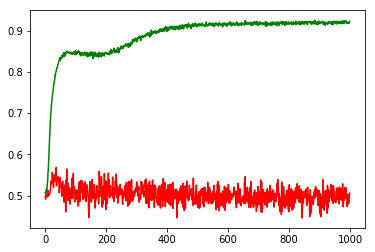

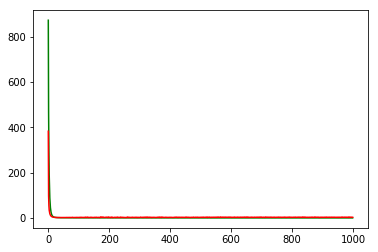

working on d,u and l,le 0.5 256 0.05 0.0001


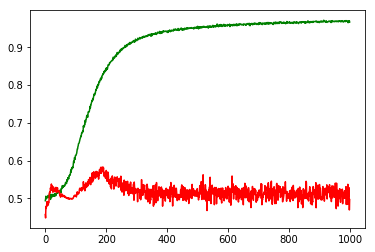

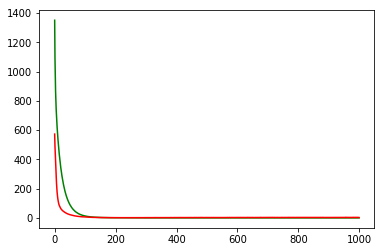

working on d,u and l,le 0.5 256 0.05 1e-05


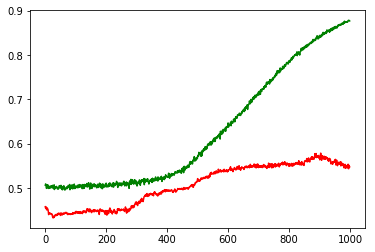

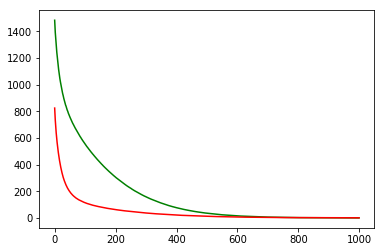

maxd,maxu,maxl,maxle: 0.5 256 0.05 1e-05
Chart for BEST MODEL FOR: PYPL


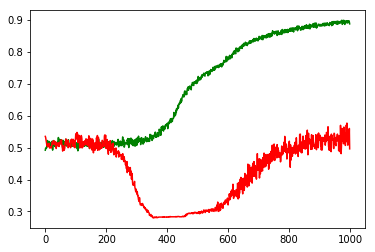

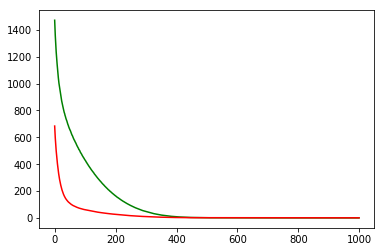

F1,score 0.5903527717782577
G-score: 0.4883301858635375
Accuracy 0.49601417399804293
Window: 140
[[150 168]
 [401 410]]
Vol pos 2.942923347432302
Vol neg 2.8773841771968813
Real Percentage of gain: -57.033189773037996
Percentage of gain: 0.009570839448240666
Total gain: 10.805477737063711
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 57  77]
 [233 212]]
579/579 [==============================] - 0s 32us/step
[1.2263067952503606, 0.46459412790950716]
Percentile:  1
[[ 14  37]
 [102 155]]
308/308 [==============================] - 0s 36us/step
[0.9948971356664386, 0.5487012971531261]
Percentile:  2
[[73 47]
 [31 33]]
184/184 [==============================] - 0s 31us/step
[1.0056432537410571, 0.5760869539302328]
Percentile:  3
[[ 6  7]
 [26  4]]
43/43 [==============================] - 0s 87us/step
[1.611722702203795, 0.23255814092103824]
Percentile:  4
[[0 0]
 [7 5]]
12/12 [==============================] - 0s 71us/step
[1.2587394714355469, 0.4166666567325592]
00000

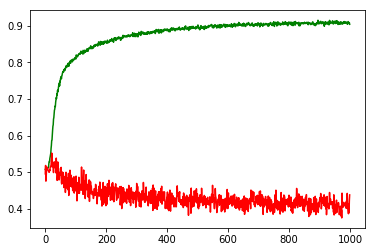

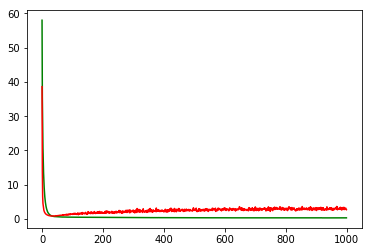

working on d,u and l,le 0.5 64 0.01 0.0001


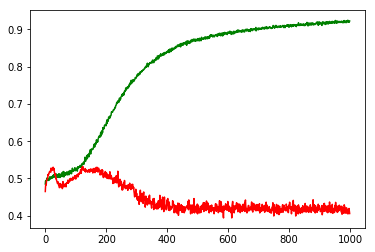

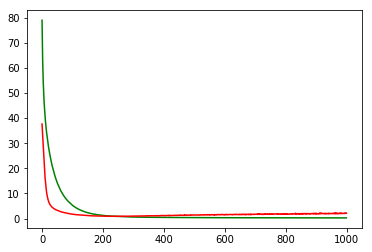

working on d,u and l,le 0.5 64 0.01 1e-05


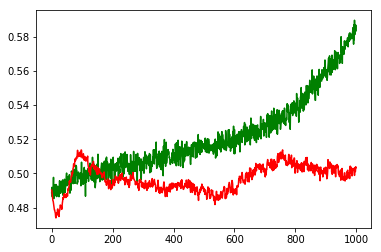

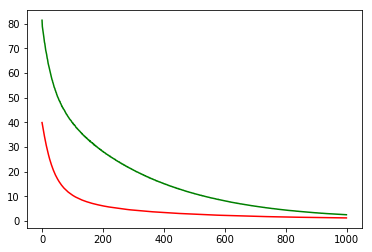

working on d,u and l,le 0.5 64 0.05 0.001


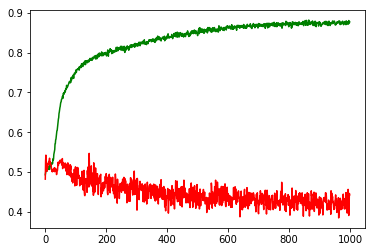

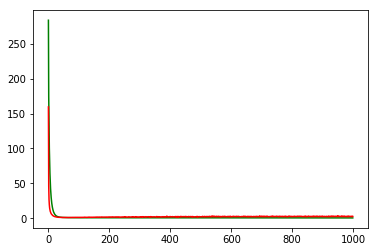

working on d,u and l,le 0.5 64 0.05 0.0001


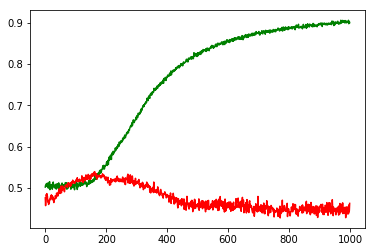

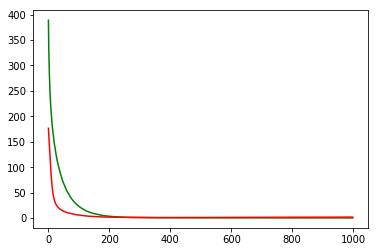

working on d,u and l,le 0.5 64 0.05 1e-05


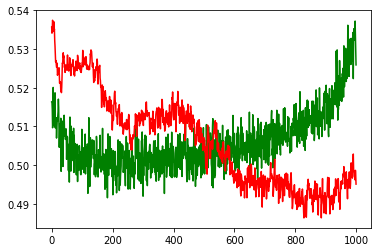

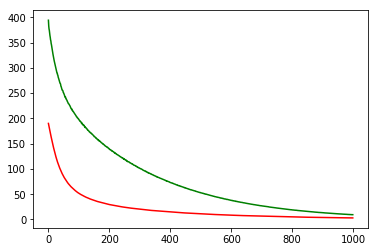

working on d,u and l,le 0.5 128 0.01 0.001


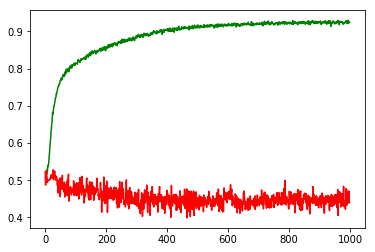

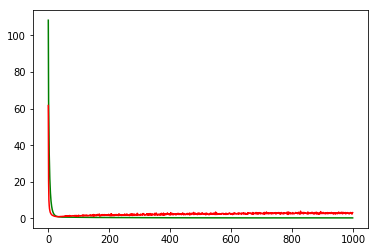

working on d,u and l,le 0.5 128 0.01 0.0001


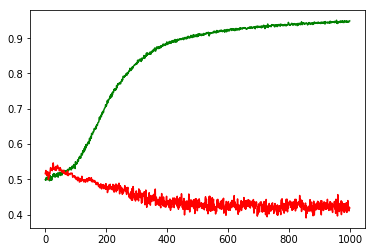

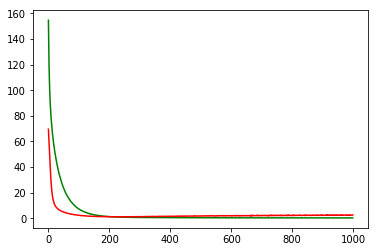

working on d,u and l,le 0.5 128 0.01 1e-05


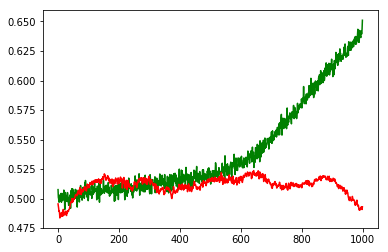

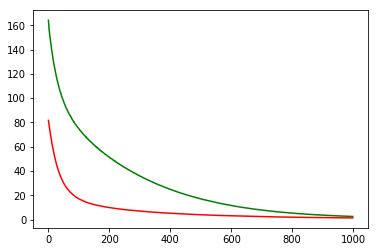

working on d,u and l,le 0.5 128 0.05 0.001


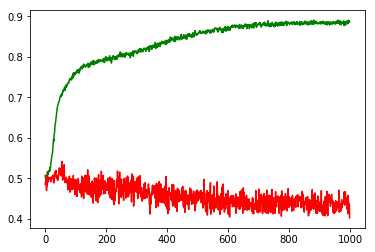

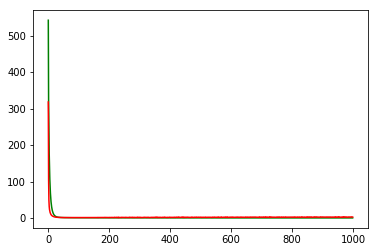

working on d,u and l,le 0.5 128 0.05 0.0001


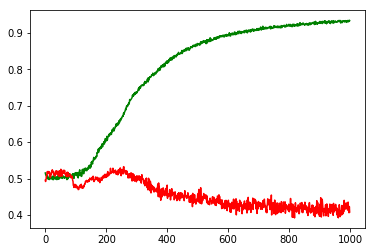

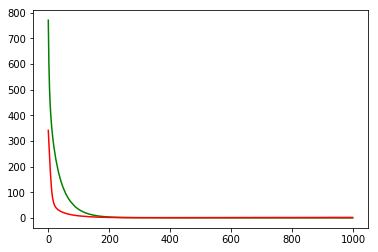

working on d,u and l,le 0.5 128 0.05 1e-05


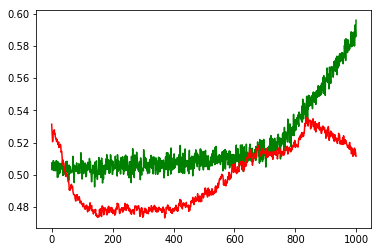

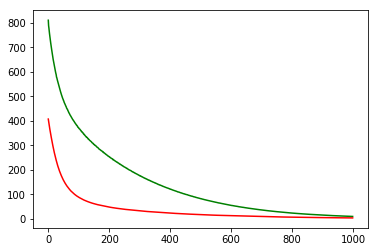

working on d,u and l,le 0.5 256 0.01 0.001


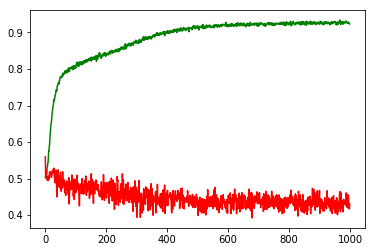

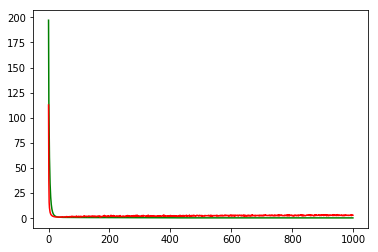

working on d,u and l,le 0.5 256 0.01 0.0001


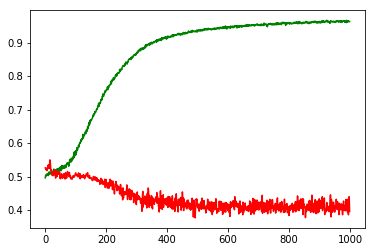

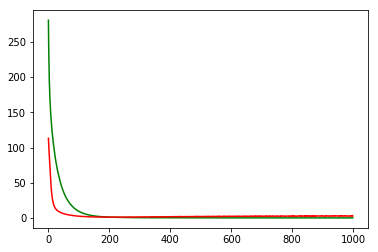

working on d,u and l,le 0.5 256 0.01 1e-05


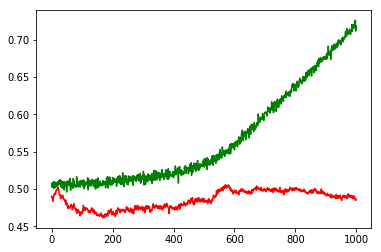

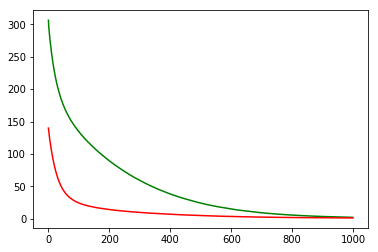

working on d,u and l,le 0.5 256 0.05 0.001


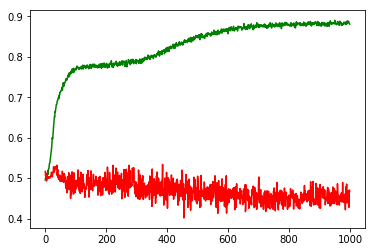

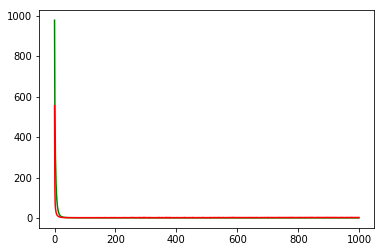

working on d,u and l,le 0.5 256 0.05 0.0001


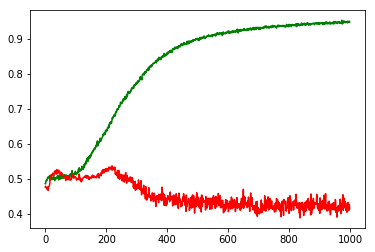

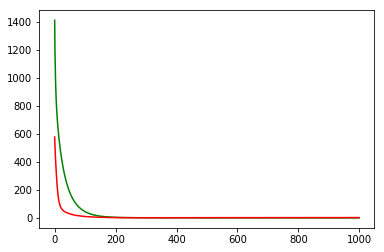

working on d,u and l,le 0.5 256 0.05 1e-05


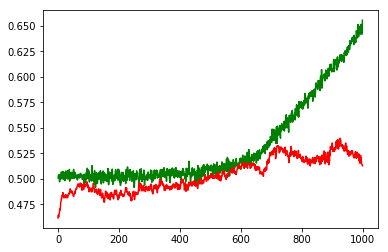

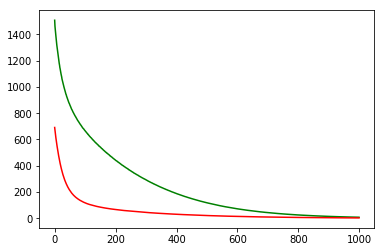

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.0001
Chart for BEST MODEL FOR: GILD


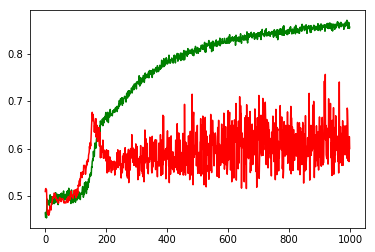

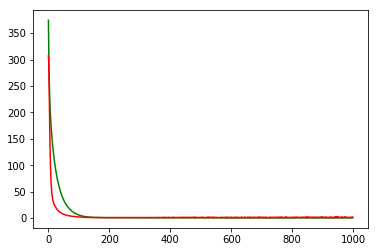

F1,score 0.7015221707478491
G-score: 0.4951522860826756
Accuracy 0.600177305175903
Window: 140
[[147 435]
 [ 16 530]]
Vol pos 2.9642641166565387
Vol neg 3.6510915437726994
Real Percentage of gain: -51.766532047583595
Percentage of gain: 0.3192947878856288
Total gain: 360.1645207349893
000000000000000000000000000000000000000000000000
Percentile:  0
[[ 74 265]
 [ 10 259]]
608/608 [==============================] - 0s 21us/step
[1.8221536833596856, 0.5476973684210527]
Percentile:  1
[[ 40  63]
 [  6 198]]
307/307 [==============================] - 0s 20us/step
[0.8675752831592622, 0.7752442996742671]
Percentile:  2
[[ 7  5]
 [ 0 70]]
82/82 [==============================] - 0s 55us/step
[0.10463755014466077, 0.9390243902439024]
Percentile:  3
[[ 6 35]
 [ 0  0]]
41/41 [==============================] - 0s 52us/step
[1.7493723194773605, 0.14634146341463414]
Percentile:  4
[[20 66]
 [ 0  0]]
86/86 [==============================] - 0s 32us/step
[2.6158298337182333, 0.23255813953488372]
00000

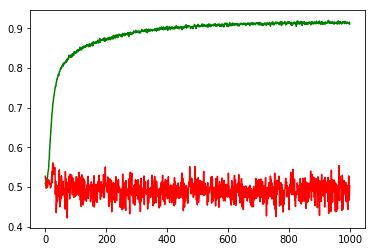

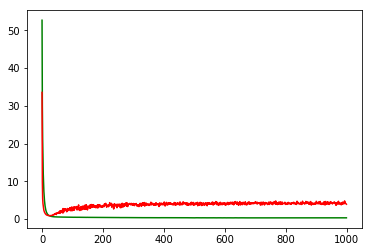

working on d,u and l,le 0.5 64 0.01 0.0001


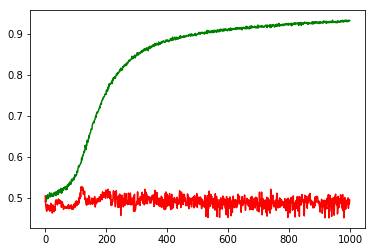

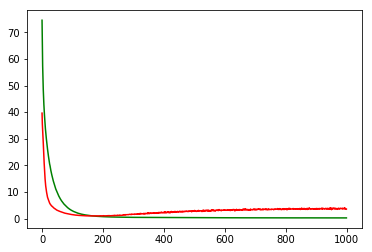

working on d,u and l,le 0.5 64 0.01 1e-05


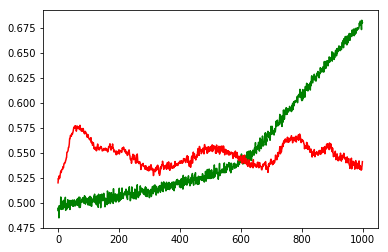

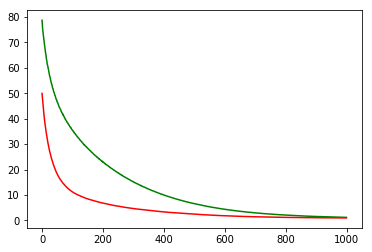

working on d,u and l,le 0.5 64 0.05 0.001


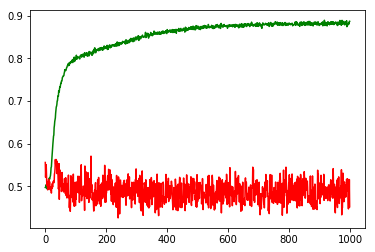

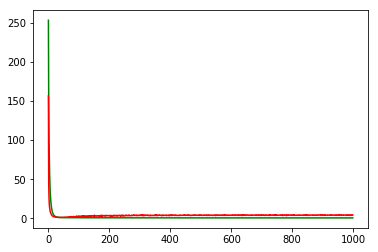

working on d,u and l,le 0.5 64 0.05 0.0001


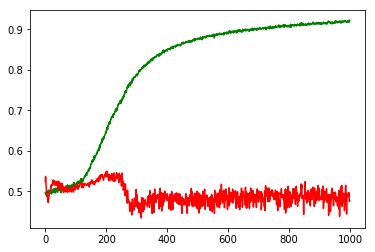

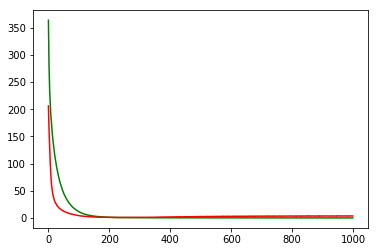

working on d,u and l,le 0.5 64 0.05 1e-05


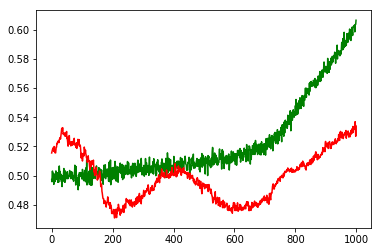

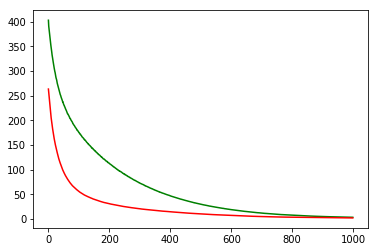

working on d,u and l,le 0.5 128 0.01 0.001


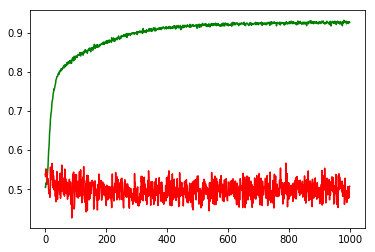

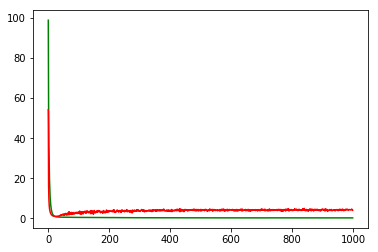

working on d,u and l,le 0.5 128 0.01 0.0001


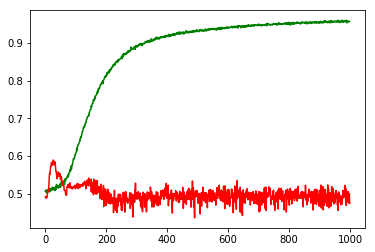

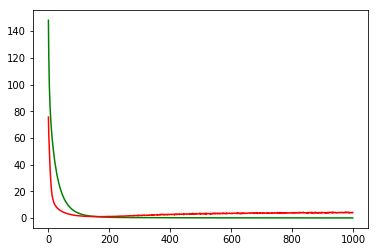

working on d,u and l,le 0.5 128 0.01 1e-05


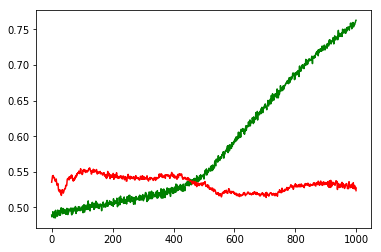

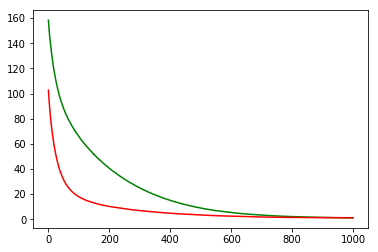

working on d,u and l,le 0.5 128 0.05 0.001


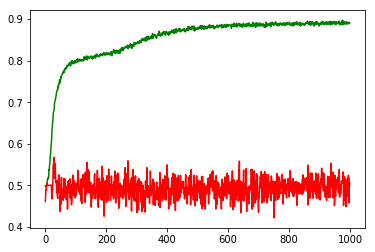

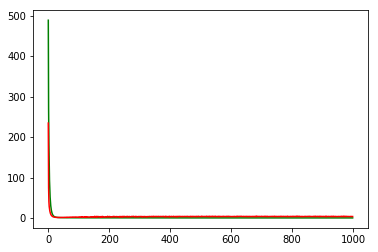

working on d,u and l,le 0.5 128 0.05 0.0001


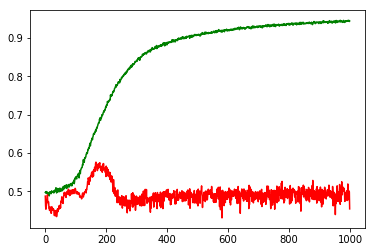

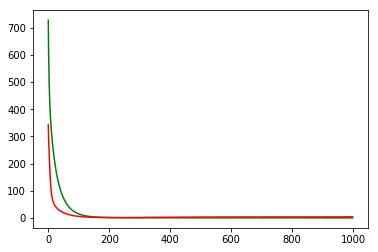

working on d,u and l,le 0.5 128 0.05 1e-05


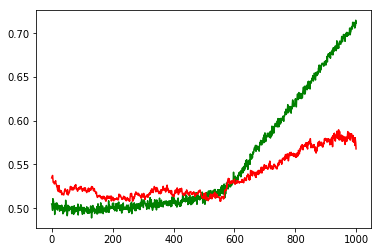

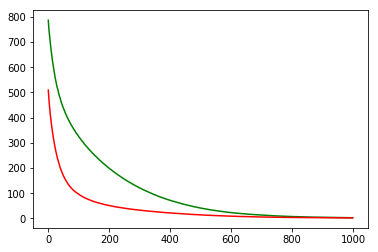

working on d,u and l,le 0.5 256 0.01 0.001


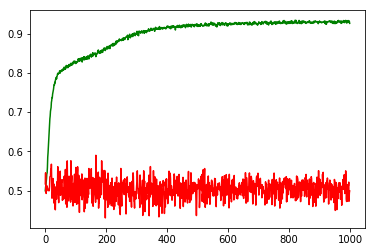

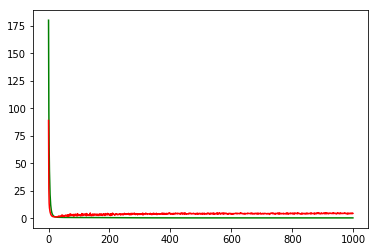

working on d,u and l,le 0.5 256 0.01 0.0001


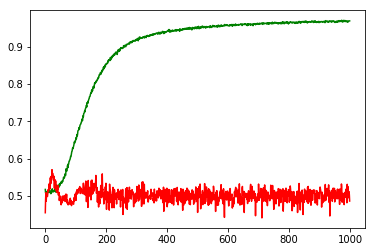

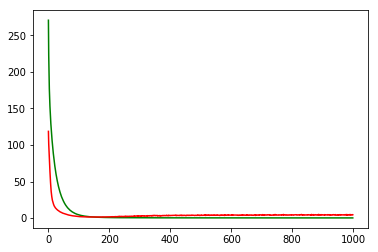

working on d,u and l,le 0.5 256 0.01 1e-05


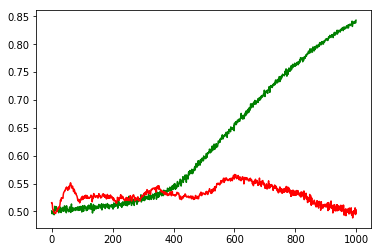

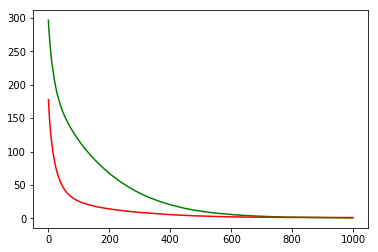

working on d,u and l,le 0.5 256 0.05 0.001


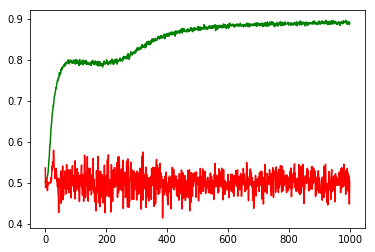

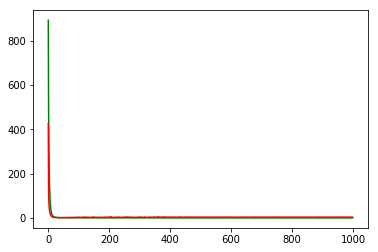

working on d,u and l,le 0.5 256 0.05 0.0001


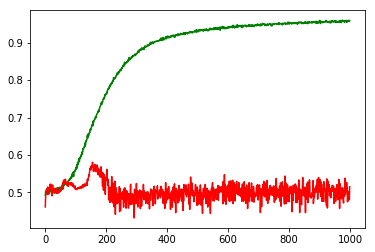

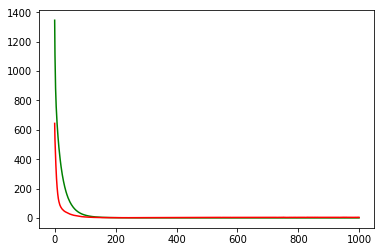

working on d,u and l,le 0.5 256 0.05 1e-05


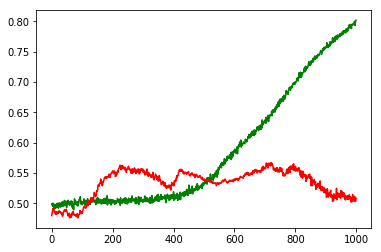

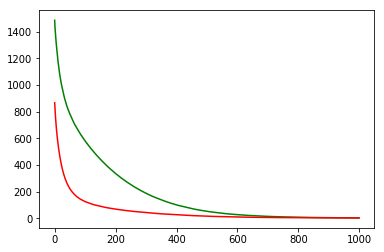

maxd,maxu,maxl,maxle: 0.5 128 0.05 1e-05
Chart for BEST MODEL FOR: COST


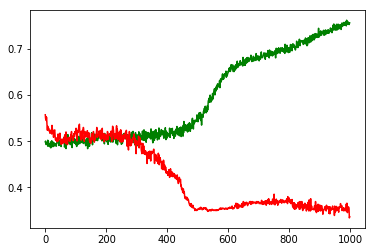

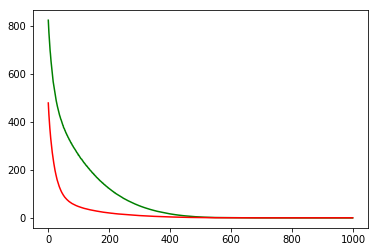

F1,score 0.21920668058455114
G-score: 0.3173493503137708
Accuracy 0.33629103839899865
Window: 140
[[274 111]
 [637 105]]
Vol pos 1.0458492043761114
Vol neg 1.5609476883116515
Real Percentage of gain: -165.01304994848707
Percentage of gain: -0.6843052550120401
Total gain: -771.2120223985692
000000000000000000000000000000000000000000000000
Percentile:  0
[[150  50]
 [142  45]]
387/387 [==============================] - 0s 30us/step
[0.9286893750962053, 0.5038759689922481]
Percentile:  1
[[ 69  35]
 [177  29]]
310/310 [==============================] - 0s 23us/step
[1.1567964976833713, 0.3161290322580645]
Percentile:  2
[[ 45  23]
 [192  13]]
273/273 [==============================] - 0s 25us/step
[1.2490308717056946, 0.21245421245421245]
Percentile:  3
[[ 9  3]
 [75  5]]
92/92 [==============================] - 0s 27us/step
[1.370487109474514, 0.15217391336741654]
Percentile:  4
[[ 0  0]
 [51 12]]
63/63 [==============================] - 0s 33us/step
[1.1650832796853685, 0.19047618669176

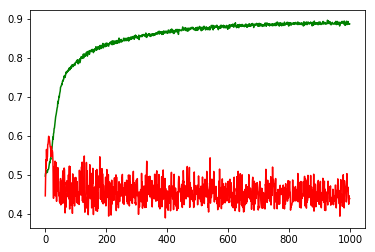

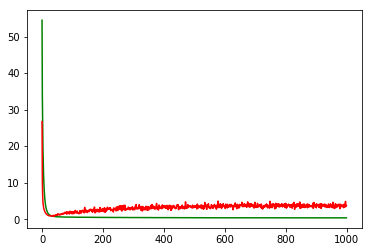

working on d,u and l,le 0.5 64 0.01 0.0001


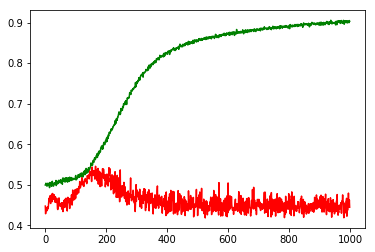

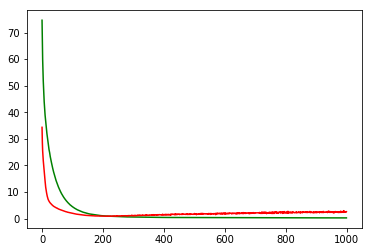

working on d,u and l,le 0.5 64 0.01 1e-05


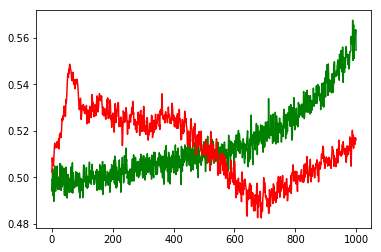

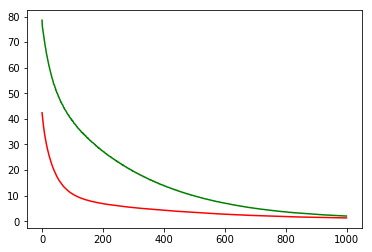

working on d,u and l,le 0.5 64 0.05 0.001


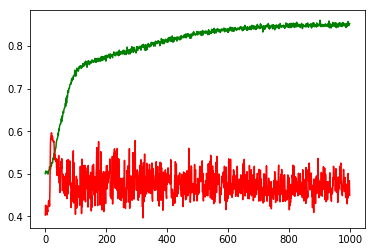

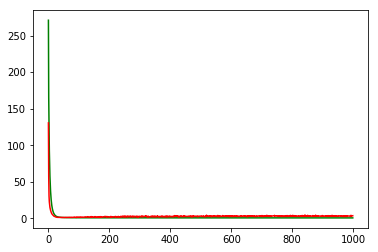

working on d,u and l,le 0.5 64 0.05 0.0001


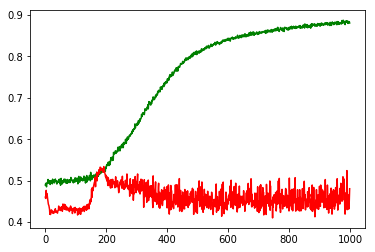

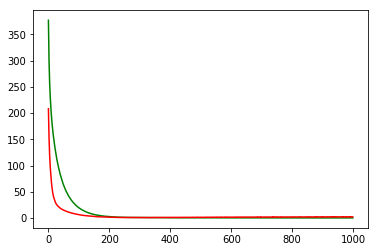

working on d,u and l,le 0.5 64 0.05 1e-05


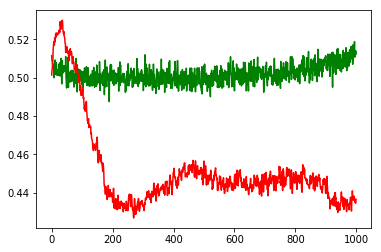

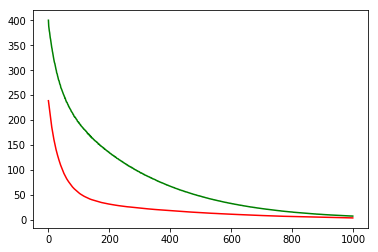

working on d,u and l,le 0.5 128 0.01 0.001


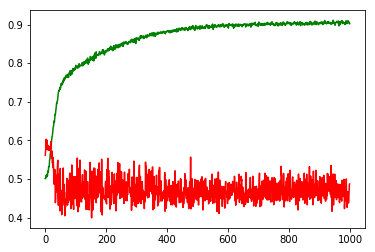

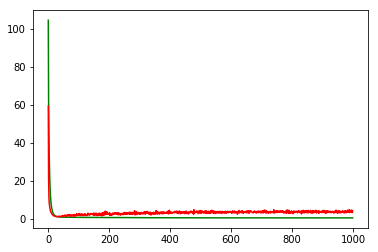

working on d,u and l,le 0.5 128 0.01 0.0001


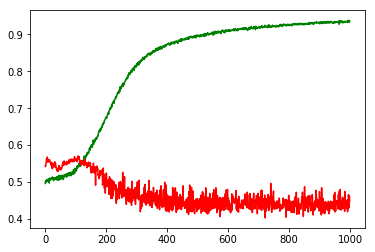

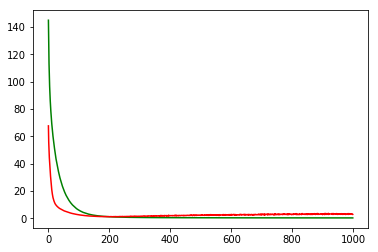

working on d,u and l,le 0.5 128 0.01 1e-05


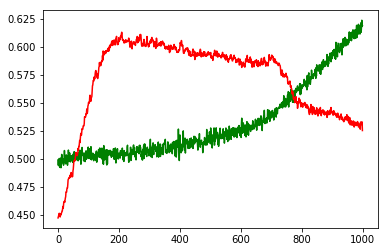

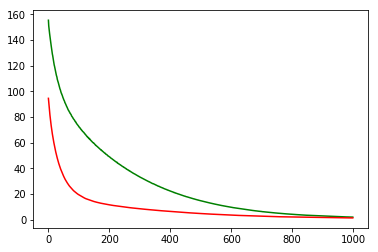

working on d,u and l,le 0.5 128 0.05 0.001


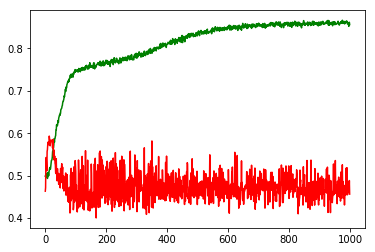

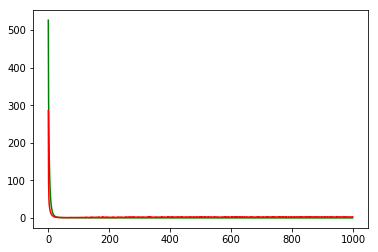

working on d,u and l,le 0.5 128 0.05 0.0001


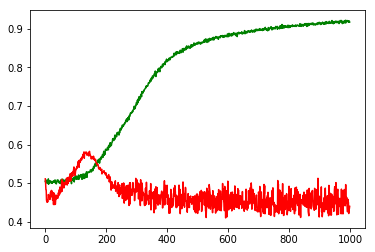

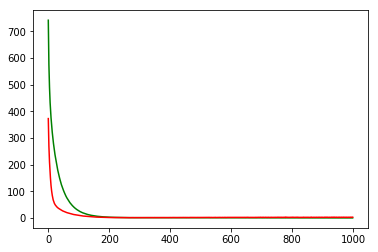

working on d,u and l,le 0.5 128 0.05 1e-05


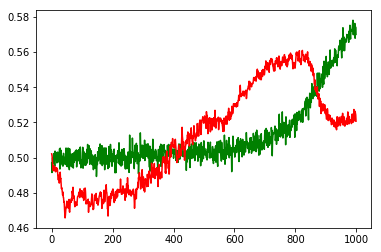

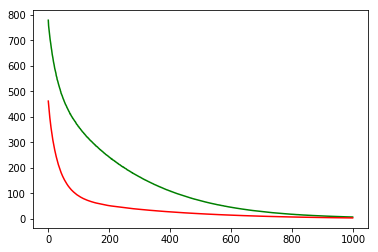

working on d,u and l,le 0.5 256 0.01 0.001


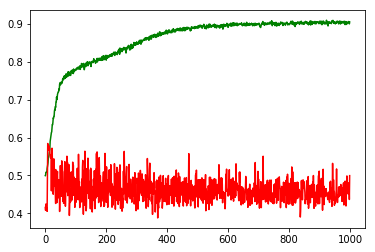

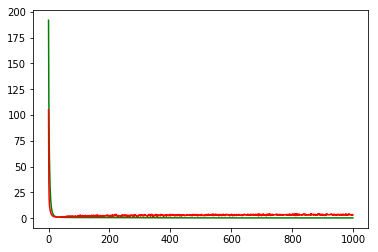

working on d,u and l,le 0.5 256 0.01 0.0001


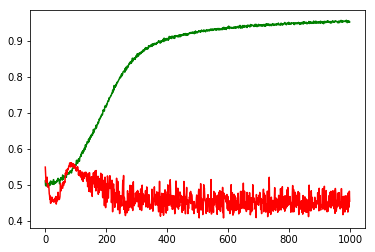

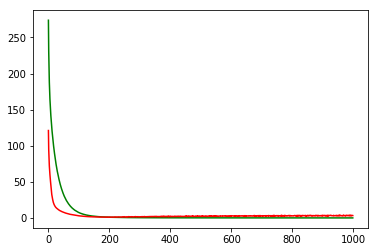

working on d,u and l,le 0.5 256 0.01 1e-05


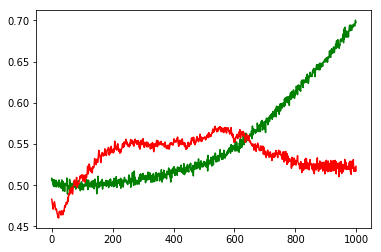

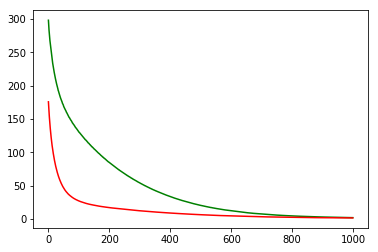

working on d,u and l,le 0.5 256 0.05 0.001


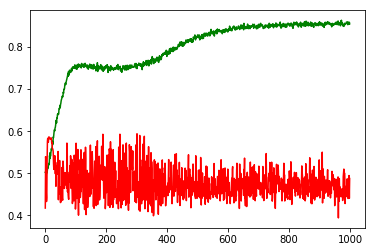

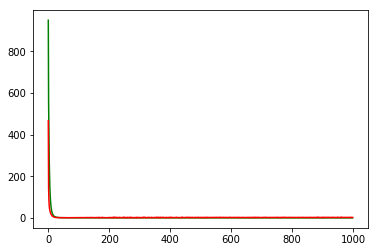

working on d,u and l,le 0.5 256 0.05 0.0001


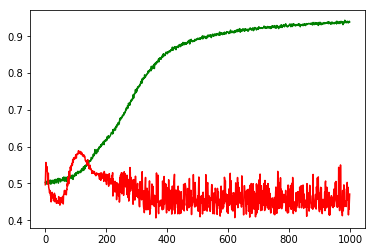

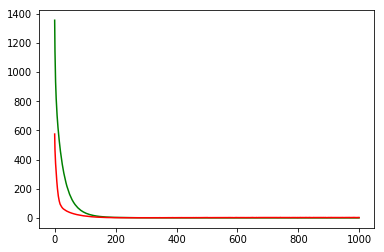

working on d,u and l,le 0.5 256 0.05 1e-05


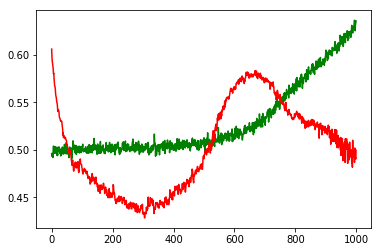

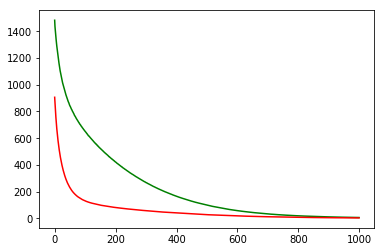

maxd,maxu,maxl,maxle: 0.5 64 0.05 0.001
Chart for BEST MODEL FOR: QCOM


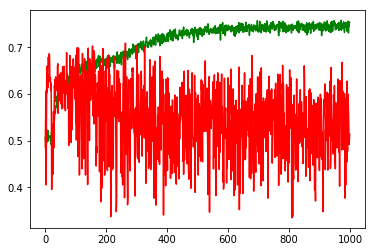

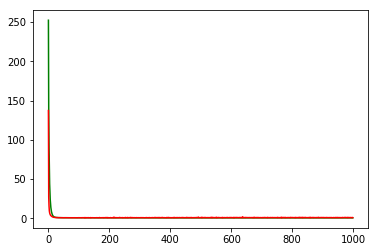

F1,score 0.5889387144992525
G-score: 0.5171587499444557
Accuracy 0.5137046859076759
Window: 140
[[187 168]
 [382 394]]
Vol pos 3.2777347882420558
Vol neg 3.4299916613353556
Real Percentage of gain: 24.311597472924255
Percentage of gain: 0.015798849013429525
Total gain: 17.86849823418879
000000000000000000000000000000000000000000000000
Percentile:  0
[[127 103]
 [131 168]]
529/529 [==============================] - 0s 33us/step
[0.8617556331739084, 0.5576559550820767]
Percentile:  1
[[ 11  37]
 [156 140]]
344/344 [==============================] - 0s 28us/step
[1.0169286312058914, 0.438953488372093]
Percentile:  2
[[10  8]
 [44 46]]
108/108 [==============================] - 0s 35us/step
[0.6677024563153585, 0.5185185207260979]
Percentile:  3
[[11  1]
 [36 32]]
80/80 [==============================] - 0s 42us/step
[0.6116241455078125, 0.5375]
Percentile:  4
[[28 18]
 [14  8]]
68/68 [==============================] - 0s 47us/step
[0.7475720293381635, 0.5294117647058824]
00000000000000000

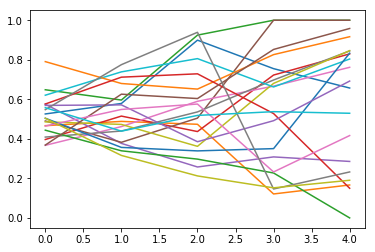

Ecco la matrice generale:
[[4471. 3005.]
 [7357. 6548.]]
Ecco le matrici per percentile
Percentile : 0
[[2607. 1675.]
 [3060. 2229.]]
Percentile : 1
[[ 910.  702.]
 [2400. 2258.]]
Percentile : 2
[[ 512.  313.]
 [1241. 1237.]]
Percentile : 3
[[352. 277.]
 [577. 547.]]
Percentile : 4
[[239. 190.]
 [222. 258.]]


In [4]:
import warnings
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import MinMaxScaler
warnings.filterwarnings('ignore')
o=0
accstocksresults=[]
f1stocksresults=[]
f1scoreresults=[]
aucresults=[]
chartlist=[]
gainlist=[]
pricegainlist=[]
totalconfusion=np.zeros((2,2))
confusionlist=[]
for con in range(0,5):
    confusionlist.append(np.zeros((2,2)))

for price in prices:
    #print('New price[[[[[[[[[[[[[[[[[[[[[[[[[[[[[[[]]]]]]]]]]]]]]]]]]]]]]]]]]]]]]]')
    
   
    print('Working on...',files[o])
    
    senttemp=sentiment[o]
    senttemp=np.nan_to_num(np.asarray(senttemp, dtype=float))
    
    xtemp=price
    o+=1
    xtemp=np.nan_to_num(np.asarray(xtemp, dtype=float))
    
    #print(xtemp)
    accintime=[]
    trendwindowtime=[140]
    f1total=[]
    acctotal=[]
    auctotal=[]
    percfinal=[]
    f1scoretotal=[]
    percpostotal=[]
    percnegtotal=[]
    for t in trendwindowtime:
        #1
    #label because of the maket and append values without data
    #simo theroy past trend
        
        x=[]
        y=[]
        percentage=[]
        
        yvolatility=[]
        yprice=[]
        #print('============================================================')
        #print('Working on window:',t)
        #print(len(xtemp))
        ##QUI C E L'UNICO APPUNTO GUARDA SE CON +1 CAMBIA
        
        for i in range(0,len(price)-t-1):
            s=np.sign(price.iloc[i+t+1]['close']-price.iloc[i+1]['open'])
            percentage.append((100*(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))/price.iloc[i+1]['open']) 
            if(s==-1):
                y.append(0)
            else:
                y.append(1)
            yvolatility.append((100*abs(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))/price.iloc[i+1]['open'])
            yprice.append(abs(price.iloc[i+t+1]['close']-price.iloc[i+1]['open']))
            x.append(np.concatenate((senttemp[i],xtemp[i])))
        
        y=np.array(y)
        x=np.array(x)
        scaler = MinMaxScaler() 
        scaler.fit(x)
        MinMaxScaler(copy=True, feature_range=(0, 1))
        x=scaler.transform(x)
        yvolatility=np.array(yvolatility)
       
        permindex=range(0,len(x))
        #permindex=np.random.permutation(permindex)
        train=0.8
        nt=math.ceil(len(x)*train)
        trainvalindex=permindex[0:nt]
        testindex=permindex[nt:]
        x_tv=[]
        y_tv=[]
        x_test=[]
        y_test=[]
        x_tv=x[trainvalindex]
        y_tv=y[trainvalindex]
        x_test=x[testindex]
        y_test=y[testindex]
        yvolatilitytest=yvolatility[testindex]
        #create structure for percentile valuation
        distribution=[]
        print(max(yvolatilitytest))
        print(min(yvolatilitytest))
        step=(max(yvolatilitytest)-min(yvolatilitytest))/5
        for v in range(0,5):
            pindexes=[]
            for r in range(0,len(y_test)):
                if(yvolatilitytest[r]<min(yvolatilitytest)+step+step*v and yvolatilitytest[r]>min(yvolatilitytest)+step*v):
                    pindexes.append(r)
            distribution.append(pindexes)
            
        lspace=[0.01,0.05]
        dropspace=[0.5]
        uspace=[64,128,256]
        learnspace=[0.001,0.0001,0.00001]
        bestsvm=None
        bestca=[]
        bestcl=[]
        maxacc=0
        cvacc=0
        maxu=0
        maxl=0
        maxd=0
        maxle=0
        #print('Model Selection...')
        #model selection
        cvacc=0
        totu=0
        for d in dropspace:
            for u in uspace:
                #print()
                for l in lspace:
                    for le in learnspace:
                    
                   
                        print('=========================================================')
                        print('working on d,u and l,le',d,u,l,le)

                        cvacclist=[]
                        #faccio cross validation
                        #start with 40% as train and 10% for validation and then i move in percentege
                        # 0-40 40-50
                        # 0-50 50-60
                        # 0-60 60-70 
                        #etc test set is completely external i do in some way error extimation changin the ticker
                        trainpoint=math.floor(len(x_tv)*0.40)
                        dimval=math.floor(trainpoint*0.25)
                        endval=trainpoint+dimval
                        
                        for i in range(0,6):
                            model=buildModel(l,u,d,le)
                            #print('-----')
                            x_train=x_tv[0:trainpoint]
                            y_train=y_tv[0:trainpoint]
                            x_val=x_tv[trainpoint:endval]
                            y_val=y_tv[trainpoint:endval]

                            trainpoint=trainpoint+dimval
                            endval=endval+dimval

                            x_train,y_train=smote(x_train,y_train)
                            if(sum(y_val)+6<len(x_val) and sum(y_val)>6):
                                x_val,y_val=smote(x_val,y_val)
                            else:
                                totu=totu+1

                            history=model.fit(x_train, y_train, epochs = 1000,batch_size =128, verbose=0, validation_data=(x_val, y_val),
                                              shuffle=True)
                            prediction=model.predict(x_val, batch_size=128, verbose=0)
                            for el in range(0,len(prediction)):
                                if(prediction[el]>0.5):
                                    prediction[el]=1
                                else:
                                    prediction[el]=0

                            

                            if(i==0):
                                meanhvl=np.asarray(history.history['val_loss'])
                                meanhva=np.asarray(history.history['val_acc'])
                                meanhl=np.asarray(history.history['loss'])
                                meanha=np.asarray(history.history['acc'])

                            else:
                                meanhvl=np.add(meanhvl,history.history['val_loss'])
                                meanhva=np.add(meanhva,history.history['val_acc'])
                                meanha=np.add(meanha,history.history['acc'])
                                meanhl=np.add(meanhl,history.history['loss'])
                            
                            #i take the last one
                            #maxAcc=history.history['val_acc'][len(history.history['val_acc'])-1]
                            #USING G SCORE AS MODEL SELECTION METRIC
                            maxAcc=geometric_mean_score(y_val, prediction)
                            cvacclist.append(maxAcc)
                            model=None
                            history=None
                            
                            del model
                            del history
                            gc.collect()
                            tf.reset_default_graph()
                            K.clear_session()

                        cvacc=sum(cvacclist)/len(cvacclist)
                        if(cvacc>maxacc):
                            maxacc=cvacc
                            maxu=u
                            maxl=l
                            maxle=le
                            maxd=d


                        meanhvl=meanhvl/6
                        meanhva=meanhva/6
                        meanhl=meanhl/6
                        meanha=meanha/6

                        plt.plot(meanha,'g')
                        plt.plot(meanhva,'r')
                        plt.show()
                        plt.plot(meanhl,'g')
                        plt.plot(meanhvl,'r')
                        plt.show()

                        print('=========================================================')
        model=buildModel(maxl,maxu,maxd,maxle)
        x_tv,y_tv=smote(x_tv,y_tv)
        history=model.fit(x_tv, y_tv, epochs =1000,batch_size =128, verbose=0, validation_data=(x_test, y_test),
                                          shuffle=True)
        prediction=model.predict(x_test, batch_size=128, verbose=0)
        predictionscsv = pd.DataFrame(data=prediction,columns=[files[o-1]])
        tempdate=np.array(dates[o-1])
        predictionscsv.index = tempdate[testindex]
        predictionscsv.to_csv('/home/andrea/Desktop/NLFF/technicalAnalysis/NN/Predictions/Newsetting/newwithadam/both/'+files[o-1]+'.csv')
      
        for el in range(0,len(prediction)):
            if(prediction[el]>0.5):
                prediction[el]=1
            else:
                prediction[el]=0
            
        
        
        print('=========================================================')
        print('=========================================================')
        print('=========================================================')
        print('=========================================================')
        print('maxd,maxu,maxl,maxle:',maxd,maxu,maxl,maxle)
        print('Chart for BEST MODEL FOR:',files[o-1])
        plt.plot(history.history['acc'],'g')
        plt.plot(history.history['val_acc'],'r')
        plt.show()
        plt.plot(history.history['loss'],'g')
        plt.plot(history.history['val_loss'],'r')
        plt.show()
        acctotal.append(history.history['val_acc'][len(history.history['val_acc'])-1])
        confmatrix=confusion_matrix(y_test, prediction,labels=[0,1])
        totalconfusion=totalconfusion+confmatrix
        volr=[]
        voln=[]
        pricegain=0
        for j in range(0,len(x_test)):
            if(y_test[j]==prediction[j]):
                volr.append(yvolatilitytest[j])
                pricegain=pricegain+yprice[j]
            else:
                voln.append(yvolatilitytest[j])
                pricegain=pricegain-yprice[j]
        
        CM = f1_score(y_test, prediction)
        fpr, tpr, thresholds = metrics.roc_curve(y_test, prediction)
        auc=metrics.auc(fpr, tpr)
        valueacc=geometric_mean_score(y_test, prediction)
        
        print('F1,score',CM)
        print('G-score:',valueacc)
        realacc=history.history['val_acc'][len(history.history['val_acc'])-1]
        accstocksresults.append(realacc)
        print('Accuracy',realacc)
        print('Window:',t)
        print(confmatrix)
        print('Vol pos',sum(volr)/len(volr))
        print('Vol neg',sum(voln)/len(voln))
        percnegtotal.append(sum(volr)/len(volr))
        percpostotal.append(sum(voln)/len(voln))
        #build structure to plot distribution onver percentile
        chart=np.zeros(5)
        for r in range(0,len(y_test)):
            for v in range(0,5):
                if(yvolatilitytest[r]<min(yvolatility)+step+step*v and yvolatilitytest[r]>min(yvolatility)+step*v):
                    chart[v]+=1
        #plt.plot(chart)
        #plt.show()
        print('Real Percentage of gain:',(pricegain*100)/(sum(price.iloc[1:6]['open'])))
        pricegainlist.append((pricegain*100)/(sum(price.iloc[1:6]['open'])))
        print('Percentage of gain:',(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        print('Total gain:',len(y_test)*(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        gainlist.append(len(y_test)*(sum(volr)-sum(voln))/(len(volr)+len(voln)))
        print('000000000000000000000000000000000000000000000000')
        #performances for each percentile
        chartscore=[]
        for g in range(0,len(distribution)):
            print('Percentile: ',g)
            tempscore=0
            if(len(distribution[g])>0):
                predictionp=model.predict(x_test[distribution[g]])
                for el in range(0,len(predictionp)):
                    if(predictionp[el]>0.5):
                        predictionp[el]=1
                    else:
                        predictionp[el]=0
                tempmatrix=confusion_matrix(y_test[distribution[g]], predictionp)
                confusionlist[g]=confusionlist[g]+tempmatrix
                print(tempmatrix)
                print(model.evaluate(x_test[distribution[g]],y_test[distribution[g]]))
                tempscore=model.evaluate(x_test[distribution[g]],y_test[distribution[g]], verbose=0)
            chartscore.append(tempscore[1])    
        chartlist.append(chartscore)
        print('000000000000000000000000000000000000000000000000')
        del model
        del history
print('Mean acc over portfolio:',sum(accstocksresults)/len(accstocksresults))
print('Mean gain over portfolio : ', sum(gainlist)/len(gainlist))
print('Real mean gain over portfolio',sum(pricegainlist)/len(pricegainlist))
#print all the accuracy varing the percentile
for st in range(0,len(chartlist)):
    plt.plot(chartlist[st])
plt.show()
print('Ecco la matrice generale:')
print(totalconfusion)
print('Ecco le matrici per percentile')
for i in range(0,len(confusionlist)):
    print('Percentile :',i)
    print(confusionlist[i])        

        

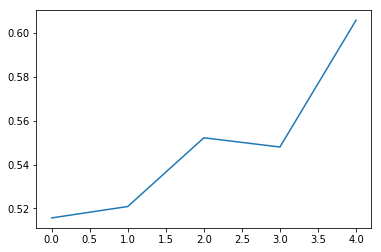

In [5]:
tot=np.zeros(5)
for st in range(0,len(chartlist)):
    tot=chartlist[st]+tot
    
tot=tot/len(chartlist)
plt.plot(tot)
plt.show()